# Fitness Function

In [4]:
!pip install tensorflow

  Running setup.py bdist_wheel for gast: started
  Running setup.py bdist_wheel for gast: finished with status 'done'
  Stored in directory: C:\Users\Fatty\AppData\Local\pip\Cache\wheels\9a\1f\0e\3cde98113222b853e98fc0a8e9924480a3e25f1b4008cedb4f
  Running setup.py bdist_wheel for termcolor: started
  Running setup.py bdist_wheel for termcolor: finished with status 'done'
  Stored in directory: C:\Users\Fatty\AppData\Local\pip\Cache\wheels\7c\06\54\bc84598ba1daf8f970247f550b175aaaee85f68b4b0c5ab2c6
  Running setup.py bdist_wheel for absl-py: started
  Running setup.py bdist_wheel for absl-py: finished with status 'done'
  Stored in directory: C:\Users\Fatty\AppData\Local\pip\Cache\wheels\a0\f8\e9\1933dbb3447ea6ef57062fd5461cb118deb8c2ed074e8344bf
  Running setup.py bdist_wheel for html5lib: started
  Running setup.py bdist_wheel for html5lib: finished with status 'done'
  Stored in directory: C:\Users\Fatty\AppData\Local\pip\Cache\wheels\50\ae\f9\d2b189788efcf61d1ee0e36045476735c838898

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
from keras.models import Sequential, load_model
from keras.layers.core import Dense, Dropout
from keras.layers.recurrent import LSTM

def normalize(df):
    newdf= df.copy()
    min_max_scaler = preprocessing.MinMaxScaler()
    for feature in df.columns:
        newdf[feature] = min_max_scaler.fit_transform(df[feature].values.reshape(-1,1))
    return newdf
    
def data_helper(df, time_frame, train_rate):
    # Feature number
    number_features = len(df.columns)
    datavalue = df.as_matrix()
    x_result = []    
    y_result = []
    for index in range(len(datavalue)-time_frame):
        x_result.append(datavalue[index: index + time_frame])
        y_result.append(datavalue[index + time_frame][:5])  # test for all value
    x_result = np.array(x_result)
    y_result = np.array(y_result)

    number_train = round((1 - train_rate) * x_result.shape[0])
    x_train, x_test = x_result[:int(number_train)], x_result[int(number_train) :]
    y_train, y_test = y_result[:int(number_train)], y_result[int(number_train) :]
    
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], number_features))
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], number_features))

    return [x_train, y_train, x_test, y_test]

def build_model(input_length, df, cell, layers, dropout):
    print(len(df.columns))
    number_features = len(df.columns)
    model = Sequential()
    for _ in range(layers):
        model.add(LSTM(cell, input_shape=(input_length, number_features), return_sequences=True))
        model.add(Dropout(dropout))
    model.add(LSTM(cell, input_shape=(input_length, number_features), return_sequences=False))
    model.add(Dropout(dropout))
    model.add(Dense(16,kernel_initializer="uniform",activation='relu'))
    model.add(Dense(5,kernel_initializer="uniform",activation='linear')) # CELL_SIZE 5, output dim
    model.compile(loss='mse',optimizer='adam', metrics=['accuracy']) # mae
    return model

def denormalize(df, norm_value):
    denorm_value = []

    #norm_value = norm_value.T

    pre_df = pd.DataFrame(norm_value, columns = df.columns[:5])
    for feature in df.columns[:5]:
        
        original_value = df[feature].values.reshape(-1,1)
        denorm_column = pre_df[feature].values.reshape(-1,1)
    
        min_max_scaler = preprocessing.MinMaxScaler()
        min_max_scaler.fit_transform(original_value)
        denorm_value.append(min_max_scaler.inverse_transform(denorm_column))
    return denorm_value

def generate_model(parameters, df, csvfile):
    time_step, train_rate, cell_size, layers_num, batchsize, epochs_num, dropout_rate, activation_1, activation_2, validation_rate = parameters
    df_norm= normalize(df)
    X_train, y_train, X_test, y_test = data_helper(df_norm, time_step, train_rate)
    model = build_model(time_step, df, cell_size, layers_num, dropout_rate)
    model.fit( X_train, y_train, batch_size=batchsize, epochs=epochs_num, validation_split=validation_rate, verbose=1)
    
    pred = model.predict(X_test) # model.predict(data set)

    denorm_pred = denormalize(df, pred)
    denorm_ytest = denormalize(df, y_test)
    
    #print(model.summary()) # model summary
    #print(model.get_config()) # model configuration
    model_path = csvfile[:-4] + '_model.md' 
    model.save(model_path)
    
    #%matplotlib inline  
    for i in range(5):
        plt.plot(denorm_pred[i],color='red', label='Prediction')
        plt.plot(denorm_ytest[i],color='blue', label='Answer')
        plt.legend(loc='best')
        plt.show()
    score = model.evaluate(X_test, y_test, batch_size=batchsize)
    print(denorm_pred)
    return score[0]

def main():
    #chromosom_value=[[10,20,30],[0.1,0.2,0.3],[16,32,64,128,256],[1,2,3],[100,200,300],[100,200,300],[0.1,0.2,0.3,0.4,0.5],["sigmoid","relu","linear"],["sigmoid","relu","linear"],[0.1,0.2,0.3]]
    # 1. TIME_FRAME = [10,20,30] # input資料維度
    # 2. TRAIN_RATE = [0.1,0.2,0.3] # 切割train, test資料比例
    # 3. CELL_SIZE = ：[16,32,64,128,256] # hidden Layer中memory cells
    # 4. LAYERS_NUM = ：[1,2,3] # Layer數
    # 5. BATCH_SIZE = ：[100,200,300] # 每次批次投入資料量
    # 6. EPOCHS_NUM =  [100,200,300] # 迭代數
    # 7. DROPOUT_RATE = [0.1,0.2,0.3,0.4,0.5]3 # Dropout 比例
    # 8. activation = '' # 第一層 activation ：["sigmoid","relu","linear"],
    # 9. activation = '' # 第二層 activation ：["sigmoid","relu","linear"],
    # 10.validation rate ：[0.1,0.2,0.3]
    ''' load all csv
    csv_files =[i for i in fnmatch.filter(os.listdir('.'), '*.csv')]
    for file in csv_files:
        foxconndf= pd.read_csv(file, index_col=0 )
        foxconndf.dropna(how='any',inplace=True) # remove the rows with blank
        foxconndf = foxconndf.drop(['Date'], axis=1)
        # 調整 foxconndf columns
    ''' 

    foxconndf= pd.read_csv('featured/0050_close.csv', index_col=0 )
    foxconndf.dropna(how='any',inplace=True) # remove the rows with blank
    foxconndf = foxconndf.drop(['Date'], axis=1)
    # 調整 foxconndf columns
    test = [5,0.1,50,2,None,100,0.3,'relu','linear', 0.1] # 參數list範例
    score = generate_model(test, foxconndf, '0051.csv')
    print(score)
# if __name__ == '__main__':
#     main()

# GA Function

In [7]:
chromosom_value=[[10,20,30],[0.1,0.2,0.3],[16,32,64,128,256],[1,2,3],[100,200,300],[50,51],[0.1,0.2,0.3,0.4,0.5],["sigmoid","relu","linear"],["sigmoid","relu","linear"],[0.1,0.2,0.3]]

import random
def createrandomList(create_number,category):
    list_random = [ random.randint(0,category) for i in range(create_number)]
    return(list_random)

#init create population chromosome(100)--function input：filename & population, output：population_list 
def create_population(population):
    population_list=[]
    for popu in range(population):
        chromosome_create=[]
        for index in chromosom_value:
            chromosome_create.append(index[createrandomList(1,len(index)-1)[0]]) #從chromosom_value隨機產生一個值塞到
        population_list.append(chromosome_create)
    return population_list

def cross(cross_rate,chromosome_1,chromosome_2):
    random_rate=random.random()
    if(random_rate>cross_rate):
        point_1=random.randint(0,len(chromosome_1)-1)
        point_2=random.randint(0,len(chromosome_1)-1)

        while(point_1>=point_2):
            point_1=random.randint(0,len(chromosome_1)-1)
            point_2=random.randint(0,len(chromosome_1)-1)

#         print("cross_point1: "+str(point_1))
#         print("cross_point2: "+str(point_2))
#         print("cross_len_chromosome_1= "+str(len(chromosome_1)))
#         print("cross_len_chromosome_2= "+str(len(chromosome_2)))

        tmp=0
        for index in range(point_1,point_2+1):
            tmp=chromosome_1[index]
            chromosome_1[index]=chromosome_2[index]
            chromosome_2[index]=tmp
    return chromosome_1

def mutation(mutation_rate,chromosome):
    random_rate=random.random()
    if(random_rate>mutation_rate):
#         print("mutation_start")
        point_1=random.randint(0,len(chromosome)-1)#產生二個隨機point1 & point2 為了到時候mutation
        point_2=random.randint(0,len(chromosome)-1)
        while(point_1==point_2):#如果point1 point2 一樣要重新產生
            point_1=random.randint(0,len(chromosome)-1)
            point_2=random.randint(0,len(chromosome)-1)
#         print("mu_point1= "+str(point_1))
#         print("mu_point2= "+str(point_2))

        tmp=chromosome[point_1]#改變染色體中第point1的值，如果產生的新值與舊的一樣要再重新產生
        #chromosome[point_1]值等於chromosom_value裡面隨機產生的一個值createrandomList(1,len(chromosom_value[point_1])-1)[0]
        chromosome[point_1]=chromosom_value[point_1][createrandomList(1,len(chromosom_value[point_1])-1)[0]]#
        while(tmp==chromosome[point_1]):
            chromosome[point_1]=chromosom_value[point_1][createrandomList(1,len(chromosom_value[point_1])-1)[0]]

        tmp_2=chromosome[point_2]#改變染色體中第point2的值，如果產生的新值與舊的一樣要再重新產生
        chromosome[point_2]=chromosom_value[point_2][createrandomList(1,len(chromosom_value[point_2])-1)[0]]
        while(tmp_2==chromosome[point_2]):
            chromosome[point_2]=chromosom_value[point_2][createrandomList(1,len(chromosom_value[point_2])-1)[0]]
    return chromosome

def calculateY_rank(rank_number,population_list,filename):
    result_all_x_fitness=[]#記錄所有population與產生的y
    best_result=[]#記錄最好的population&y
    
    foxconndf= pd.read_csv(filename, index_col=0 )
    foxconndf.dropna(how='any',inplace=True) # remove the rows with blank
#     foxconndf = foxconndf.drop(['Date'], axis=1)
    # 調整 foxconndf columns
#     test = [5,0.1,50,2,None,100,0.3,'relu','linear', 0.1] # 參數list範例
#     score = generate_model(test, foxconndf, '0051.csv')
    
    for index in population_list:
        fitness_value=generate_model(index, foxconndf, filename)#calculate fintness_value
        result_all_x_fitness.append([fitness_value,index])
    
    result_rank=[]#record before rank"s x & fitness_value
    for index in range(0,rank_number):
        result_rank.append(sorted(result_all_x_fitness,reverse=True)[index])#sort:big->small
    best_result=result_rank[0]
    
    x_final=[]#記錄前十五名的染色體
    for index in result_rank:
        x_final.append(index[1])
    return [x_final,best_result]

#產生新的X(上一代最好的前15個交配+突變產生新的15個+隨機產生85個新的x)--function
def create_new_x(rank_number,population,cross_rate,mutation_rate,x_final):
    new_x=[]
    #先把前15名的染色體做交配&突變->產生新15個染色體
    for index in range(0,rank_number):
        other_ch=createrandomList(1,rank_number-1)[0]
        while(index==other_ch):
            other_ch=createrandomList(1,rank_number-1)[0] #變矩陣要減1 if index= other_ch -> create other_ch again
        print("i_th chromosome: "+str(index))
        print("other_random_chromosome: "+str(other_ch))
        cross_result=cross(cross_rate,x_final[index],x_final[other_ch])
        new_x.append(mutation(mutation_rate,cross_result))

    #隨機產生第16~100的染色體
    for index in range(0,population-rank_number):
        new_x.append(create_population(1)[0])
    return new_x

# Main: LSTM_out5 + GA

Start GA: 2018-06-03 00:03:27.768297

iteration_now= 1
78


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


Train on 611 samples, validate on 263 samples
Epoch 1/50
611/611 [==============================] - 57s 94ms/step - loss: 0.0700 - acc: 0.0622 - val_loss: 0.1536 - val_acc: 0.0000e+00
Epoch 2/50
611/611 [==============================] - 2s 4ms/step - loss: 0.0530 - acc: 0.0622 - val_loss: 0.0833 - val_acc: 0.0000e+00
Epoch 3/50
611/611 [==============================] - 2s 4ms/step - loss: 0.0268 - acc: 0.0622 - val_loss: 0.0374 - val_acc: 0.0000e+00
Epoch 4/50
611/611 [==============================] - 2s 4ms/step - loss: 0.0253 - acc: 0.0622 - val_loss: 0.0453 - val_acc: 0.0000e+00
Epoch 5/50
611/611 [==============================] - 2s 4ms/step - loss: 0.0199 - acc: 0.0671 - val_loss: 0.0540 - val_acc: 0.0000e+00
Epoch 6/50
611/611 [==============================] - 2s 4ms/step - loss: 0.0201 - acc: 0.0573 - val_loss: 0.0479 - val_acc: 0.0000e+00
Epoch 7/50
611/611 [==============================] - 3s 4ms/step - loss: 0.0201 - acc: 0.0736 - val_loss: 0.0438 - val_acc: 0.0000e+00


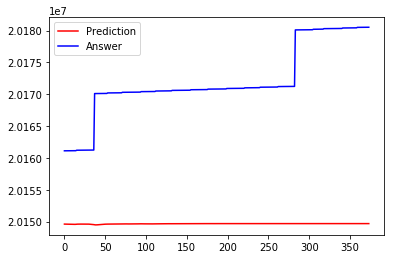

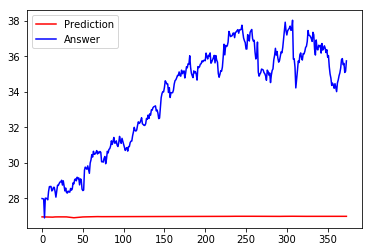

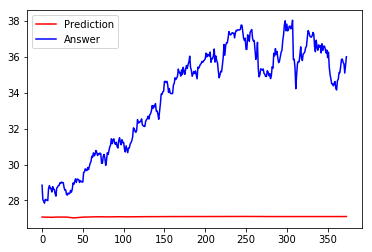

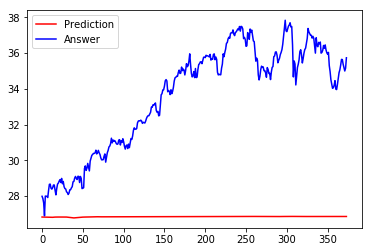

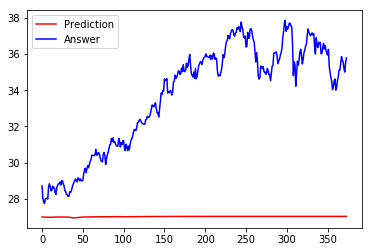

374/374 [==============================] - 0s 1ms/step
[array([[ 20149596.],
       [ 20149592.],
       [ 20149580.],
       [ 20149570.],
       [ 20149570.],
       [ 20149568.],
       [ 20149568.],
       [ 20149568.],
       [ 20149562.],
       [ 20149562.],
       [ 20149558.],
       [ 20149558.],
       [ 20149556.],
       [ 20149556.],
       [ 20149572.],
       [ 20149582.],
       [ 20149588.],
       [ 20149594.],
       [ 20149596.],
       [ 20149596.],
       [ 20149596.],
       [ 20149596.],
       [ 20149600.],
       [ 20149598.],
       [ 20149598.],
       [ 20149594.],
       [ 20149592.],
       [ 20149594.],
       [ 20149596.],
       [ 20149598.],
       [ 20149590.],
       [ 20149578.],
       [ 20149562.],
       [ 20149554.],
       [ 20149544.],
       [ 20149536.],
       [ 20149514.],
       [ 20149488.],
       [ 20149472.],
       [ 20149468.],
       [ 20149480.],
       [ 20149492.],
       [ 20149506.],
       [ 20149528.],
       [ 20149536.],

Train on 898 samples, validate on 225 samples
Epoch 1/51
898/898 [==============================] - 55s 62ms/step - loss: 0.0979 - acc: 0.0668 - val_loss: 0.4573 - val_acc: 0.0578
Epoch 2/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0431 - acc: 0.0367 - val_loss: 0.1754 - val_acc: 0.0578
Epoch 3/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0291 - acc: 0.4521 - val_loss: 0.2575 - val_acc: 0.5867
Epoch 4/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0276 - acc: 0.4688 - val_loss: 0.2255 - val_acc: 0.5867
Epoch 5/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0266 - acc: 0.2940 - val_loss: 0.2276 - val_acc: 0.5867
Epoch 6/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0262 - acc: 0.4644 - val_loss: 0.2196 - val_acc: 0.5867
Epoch 7/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0241 - acc: 0.4922 - val_loss: 0.2142 - val_acc: 0.5867
Epoch 8/51
898/898 [========

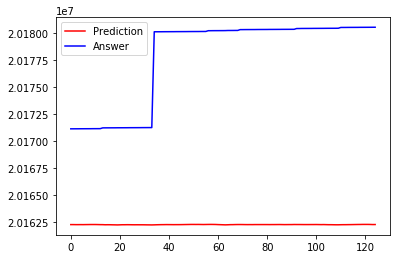

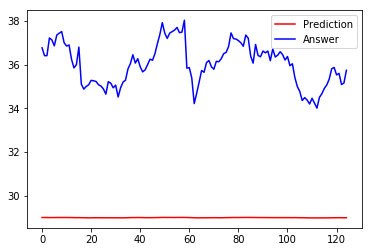

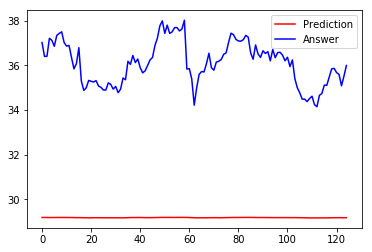

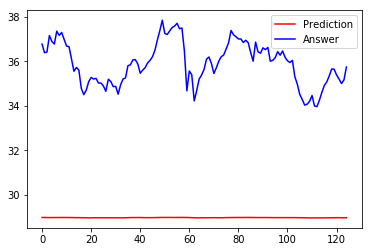

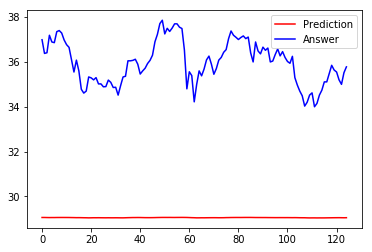

125/125 [==============================] - 0s 1ms/step
[array([[ 20162244.],
       [ 20162244.],
       [ 20162240.],
       [ 20162240.],
       [ 20162242.],
       [ 20162240.],
       [ 20162244.],
       [ 20162246.],
       [ 20162250.],
       [ 20162250.],
       [ 20162250.],
       [ 20162246.],
       [ 20162240.],
       [ 20162238.],
       [ 20162228.],
       [ 20162232.],
       [ 20162230.],
       [ 20162224.],
       [ 20162220.],
       [ 20162214.],
       [ 20162222.],
       [ 20162230.],
       [ 20162230.],
       [ 20162234.],
       [ 20162232.],
       [ 20162228.],
       [ 20162226.],
       [ 20162228.],
       [ 20162226.],
       [ 20162226.],
       [ 20162224.],
       [ 20162220.],
       [ 20162218.],
       [ 20162214.],
       [ 20162220.],
       [ 20162228.],
       [ 20162234.],
       [ 20162238.],
       [ 20162240.],
       [ 20162244.],
       [ 20162242.],
       [ 20162240.],
       [ 20162238.],
       [ 20162240.],
       [ 20162240.],

Train on 780 samples, validate on 87 samples
Epoch 1/51
780/780 [==============================] - 58s 75ms/step - loss: 0.0830 - acc: 0.1808 - val_loss: 0.2448 - val_acc: 0.0000e+00
Epoch 2/51
780/780 [==============================] - 4s 5ms/step - loss: 0.0696 - acc: 0.2679 - val_loss: 0.1995 - val_acc: 0.0000e+00
Epoch 3/51
780/780 [==============================] - 4s 5ms/step - loss: 0.0491 - acc: 0.2679 - val_loss: 0.1457 - val_acc: 0.0000e+00
Epoch 4/51
780/780 [==============================] - 4s 5ms/step - loss: 0.0335 - acc: 0.2679 - val_loss: 0.0925 - val_acc: 0.0000e+00
Epoch 5/51
780/780 [==============================] - 4s 5ms/step - loss: 0.0290 - acc: 0.2679 - val_loss: 0.0619 - val_acc: 0.0000e+00
Epoch 6/51
780/780 [==============================] - 4s 5ms/step - loss: 0.0270 - acc: 0.2679 - val_loss: 0.0612 - val_acc: 0.0000e+00
Epoch 7/51
780/780 [==============================] - 4s 5ms/step - loss: 0.0222 - acc: 0.2679 - val_loss: 0.0732 - val_acc: 0.0000e+00
E

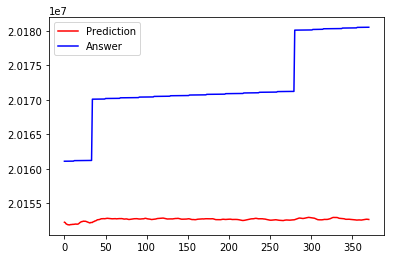

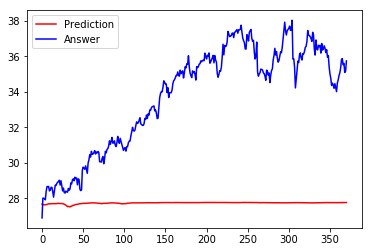

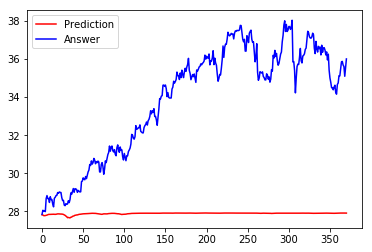

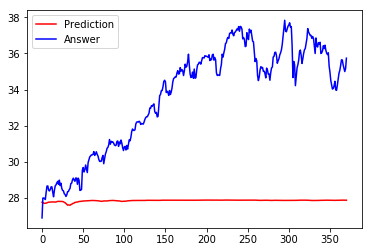

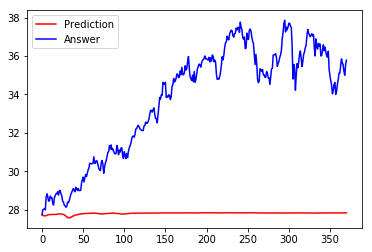

371/371 [==============================] - 1s 2ms/step
[array([[ 20152278.],
       [ 20152220.],
       [ 20152046.],
       [ 20151980.],
       [ 20151926.],
       [ 20151902.],
       [ 20151890.],
       [ 20151920.],
       [ 20151950.],
       [ 20151942.],
       [ 20151974.],
       [ 20151970.],
       [ 20151994.],
       [ 20152004.],
       [ 20152020.],
       [ 20151996.],
       [ 20152002.],
       [ 20152038.],
       [ 20152150.],
       [ 20152240.],
       [ 20152314.],
       [ 20152366.],
       [ 20152384.],
       [ 20152434.],
       [ 20152416.],
       [ 20152424.],
       [ 20152406.],
       [ 20152358.],
       [ 20152304.],
       [ 20152260.],
       [ 20152218.],
       [ 20152170.],
       [ 20152240.],
       [ 20152234.],
       [ 20152242.],
       [ 20152356.],
       [ 20152378.],
       [ 20152458.],
       [ 20152482.],
       [ 20152546.],
       [ 20152630.],
       [ 20152640.],
       [ 20152662.],
       [ 20152688.],
       [ 20152746.],

Train on 884 samples, validate on 221 samples
Epoch 1/51
884/884 [==============================] - 79s 89ms/step - loss: 0.0902 - acc: 0.1595 - val_loss: 0.3471 - val_acc: 0.0588
Epoch 2/51
884/884 [==============================] - 15s 17ms/step - loss: 0.0322 - acc: 0.0939 - val_loss: 0.1633 - val_acc: 0.1719
Epoch 3/51
884/884 [==============================] - 13s 15ms/step - loss: 0.0282 - acc: 0.3167 - val_loss: 0.2459 - val_acc: 0.5701
Epoch 4/51
884/884 [==============================] - 13s 15ms/step - loss: 0.0262 - acc: 0.5226 - val_loss: 0.2491 - val_acc: 0.5701
Epoch 5/51
884/884 [==============================] - 13s 15ms/step - loss: 0.0249 - acc: 0.5226 - val_loss: 0.1999 - val_acc: 0.5701
Epoch 6/51
884/884 [==============================] - 13s 15ms/step - loss: 0.0238 - acc: 0.5226 - val_loss: 0.1903 - val_acc: 0.5701
Epoch 7/51
884/884 [==============================] - 15s 17ms/step - loss: 0.0193 - acc: 0.5124 - val_loss: 0.1900 - val_acc: 0.5701
Epoch 8/51
884/8

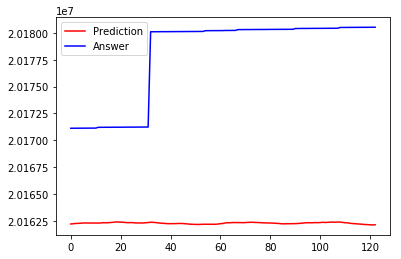

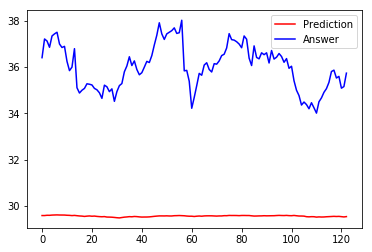

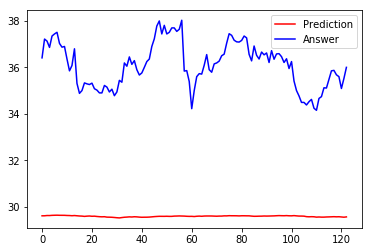

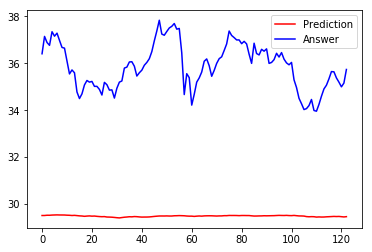

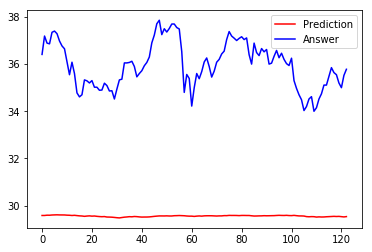

123/123 [==============================] - 0s 4ms/step
[array([[ 20162202.],
       [ 20162222.],
       [ 20162252.],
       [ 20162256.],
       [ 20162276.],
       [ 20162290.],
       [ 20162298.],
       [ 20162290.],
       [ 20162288.],
       [ 20162292.],
       [ 20162286.],
       [ 20162288.],
       [ 20162294.],
       [ 20162322.],
       [ 20162312.],
       [ 20162320.],
       [ 20162340.],
       [ 20162358.],
       [ 20162390.],
       [ 20162386.],
       [ 20162368.],
       [ 20162362.],
       [ 20162334.],
       [ 20162324.],
       [ 20162330.],
       [ 20162322.],
       [ 20162294.],
       [ 20162298.],
       [ 20162294.],
       [ 20162300.],
       [ 20162312.],
       [ 20162334.],
       [ 20162360.],
       [ 20162354.],
       [ 20162332.],
       [ 20162306.],
       [ 20162280.],
       [ 20162266.],
       [ 20162242.],
       [ 20162230.],
       [ 20162230.],
       [ 20162236.],
       [ 20162236.],
       [ 20162244.],
       [ 20162252.],

Train on 693 samples, validate on 174 samples
Epoch 1/50
693/693 [==============================] - 53s 76ms/step - loss: 0.0766 - acc: 0.2583 - val_loss: 0.2089 - val_acc: 0.0000e+00
Epoch 2/50
693/693 [==============================] - 0s 593us/step - loss: 0.0744 - acc: 0.2915 - val_loss: 0.2041 - val_acc: 0.0000e+00
Epoch 3/50
693/693 [==============================] - 0s 566us/step - loss: 0.0715 - acc: 0.3016 - val_loss: 0.1973 - val_acc: 0.0000e+00
Epoch 4/50
693/693 [==============================] - 0s 593us/step - loss: 0.0672 - acc: 0.3030 - val_loss: 0.1859 - val_acc: 0.0000e+00
Epoch 5/50
693/693 [==============================] - 0s 577us/step - loss: 0.0607 - acc: 0.3001 - val_loss: 0.1677 - val_acc: 0.0000e+00
Epoch 6/50
693/693 [==============================] - 0s 577us/step - loss: 0.0509 - acc: 0.3016 - val_loss: 0.1425 - val_acc: 0.0000e+00
Epoch 7/50
693/693 [==============================] - 0s 597us/step - loss: 0.0392 - acc: 0.3016 - val_loss: 0.1123 - val_acc:

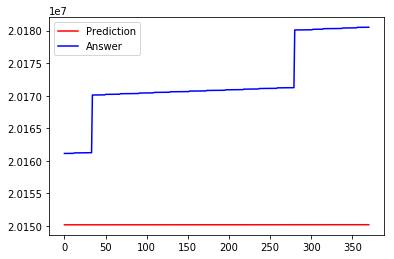

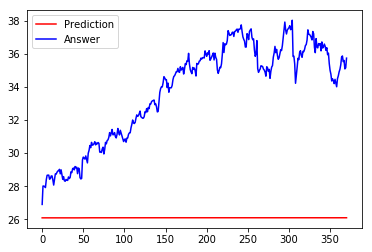

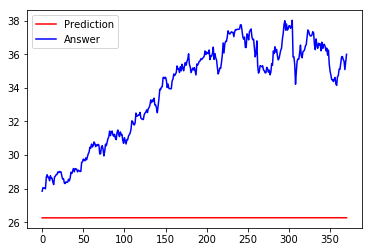

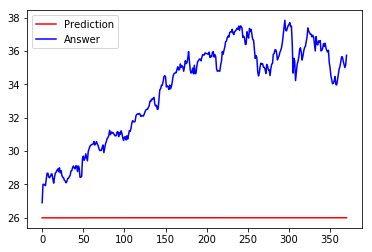

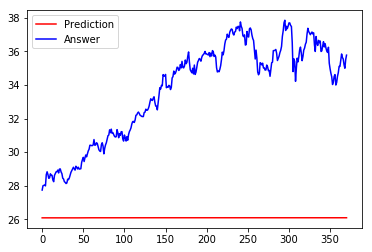

371/371 [==============================] - 0s 210us/step
[array([[ 20150144.],
       [ 20150144.],
       [ 20150142.],
       [ 20150142.],
       [ 20150140.],
       [ 20150138.],
       [ 20150138.],
       [ 20150138.],
       [ 20150138.],
       [ 20150138.],
       [ 20150140.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150140.],
       [ 20150144.],
       [ 20150144.],
       [ 20150146.],
       [ 20150144.],
       [ 20150142.],
       [ 20150142.],
       [ 20150138.],
       [ 20150134.],
       [ 20150132.],
       [ 20150134.],
       [ 20150130.],
       [ 20150128.],
       [ 20150134.],
       [ 20150134.],
       [ 20150134.],
       [ 20150134.],
       [ 20150134.],
       [ 20150138.],
       [ 20150138.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.

Train on 884 samples, validate on 221 samples
Epoch 1/50
884/884 [==============================] - 53s 60ms/step - loss: 0.1095 - acc: 0.1629 - val_loss: 0.5735 - val_acc: 0.0860
Epoch 2/50
884/884 [==============================] - 0s 447us/step - loss: 0.1070 - acc: 0.1708 - val_loss: 0.5665 - val_acc: 0.0860
Epoch 3/50
884/884 [==============================] - 0s 448us/step - loss: 0.1041 - acc: 0.1674 - val_loss: 0.5582 - val_acc: 0.0860
Epoch 4/50
884/884 [==============================] - 0s 440us/step - loss: 0.1008 - acc: 0.1674 - val_loss: 0.5480 - val_acc: 0.0860
Epoch 5/50
884/884 [==============================] - 0s 503us/step - loss: 0.0966 - acc: 0.1674 - val_loss: 0.5349 - val_acc: 0.0860
Epoch 6/50
884/884 [==============================] - 0s 494us/step - loss: 0.0914 - acc: 0.1674 - val_loss: 0.5182 - val_acc: 0.0860
Epoch 7/50
884/884 [==============================] - 0s 456us/step - loss: 0.0851 - acc: 0.1674 - val_loss: 0.4969 - val_acc: 0.0860
Epoch 8/50
884/8

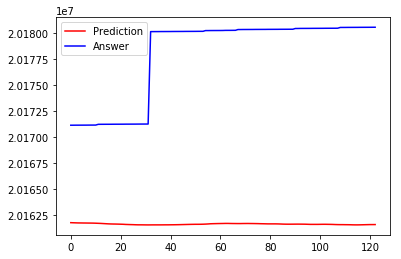

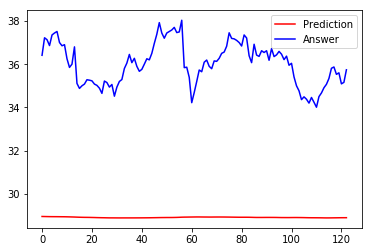

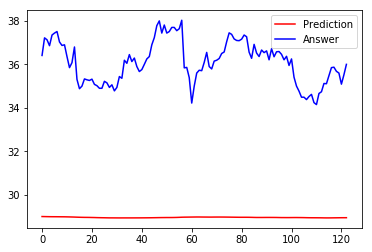

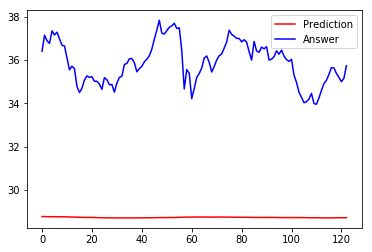

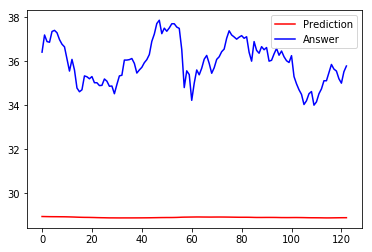

123/123 [==============================] - 0s 211us/step
[array([[ 20161760.],
       [ 20161750.],
       [ 20161742.],
       [ 20161734.],
       [ 20161732.],
       [ 20161728.],
       [ 20161726.],
       [ 20161722.],
       [ 20161720.],
       [ 20161716.],
       [ 20161708.],
       [ 20161698.],
       [ 20161688.],
       [ 20161674.],
       [ 20161660.],
       [ 20161646.],
       [ 20161636.],
       [ 20161630.],
       [ 20161626.],
       [ 20161620.],
       [ 20161612.],
       [ 20161604.],
       [ 20161590.],
       [ 20161582.],
       [ 20161574.],
       [ 20161568.],
       [ 20161558.],
       [ 20161552.],
       [ 20161552.],
       [ 20161550.],
       [ 20161546.],
       [ 20161544.],
       [ 20161546.],
       [ 20161548.],
       [ 20161548.],
       [ 20161548.],
       [ 20161548.],
       [ 20161550.],
       [ 20161552.],
       [ 20161552.],
       [ 20161556.],
       [ 20161558.],
       [ 20161562.],
       [ 20161566.],
       [ 20161572.

Train on 785 samples, validate on 197 samples
Epoch 1/50
785/785 [==============================] - 53s 68ms/step - loss: 0.0892 - acc: 0.3338 - val_loss: 0.3395 - val_acc: 0.9645
Epoch 2/50
785/785 [==============================] - 0s 468us/step - loss: 0.0875 - acc: 0.4611 - val_loss: 0.3356 - val_acc: 1.0000
Epoch 3/50
785/785 [==============================] - 0s 469us/step - loss: 0.0858 - acc: 0.4624 - val_loss: 0.3313 - val_acc: 1.0000
Epoch 4/50
785/785 [==============================] - 0s 462us/step - loss: 0.0838 - acc: 0.4624 - val_loss: 0.3262 - val_acc: 1.0000
Epoch 5/50
785/785 [==============================] - 0s 452us/step - loss: 0.0815 - acc: 0.4624 - val_loss: 0.3198 - val_acc: 1.0000
Epoch 6/50
785/785 [==============================] - 0s 480us/step - loss: 0.0786 - acc: 0.4624 - val_loss: 0.3117 - val_acc: 1.0000
Epoch 7/50
785/785 [==============================] - 0s 466us/step - loss: 0.0749 - acc: 0.4624 - val_loss: 0.3010 - val_acc: 1.0000
Epoch 8/50
785/7

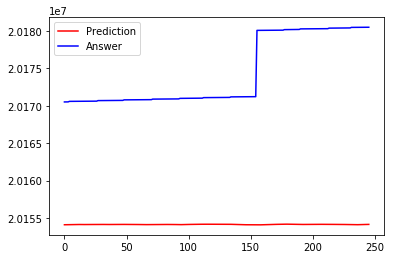

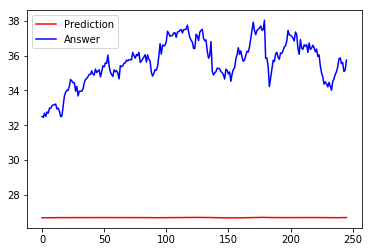

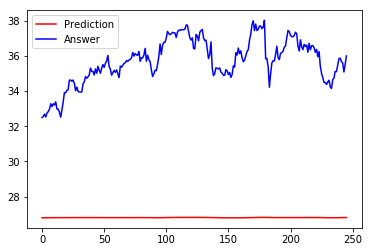

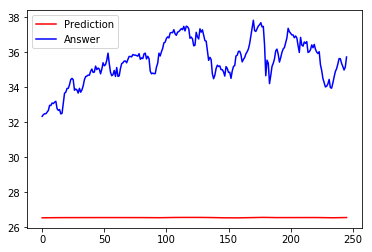

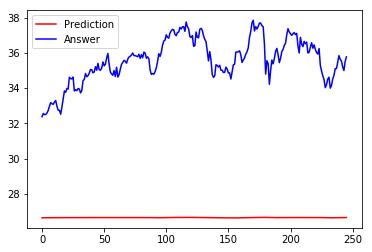

246/246 [==============================] - 0s 167us/step
[array([[ 20154086.],
       [ 20154090.],
       [ 20154094.],
       [ 20154098.],
       [ 20154100.],
       [ 20154104.],
       [ 20154108.],
       [ 20154112.],
       [ 20154114.],
       [ 20154116.],
       [ 20154118.],
       [ 20154118.],
       [ 20154120.],
       [ 20154122.],
       [ 20154120.],
       [ 20154118.],
       [ 20154114.],
       [ 20154112.],
       [ 20154114.],
       [ 20154116.],
       [ 20154118.],
       [ 20154120.],
       [ 20154122.],
       [ 20154124.],
       [ 20154126.],
       [ 20154130.],
       [ 20154132.],
       [ 20154132.],
       [ 20154130.],
       [ 20154128.],
       [ 20154126.],
       [ 20154126.],
       [ 20154122.],
       [ 20154118.],
       [ 20154118.],
       [ 20154118.],
       [ 20154120.],
       [ 20154122.],
       [ 20154120.],
       [ 20154124.],
       [ 20154124.],
       [ 20154126.],
       [ 20154126.],
       [ 20154128.],
       [ 20154128.

Train on 687 samples, validate on 295 samples
Epoch 1/50
687/687 [==============================] - 55s 80ms/step - loss: 0.0781 - acc: 0.2009 - val_loss: 0.2776 - val_acc: 0.0000e+00
Epoch 2/50
687/687 [==============================] - 2s 4ms/step - loss: 0.0746 - acc: 0.1921 - val_loss: 0.2645 - val_acc: 0.0000e+00
Epoch 3/50
687/687 [==============================] - 2s 3ms/step - loss: 0.0679 - acc: 0.1951 - val_loss: 0.2418 - val_acc: 0.0000e+00
Epoch 4/50
687/687 [==============================] - 2s 3ms/step - loss: 0.0576 - acc: 0.2140 - val_loss: 0.2097 - val_acc: 0.0000e+00
Epoch 5/50
687/687 [==============================] - 2s 3ms/step - loss: 0.0454 - acc: 0.2125 - val_loss: 0.1708 - val_acc: 0.0000e+00
Epoch 6/50
687/687 [==============================] - 2s 4ms/step - loss: 0.0356 - acc: 0.2140 - val_loss: 0.1301 - val_acc: 0.0000e+00
Epoch 7/50
687/687 [==============================] - 2s 3ms/step - loss: 0.0300 - acc: 0.2052 - val_loss: 0.1005 - val_acc: 0.0000e+00


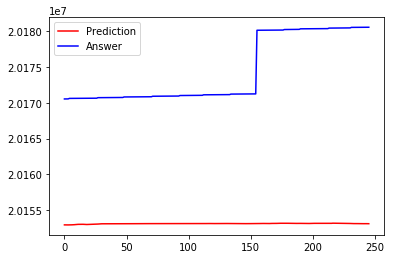

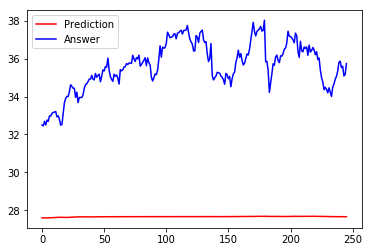

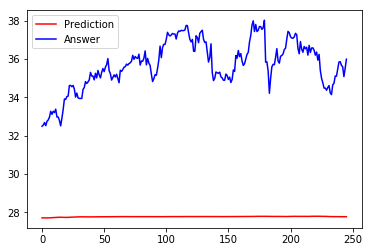

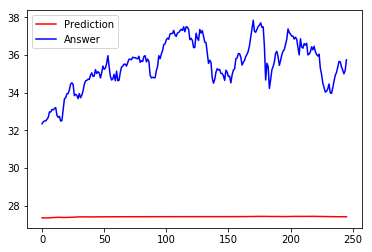

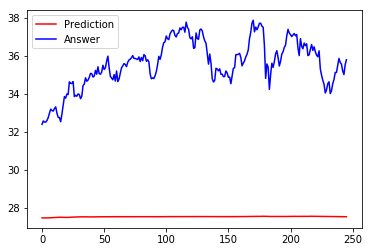

246/246 [==============================] - 0s 443us/step
[array([[ 20152968.],
       [ 20152962.],
       [ 20152966.],
       [ 20152962.],
       [ 20152962.],
       [ 20152962.],
       [ 20152974.],
       [ 20152980.],
       [ 20152994.],
       [ 20153014.],
       [ 20153026.],
       [ 20153040.],
       [ 20153044.],
       [ 20153054.],
       [ 20153054.],
       [ 20153048.],
       [ 20153038.],
       [ 20153030.],
       [ 20153020.],
       [ 20153026.],
       [ 20153030.],
       [ 20153032.],
       [ 20153050.],
       [ 20153060.],
       [ 20153066.],
       [ 20153068.],
       [ 20153082.],
       [ 20153082.],
       [ 20153098.],
       [ 20153108.],
       [ 20153118.],
       [ 20153118.],
       [ 20153118.],
       [ 20153116.],
       [ 20153118.],
       [ 20153114.],
       [ 20153112.],
       [ 20153104.],
       [ 20153106.],
       [ 20153106.],
       [ 20153104.],
       [ 20153110.],
       [ 20153110.],
       [ 20153118.],
       [ 20153116.

Train on 780 samples, validate on 87 samples
Epoch 1/50
780/780 [==============================] - 54s 70ms/step - loss: 0.0822 - acc: 0.3462 - val_loss: 0.2392 - val_acc: 0.0000e+00
Epoch 2/50
780/780 [==============================] - 2s 3ms/step - loss: 0.0631 - acc: 0.2987 - val_loss: 0.1742 - val_acc: 0.0000e+00
Epoch 3/50
780/780 [==============================] - 2s 3ms/step - loss: 0.0378 - acc: 0.3077 - val_loss: 0.1007 - val_acc: 0.0000e+00
Epoch 4/50
780/780 [==============================] - 2s 3ms/step - loss: 0.0279 - acc: 0.2987 - val_loss: 0.0542 - val_acc: 1.0000
Epoch 5/50
780/780 [==============================] - 2s 3ms/step - loss: 0.0237 - acc: 0.4346 - val_loss: 0.0600 - val_acc: 1.0000
Epoch 6/50
780/780 [==============================] - 2s 3ms/step - loss: 0.0210 - acc: 0.3244 - val_loss: 0.0780 - val_acc: 0.0000e+00
Epoch 7/50
780/780 [==============================] - 2s 3ms/step - loss: 0.0216 - acc: 0.1115 - val_loss: 0.0763 - val_acc: 0.0000e+00
Epoch 8/5

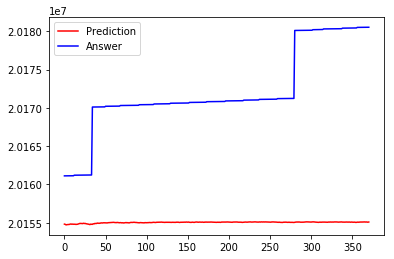

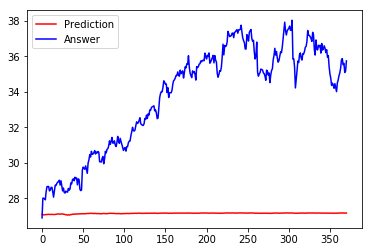

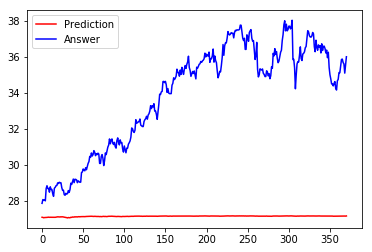

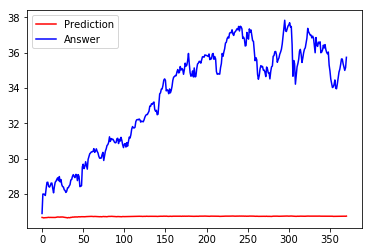

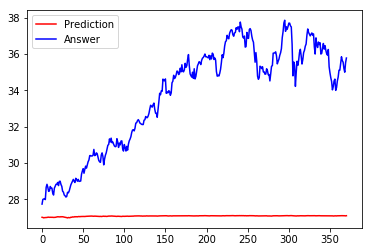

371/371 [==============================] - 0s 685us/step
[array([[ 20154814.],
       [ 20154786.],
       [ 20154710.],
       [ 20154746.],
       [ 20154754.],
       [ 20154762.],
       [ 20154774.],
       [ 20154814.],
       [ 20154828.],
       [ 20154800.],
       [ 20154814.],
       [ 20154800.],
       [ 20154806.],
       [ 20154800.],
       [ 20154776.],
       [ 20154786.],
       [ 20154800.],
       [ 20154840.],
       [ 20154888.],
       [ 20154912.],
       [ 20154894.],
       [ 20154898.],
       [ 20154878.],
       [ 20154928.],
       [ 20154890.],
       [ 20154914.],
       [ 20154872.],
       [ 20154852.],
       [ 20154840.],
       [ 20154806.],
       [ 20154790.],
       [ 20154748.],
       [ 20154818.],
       [ 20154790.],
       [ 20154786.],
       [ 20154862.],
       [ 20154840.],
       [ 20154904.],
       [ 20154892.],
       [ 20154900.],
       [ 20154952.],
       [ 20154916.],
       [ 20154940.],
       [ 20154918.],
       [ 20154960.

Train on 786 samples, validate on 88 samples
Epoch 1/50
786/786 [==============================] - 59s 75ms/step - loss: 0.0830 - acc: 0.2710 - val_loss: 0.2518 - val_acc: 0.0000e+00
Epoch 2/50
786/786 [==============================] - 3s 4ms/step - loss: 0.0702 - acc: 0.2748 - val_loss: 0.1718 - val_acc: 0.0000e+00
Epoch 3/50
786/786 [==============================] - 3s 4ms/step - loss: 0.0360 - acc: 0.2761 - val_loss: 0.0732 - val_acc: 0.0000e+00
Epoch 4/50
786/786 [==============================] - 3s 4ms/step - loss: 0.0244 - acc: 0.2684 - val_loss: 0.0502 - val_acc: 0.0000e+00
Epoch 5/50
786/786 [==============================] - 3s 4ms/step - loss: 0.0225 - acc: 0.0878 - val_loss: 0.0783 - val_acc: 0.0000e+00
Epoch 6/50
786/786 [==============================] - 3s 4ms/step - loss: 0.0222 - acc: 0.0891 - val_loss: 0.0898 - val_acc: 0.0000e+00
Epoch 7/50
786/786 [==============================] - 3s 4ms/step - loss: 0.0218 - acc: 0.2824 - val_loss: 0.0791 - val_acc: 0.0000e+00
E

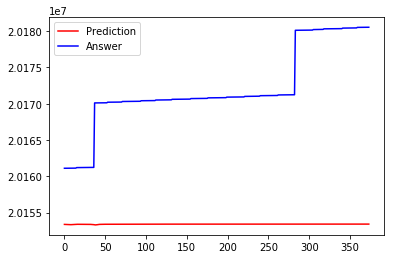

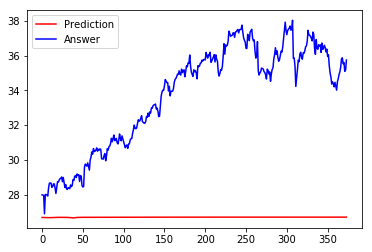

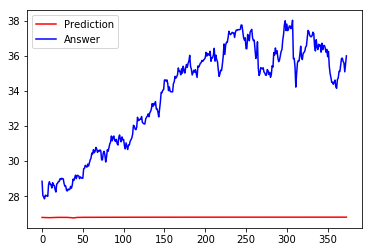

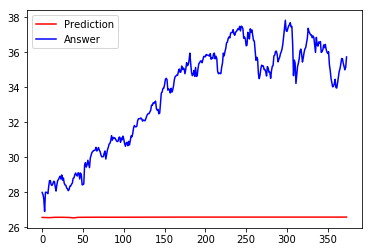

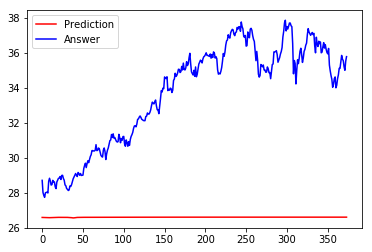

374/374 [==============================] - 1s 1ms/step
[array([[ 20153384.],
       [ 20153378.],
       [ 20153370.],
       [ 20153364.],
       [ 20153362.],
       [ 20153358.],
       [ 20153356.],
       [ 20153354.],
       [ 20153346.],
       [ 20153350.],
       [ 20153356.],
       [ 20153366.],
       [ 20153372.],
       [ 20153382.],
       [ 20153392.],
       [ 20153396.],
       [ 20153398.],
       [ 20153398.],
       [ 20153396.],
       [ 20153396.],
       [ 20153396.],
       [ 20153396.],
       [ 20153398.],
       [ 20153398.],
       [ 20153400.],
       [ 20153398.],
       [ 20153398.],
       [ 20153398.],
       [ 20153398.],
       [ 20153398.],
       [ 20153394.],
       [ 20153390.],
       [ 20153384.],
       [ 20153378.],
       [ 20153370.],
       [ 20153358.],
       [ 20153348.],
       [ 20153326.],
       [ 20153312.],
       [ 20153320.],
       [ 20153338.],
       [ 20153358.],
       [ 20153370.],
       [ 20153386.],
       [ 20153390.],

Train on 699 samples, validate on 175 samples
Epoch 1/50
699/699 [==============================] - 58s 83ms/step - loss: 0.0717 - acc: 0.2060 - val_loss: 0.1564 - val_acc: 0.0000e+00
Epoch 2/50
699/699 [==============================] - 4s 5ms/step - loss: 0.0363 - acc: 0.1402 - val_loss: 0.0465 - val_acc: 0.0000e+00
Epoch 3/50
699/699 [==============================] - 4s 5ms/step - loss: 0.0240 - acc: 0.1116 - val_loss: 0.0662 - val_acc: 0.0000e+00
Epoch 4/50
699/699 [==============================] - 4s 5ms/step - loss: 0.0207 - acc: 0.0844 - val_loss: 0.0686 - val_acc: 0.0000e+00
Epoch 5/50
699/699 [==============================] - 4s 5ms/step - loss: 0.0204 - acc: 0.1688 - val_loss: 0.0538 - val_acc: 0.0000e+00
Epoch 6/50
699/699 [==============================] - 4s 5ms/step - loss: 0.0198 - acc: 0.2060 - val_loss: 0.0506 - val_acc: 0.0000e+00
Epoch 7/50
699/699 [==============================] - 4s 5ms/step - loss: 0.0199 - acc: 0.2976 - val_loss: 0.0574 - val_acc: 1.0000
Epoc

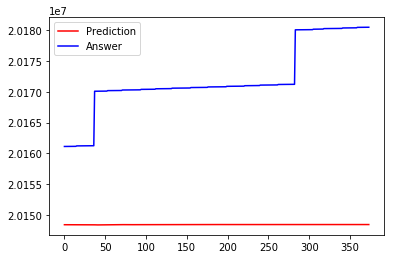

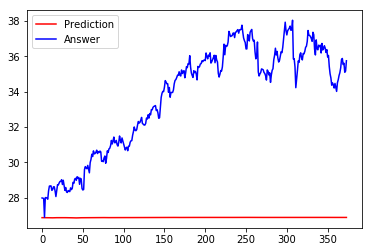

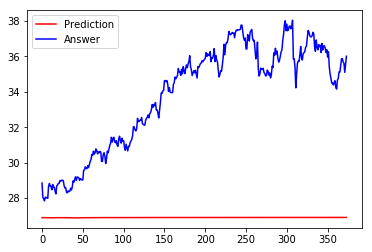

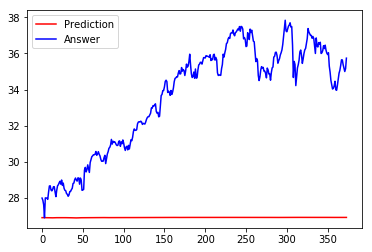

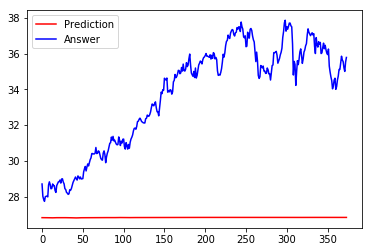

374/374 [==============================] - 0s 1ms/step
[array([[ 20148368.],
       [ 20148368.],
       [ 20148364.],
       [ 20148360.],
       [ 20148358.],
       [ 20148358.],
       [ 20148360.],
       [ 20148360.],
       [ 20148358.],
       [ 20148356.],
       [ 20148358.],
       [ 20148356.],
       [ 20148354.],
       [ 20148350.],
       [ 20148354.],
       [ 20148360.],
       [ 20148362.],
       [ 20148362.],
       [ 20148364.],
       [ 20148368.],
       [ 20148364.],
       [ 20148364.],
       [ 20148366.],
       [ 20148366.],
       [ 20148366.],
       [ 20148364.],
       [ 20148362.],
       [ 20148362.],
       [ 20148364.],
       [ 20148368.],
       [ 20148368.],
       [ 20148364.],
       [ 20148358.],
       [ 20148358.],
       [ 20148358.],
       [ 20148358.],
       [ 20148354.],
       [ 20148350.],
       [ 20148342.],
       [ 20148338.],
       [ 20148338.],
       [ 20148336.],
       [ 20148338.],
       [ 20148346.],
       [ 20148346.],

Train on 883 samples, validate on 99 samples
Epoch 1/50
883/883 [==============================] - 54s 62ms/step - loss: 0.1091 - acc: 0.0646 - val_loss: 0.4015 - val_acc: 0.0000e+00
Epoch 2/50
883/883 [==============================] - 0s 555us/step - loss: 0.1053 - acc: 0.0374 - val_loss: 0.3912 - val_acc: 0.0000e+00
Epoch 3/50
883/883 [==============================] - 0s 487us/step - loss: 0.1002 - acc: 0.0374 - val_loss: 0.3756 - val_acc: 0.0000e+00
Epoch 4/50
883/883 [==============================] - 0s 499us/step - loss: 0.0928 - acc: 0.0374 - val_loss: 0.3540 - val_acc: 0.0000e+00
Epoch 5/50
883/883 [==============================] - 0s 501us/step - loss: 0.0826 - acc: 0.0374 - val_loss: 0.3236 - val_acc: 0.0000e+00
Epoch 6/50
883/883 [==============================] - 0s 444us/step - loss: 0.0694 - acc: 0.0374 - val_loss: 0.2814 - val_acc: 0.0000e+00
Epoch 7/50
883/883 [==============================] - 0s 478us/step - loss: 0.0529 - acc: 0.0374 - val_loss: 0.2257 - val_acc: 

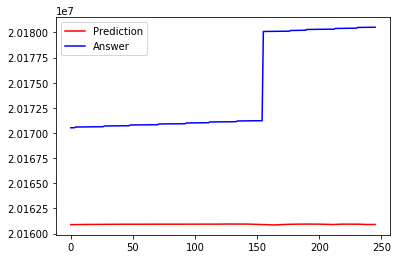

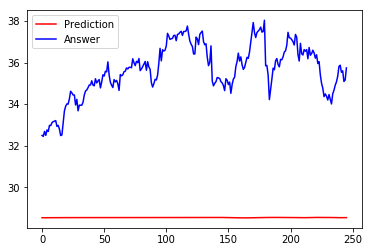

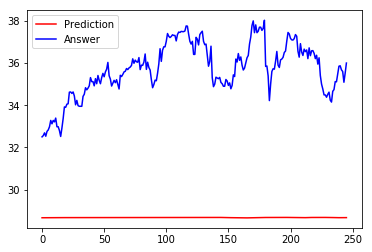

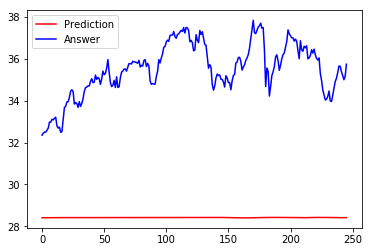

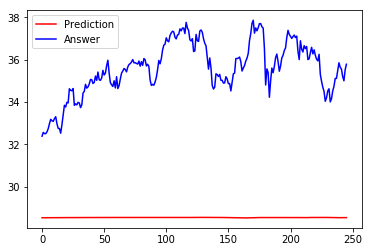

246/246 [==============================] - 0s 203us/step
[array([[ 20160894.],
       [ 20160896.],
       [ 20160896.],
       [ 20160898.],
       [ 20160900.],
       [ 20160902.],
       [ 20160902.],
       [ 20160904.],
       [ 20160908.],
       [ 20160908.],
       [ 20160908.],
       [ 20160912.],
       [ 20160912.],
       [ 20160914.],
       [ 20160914.],
       [ 20160914.],
       [ 20160914.],
       [ 20160914.],
       [ 20160914.],
       [ 20160916.],
       [ 20160916.],
       [ 20160914.],
       [ 20160914.],
       [ 20160914.],
       [ 20160916.],
       [ 20160916.],
       [ 20160916.],
       [ 20160916.],
       [ 20160920.],
       [ 20160922.],
       [ 20160924.],
       [ 20160924.],
       [ 20160926.],
       [ 20160926.],
       [ 20160928.],
       [ 20160928.],
       [ 20160928.],
       [ 20160928.],
       [ 20160930.],
       [ 20160932.],
       [ 20160934.],
       [ 20160934.],
       [ 20160934.],
       [ 20160934.],
       [ 20160934.

Train on 687 samples, validate on 295 samples
Epoch 1/50
687/687 [==============================] - 69s 100ms/step - loss: 0.0769 - acc: 0.3362 - val_loss: 0.2604 - val_acc: 0.0000e+00
Epoch 2/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0637 - acc: 0.3028 - val_loss: 0.1991 - val_acc: 0.0000e+00
Epoch 3/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0412 - acc: 0.3042 - val_loss: 0.1327 - val_acc: 0.0000e+00
Epoch 4/50
687/687 [==============================] - -81s -118167us/step - loss: 0.0266 - acc: 0.2984 - val_loss: 0.0811 - val_acc: 0.0000e+00
Epoch 5/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0251 - acc: 0.3115 - val_loss: 0.0722 - val_acc: 0.0000e+00
Epoch 6/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0214 - acc: 0.3231 - val_loss: 0.0897 - val_acc: 0.0000e+00
Epoch 7/50
687/687 [==============================] - 7s 11ms/step - loss: 0.0197 - acc: 0.1820 - val_loss: 0.1070 - val_ac

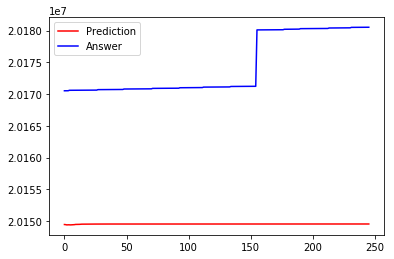

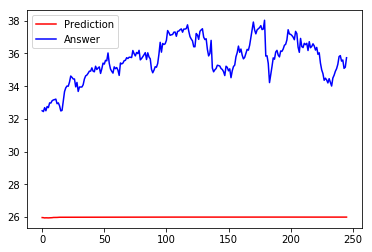

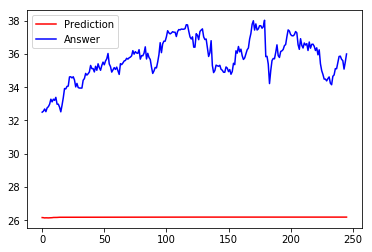

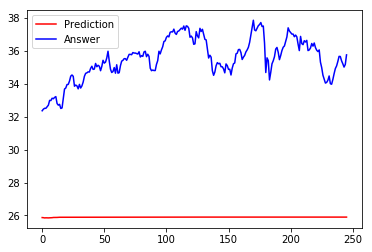

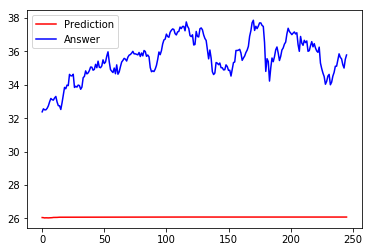

246/246 [==============================] - 1s 5ms/step
[array([[ 20149478.],
       [ 20149458.],
       [ 20149416.],
       [ 20149436.],
       [ 20149424.],
       [ 20149420.],
       [ 20149430.],
       [ 20149440.],
       [ 20149458.],
       [ 20149492.],
       [ 20149492.],
       [ 20149502.],
       [ 20149504.],
       [ 20149524.],
       [ 20149534.],
       [ 20149534.],
       [ 20149530.],
       [ 20149534.],
       [ 20149536.],
       [ 20149542.],
       [ 20149544.],
       [ 20149542.],
       [ 20149544.],
       [ 20149550.],
       [ 20149550.],
       [ 20149550.],
       [ 20149552.],
       [ 20149550.],
       [ 20149550.],
       [ 20149552.],
       [ 20149554.],
       [ 20149554.],
       [ 20149556.],
       [ 20149556.],
       [ 20149556.],
       [ 20149556.],
       [ 20149556.],
       [ 20149556.],
       [ 20149558.],
       [ 20149558.],
       [ 20149556.],
       [ 20149558.],
       [ 20149556.],
       [ 20149558.],
       [ 20149558.],

78
Train on 606 samples, validate on 261 samples
Epoch 1/51
606/606 [==============================] - 218s 360ms/step - loss: 0.0732 - acc: 0.1139 - val_loss: 0.1740 - val_acc: 0.0000e+00
Epoch 2/51
606/606 [==============================] - 1s 2ms/step - loss: 0.0717 - acc: 0.3449 - val_loss: 0.1712 - val_acc: 0.0000e+00
Epoch 3/51
606/606 [==============================] - 1s 2ms/step - loss: 0.0700 - acc: 0.3449 - val_loss: 0.1678 - val_acc: 0.0000e+00
Epoch 4/51
606/606 [==============================] - 1s 2ms/step - loss: 0.0679 - acc: 0.3449 - val_loss: 0.1631 - val_acc: 0.0000e+00
Epoch 5/51
606/606 [==============================] - 1s 2ms/step - loss: 0.0650 - acc: 0.3449 - val_loss: 0.1563 - val_acc: 0.0000e+00
Epoch 6/51
606/606 [==============================] - 1s 2ms/step - loss: 0.0610 - acc: 0.3449 - val_loss: 0.1468 - val_acc: 0.0000e+00
Epoch 7/51
606/606 [==============================] - 1s 2ms/step - loss: 0.0556 - acc: 0.3449 - val_loss: 0.1338 - val_acc: 0.0000

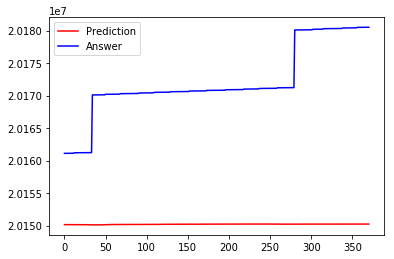

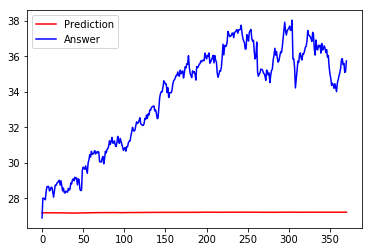

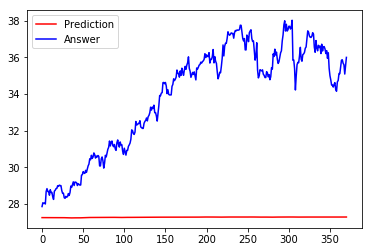

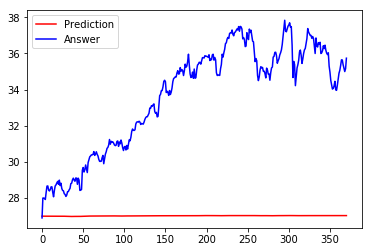

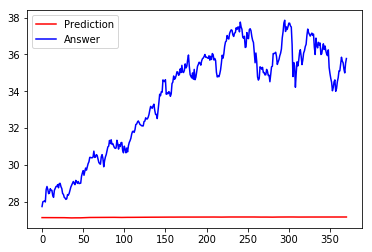

371/371 [==============================] - 0s 407us/step
[array([[ 20150146.],
       [ 20150144.],
       [ 20150140.],
       [ 20150140.],
       [ 20150138.],
       [ 20150138.],
       [ 20150140.],
       [ 20150142.],
       [ 20150146.],
       [ 20150142.],
       [ 20150142.],
       [ 20150142.],
       [ 20150144.],
       [ 20150146.],
       [ 20150142.],
       [ 20150142.],
       [ 20150140.],
       [ 20150140.],
       [ 20150142.],
       [ 20150142.],
       [ 20150140.],
       [ 20150138.],
       [ 20150138.],
       [ 20150142.],
       [ 20150138.],
       [ 20150142.],
       [ 20150142.],
       [ 20150136.],
       [ 20150132.],
       [ 20150128.],
       [ 20150122.],
       [ 20150114.],
       [ 20150112.],
       [ 20150108.],
       [ 20150102.],
       [ 20150106.],
       [ 20150104.],
       [ 20150108.],
       [ 20150108.],
       [ 20150108.],
       [ 20150114.],
       [ 20150112.],
       [ 20150116.],
       [ 20150110.],
       [ 20150112.

Train on 786 samples, validate on 88 samples
Epoch 1/50
786/786 [==============================] - 77s 97ms/step - loss: 0.0833 - acc: 0.1412 - val_loss: 0.2630 - val_acc: 0.0000e+00
Epoch 2/50
786/786 [==============================] - 1s 1ms/step - loss: 0.0803 - acc: 0.0509 - val_loss: 0.2535 - val_acc: 0.0000e+00
Epoch 3/50
786/786 [==============================] - 1s 1ms/step - loss: 0.0745 - acc: 0.0483 - val_loss: 0.2318 - val_acc: 0.0000e+00
Epoch 4/50
786/786 [==============================] - 1s 1ms/step - loss: 0.0620 - acc: 0.0483 - val_loss: 0.1900 - val_acc: 0.0000e+00
Epoch 5/50
786/786 [==============================] - 1s 1ms/step - loss: 0.0429 - acc: 0.0483 - val_loss: 0.1336 - val_acc: 0.0000e+00
Epoch 6/50
786/786 [==============================] - 1s 1ms/step - loss: 0.0282 - acc: 0.0483 - val_loss: 0.0773 - val_acc: 0.0000e+00
Epoch 7/50
786/786 [==============================] - 1s 1ms/step - loss: 0.0244 - acc: 0.0483 - val_loss: 0.0504 - val_acc: 0.0000e+00
E

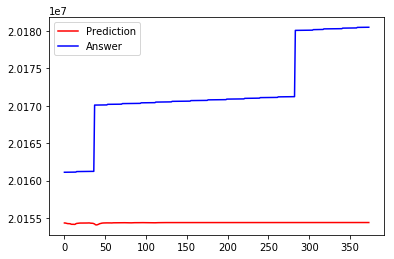

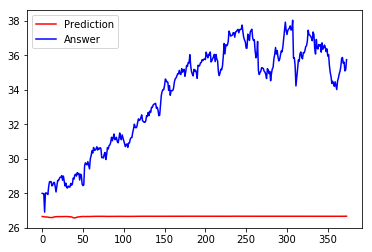

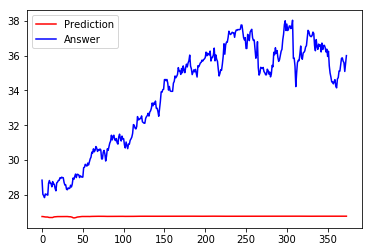

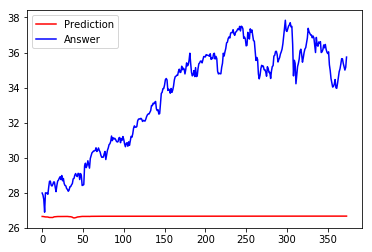

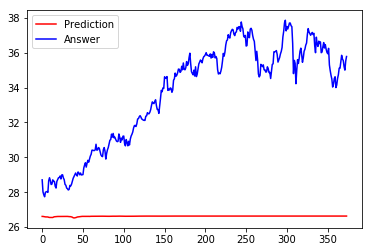

374/374 [==============================] - 0s 382us/step
[array([[ 20154320.],
       [ 20154316.],
       [ 20154286.],
       [ 20154252.],
       [ 20154236.],
       [ 20154232.],
       [ 20154240.],
       [ 20154220.],
       [ 20154166.],
       [ 20154140.],
       [ 20154142.],
       [ 20154144.],
       [ 20154130.],
       [ 20154138.],
       [ 20154214.],
       [ 20154258.],
       [ 20154274.],
       [ 20154288.],
       [ 20154298.],
       [ 20154308.],
       [ 20154304.],
       [ 20154298.],
       [ 20154310.],
       [ 20154310.],
       [ 20154314.],
       [ 20154308.],
       [ 20154302.],
       [ 20154308.],
       [ 20154316.],
       [ 20154326.],
       [ 20154326.],
       [ 20154320.],
       [ 20154296.],
       [ 20154288.],
       [ 20154282.],
       [ 20154272.],
       [ 20154232.],
       [ 20154184.],
       [ 20154086.],
       [ 20154060.],
       [ 20154072.],
       [ 20154112.],
       [ 20154150.],
       [ 20154220.],
       [ 20154240.

Train on 786 samples, validate on 88 samples
Epoch 1/51
786/786 [==============================] - 64s 81ms/step - loss: 0.0783 - acc: 0.2723 - val_loss: 0.2162 - val_acc: 0.0000e+00
Epoch 2/51
786/786 [==============================] - 5s 6ms/step - loss: 0.0407 - acc: 0.2761 - val_loss: 0.0778 - val_acc: 0.0000e+00
Epoch 3/51
786/786 [==============================] - 5s 6ms/step - loss: 0.0250 - acc: 0.2761 - val_loss: 0.0720 - val_acc: 0.0000e+00
Epoch 4/51
786/786 [==============================] - 5s 6ms/step - loss: 0.0211 - acc: 0.2990 - val_loss: 0.0795 - val_acc: 1.0000
Epoch 5/51
786/786 [==============================] - 5s 6ms/step - loss: 0.0210 - acc: 0.4059 - val_loss: 0.0638 - val_acc: 1.0000
Epoch 6/51
786/786 [==============================] - 5s 6ms/step - loss: 0.0203 - acc: 0.4377 - val_loss: 0.0756 - val_acc: 1.0000
Epoch 7/51
786/786 [==============================] - 5s 6ms/step - loss: 0.0204 - acc: 0.4377 - val_loss: 0.0710 - val_acc: 1.0000
Epoch 8/51
786/78

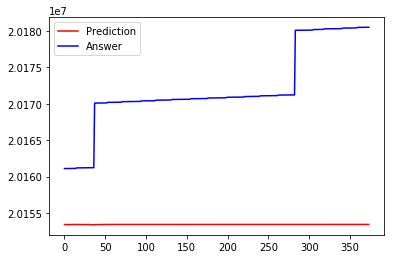

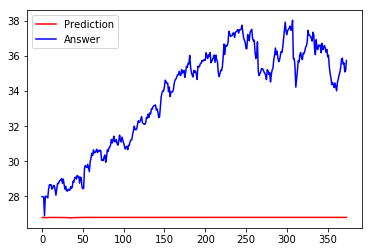

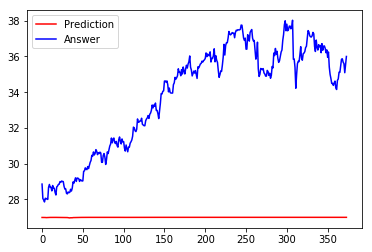

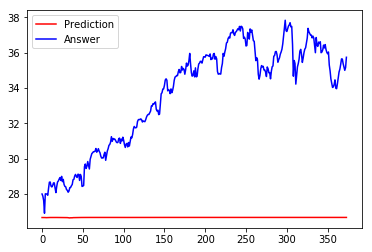

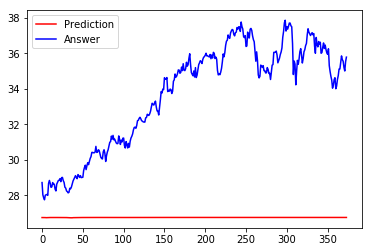

374/374 [==============================] - 1s 2ms/step
[array([[ 20153422.],
       [ 20153422.],
       [ 20153422.],
       [ 20153416.],
       [ 20153416.],
       [ 20153404.],
       [ 20153410.],
       [ 20153416.],
       [ 20153420.],
       [ 20153422.],
       [ 20153426.],
       [ 20153428.],
       [ 20153428.],
       [ 20153428.],
       [ 20153428.],
       [ 20153430.],
       [ 20153430.],
       [ 20153428.],
       [ 20153428.],
       [ 20153428.],
       [ 20153428.],
       [ 20153430.],
       [ 20153430.],
       [ 20153430.],
       [ 20153430.],
       [ 20153428.],
       [ 20153430.],
       [ 20153428.],
       [ 20153428.],
       [ 20153424.],
       [ 20153418.],
       [ 20153410.],
       [ 20153398.],
       [ 20153388.],
       [ 20153368.],
       [ 20153390.],
       [ 20153388.],
       [ 20153386.],
       [ 20153406.],
       [ 20153410.],
       [ 20153418.],
       [ 20153418.],
       [ 20153420.],
       [ 20153424.],
       [ 20153422.],

Train on 898 samples, validate on 225 samples
Epoch 1/51
898/898 [==============================] - 57s 64ms/step - loss: 0.1058 - acc: 0.5033 - val_loss: 0.5601 - val_acc: 0.5867
Epoch 2/51
898/898 [==============================] - 0s 308us/step - loss: 0.1012 - acc: 0.5078 - val_loss: 0.5411 - val_acc: 0.5867
Epoch 3/51
898/898 [==============================] - 0s 310us/step - loss: 0.0925 - acc: 0.5078 - val_loss: 0.5041 - val_acc: 0.5867
Epoch 4/51
898/898 [==============================] - 0s 300us/step - loss: 0.0769 - acc: 0.5078 - val_loss: 0.4364 - val_acc: 0.5867
Epoch 5/51
898/898 [==============================] - 0s 306us/step - loss: 0.0532 - acc: 0.5078 - val_loss: 0.3311 - val_acc: 0.5867
Epoch 6/51
898/898 [==============================] - 0s 317us/step - loss: 0.0325 - acc: 0.5078 - val_loss: 0.2133 - val_acc: 0.5867
Epoch 7/51
898/898 [==============================] - 0s 332us/step - loss: 0.0298 - acc: 0.5078 - val_loss: 0.1780 - val_acc: 0.5867
Epoch 8/51
898/8

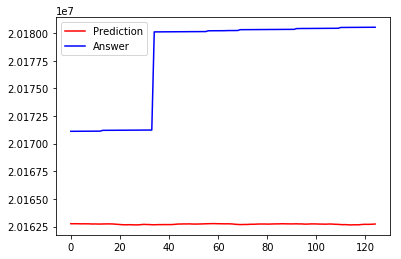

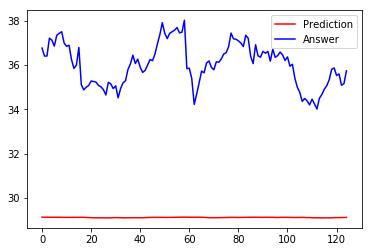

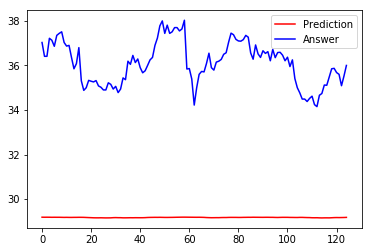

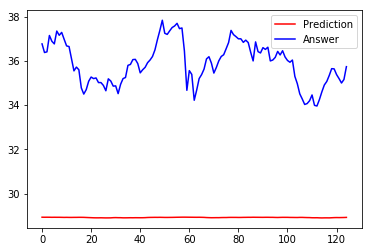

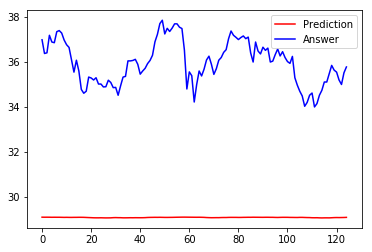

125/125 [==============================] - 0s 208us/step
[array([[ 20162762.],
       [ 20162758.],
       [ 20162760.],
       [ 20162758.],
       [ 20162748.],
       [ 20162754.],
       [ 20162750.],
       [ 20162752.],
       [ 20162742.],
       [ 20162734.],
       [ 20162740.],
       [ 20162732.],
       [ 20162730.],
       [ 20162738.],
       [ 20162740.],
       [ 20162746.],
       [ 20162744.],
       [ 20162738.],
       [ 20162722.],
       [ 20162704.],
       [ 20162688.],
       [ 20162672.],
       [ 20162664.],
       [ 20162664.],
       [ 20162674.],
       [ 20162662.],
       [ 20162656.],
       [ 20162656.],
       [ 20162662.],
       [ 20162690.],
       [ 20162700.],
       [ 20162688.],
       [ 20162686.],
       [ 20162666.],
       [ 20162668.],
       [ 20162672.],
       [ 20162682.],
       [ 20162676.],
       [ 20162684.],
       [ 20162682.],
       [ 20162682.],
       [ 20162682.],
       [ 20162696.],
       [ 20162718.],
       [ 20162732.

Train on 883 samples, validate on 99 samples
Epoch 1/51
883/883 [==============================] - 66s 75ms/step - loss: 0.0887 - acc: 0.3137 - val_loss: 0.2350 - val_acc: 1.0000
Epoch 2/51
883/883 [==============================] - 8s 9ms/step - loss: 0.0325 - acc: 0.5221 - val_loss: 0.0820 - val_acc: 1.0000
Epoch 3/51
883/883 [==============================] - 8s 9ms/step - loss: 0.0265 - acc: 0.2458 - val_loss: 0.1559 - val_acc: 0.0000e+00
Epoch 4/51
883/883 [==============================] - 8s 9ms/step - loss: 0.0257 - acc: 0.3998 - val_loss: 0.1106 - val_acc: 1.0000
Epoch 5/51
883/883 [==============================] - 8s 10ms/step - loss: 0.0252 - acc: 0.5210 - val_loss: 0.1220 - val_acc: 1.0000
Epoch 6/51
883/883 [==============================] - 8s 9ms/step - loss: 0.0244 - acc: 0.5221 - val_loss: 0.1194 - val_acc: 1.0000
Epoch 7/51
883/883 [==============================] - 8s 9ms/step - loss: 0.0221 - acc: 0.5221 - val_loss: 0.1035 - val_acc: 1.0000
Epoch 8/51
883/883 [====

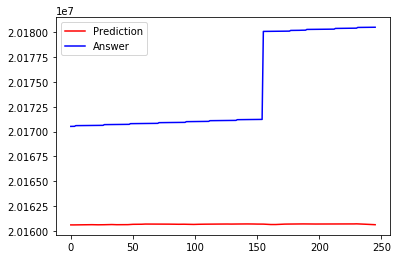

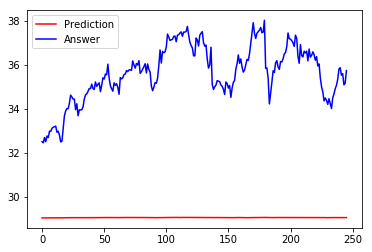

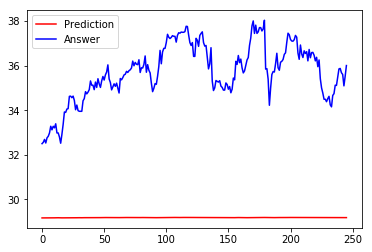

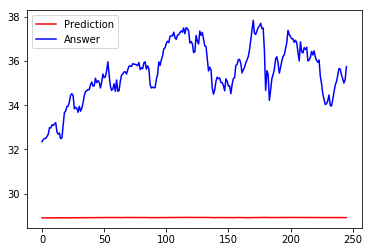

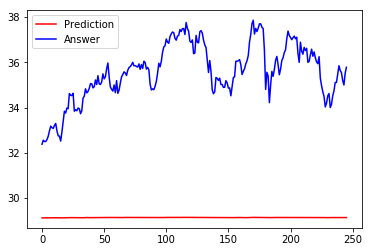

246/246 [==============================] - 1s 3ms/step
[array([[ 20160592.],
       [ 20160596.],
       [ 20160590.],
       [ 20160592.],
       [ 20160596.],
       [ 20160602.],
       [ 20160594.],
       [ 20160600.],
       [ 20160602.],
       [ 20160604.],
       [ 20160610.],
       [ 20160610.],
       [ 20160610.],
       [ 20160610.],
       [ 20160610.],
       [ 20160616.],
       [ 20160616.],
       [ 20160614.],
       [ 20160610.],
       [ 20160604.],
       [ 20160602.],
       [ 20160602.],
       [ 20160602.],
       [ 20160602.],
       [ 20160602.],
       [ 20160604.],
       [ 20160606.],
       [ 20160610.],
       [ 20160614.],
       [ 20160620.],
       [ 20160616.],
       [ 20160620.],
       [ 20160624.],
       [ 20160628.],
       [ 20160622.],
       [ 20160618.],
       [ 20160610.],
       [ 20160612.],
       [ 20160612.],
       [ 20160612.],
       [ 20160612.],
       [ 20160612.],
       [ 20160610.],
       [ 20160610.],
       [ 20160614.],

78
Train on 994 samples, validate on 111 samples
Epoch 1/50
994/994 [==============================] - 68s 69ms/step - loss: 0.1376 - acc: 0.0423 - val_loss: 0.6421 - val_acc: 0.2252
Epoch 2/50
994/994 [==============================] - 12s 12ms/step - loss: 0.0900 - acc: 0.0362 - val_loss: 0.4161 - val_acc: 0.2252
Epoch 3/50
994/994 [==============================] - 12s 12ms/step - loss: 0.0484 - acc: 0.0362 - val_loss: 0.2110 - val_acc: 0.2252
Epoch 4/50
994/994 [==============================] - 12s 12ms/step - loss: 0.0424 - acc: 0.0704 - val_loss: 0.2645 - val_acc: 0.1441
Epoch 5/50
994/994 [==============================] - 12s 12ms/step - loss: 0.0371 - acc: 0.5714 - val_loss: 0.3276 - val_acc: 0.1441
Epoch 6/50
994/994 [==============================] - 12s 12ms/step - loss: 0.0377 - acc: 0.5755 - val_loss: 0.3009 - val_acc: 0.1441
Epoch 7/50
994/994 [==============================] - 12s 12ms/step - loss: 0.0371 - acc: 0.5755 - val_loss: 0.2659 - val_acc: 0.1441
Epoch 8/50
99

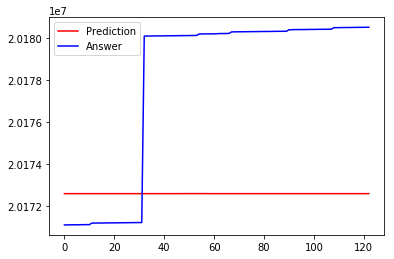

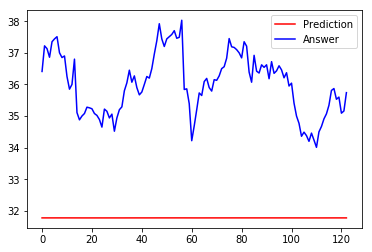

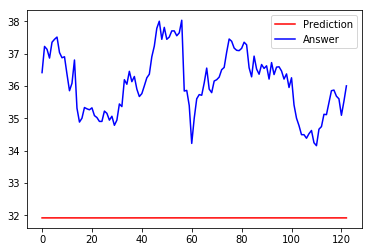

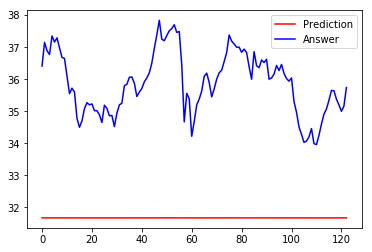

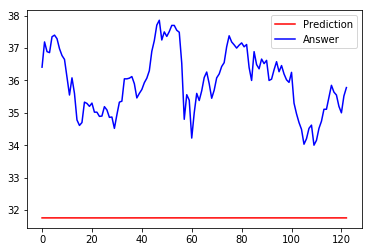

123/123 [==============================] - 1s 4ms/step
[array([[ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],
       [ 20172604.],

Train on 693 samples, validate on 297 samples
Epoch 1/50
693/693 [==============================] - 62s 90ms/step - loss: 0.0740 - acc: 0.1299 - val_loss: 0.2453 - val_acc: 0.0000e+00
Epoch 2/50
693/693 [==============================] - 6s 9ms/step - loss: 0.0521 - acc: 0.0635 - val_loss: 0.1660 - val_acc: 0.0000e+00
Epoch 3/50
693/693 [==============================] - 6s 9ms/step - loss: 0.0276 - acc: 0.0534 - val_loss: 0.0859 - val_acc: 0.0000e+00
Epoch 4/50
693/693 [==============================] - 6s 9ms/step - loss: 0.0231 - acc: 0.1443 - val_loss: 0.0682 - val_acc: 1.0000
Epoch 5/50
693/693 [==============================] - 6s 9ms/step - loss: 0.0210 - acc: 0.3333 - val_loss: 0.0959 - val_acc: 1.0000
Epoch 6/50
693/693 [==============================] - 7s 9ms/step - loss: 0.0204 - acc: 0.2208 - val_loss: 0.1120 - val_acc: 0.0000e+00
Epoch 7/50
693/693 [==============================] - 6s 9ms/step - loss: 0.0207 - acc: 0.0851 - val_loss: 0.1060 - val_acc: 0.0000e+00
Epoch 8/

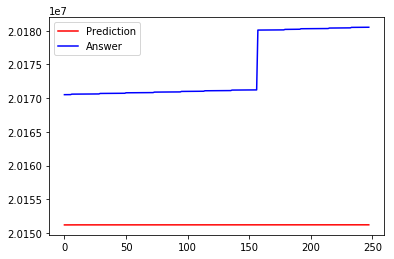

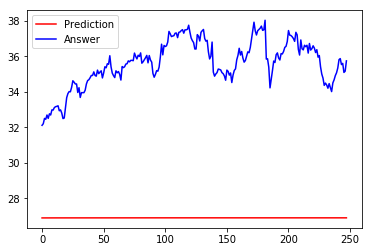

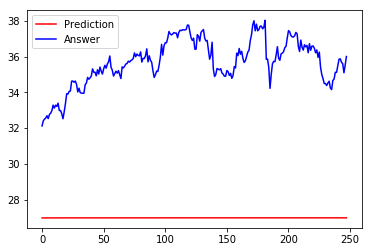

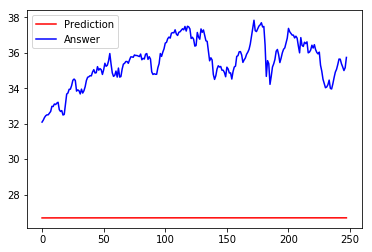

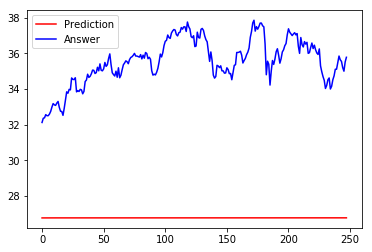

248/248 [==============================] - 1s 2ms/step
[array([[ 20151206.],
       [ 20151208.],
       [ 20151208.],
       [ 20151208.],
       [ 20151210.],
       [ 20151210.],
       [ 20151212.],
       [ 20151212.],
       [ 20151210.],
       [ 20151212.],
       [ 20151212.],
       [ 20151212.],
       [ 20151212.],
       [ 20151212.],
       [ 20151212.],
       [ 20151214.],
       [ 20151214.],
       [ 20151212.],
       [ 20151212.],
       [ 20151212.],
       [ 20151212.],
       [ 20151214.],
       [ 20151214.],
       [ 20151214.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],
       [ 20151214.],
       [ 20151214.],
       [ 20151214.],
       [ 20151214.],
       [ 20151214.],
       [ 20151214.],
       [ 20151214.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],
       [ 20151216.],

       [ 26.76667976]], dtype=float32)]
y_now= 0.267030268908
i_th chromosome: 0
other_random_chromosome: 2
i_th chromosome: 1
other_random_chromosome: 4
i_th chromosome: 2
other_random_chromosome: 0
i_th chromosome: 3
other_random_chromosome: 1
i_th chromosome: 4
other_random_chromosome: 3

iteration_now= 3
78
Train on 698 samples, validate on 300 samples
Epoch 1/50
698/698 [==============================] - 61s 87ms/step - loss: 0.0751 - acc: 0.2693 - val_loss: 0.2707 - val_acc: 1.0000
Epoch 2/50
698/698 [==============================] - 3s 4ms/step - loss: 0.0718 - acc: 0.3109 - val_loss: 0.2543 - val_acc: 0.0000e+00
Epoch 3/50
698/698 [==============================] - 3s 4ms/step - loss: 0.0633 - acc: 0.2765 - val_loss: 0.2128 - val_acc: 0.0000e+00
Epoch 4/50
698/698 [==============================] - 3s 5ms/step - loss: 0.0458 - acc: 0.2622 - val_loss: 0.1471 - val_acc: 0.0000e+00
Epoch 5/50
698/698 [==============================] - 3s 4ms/step - loss: 0.0288 - acc: 0.2421 - va

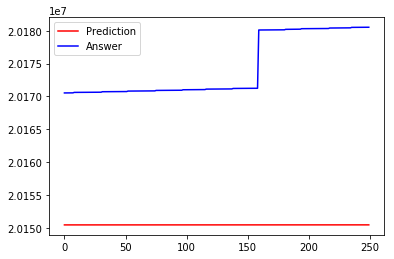

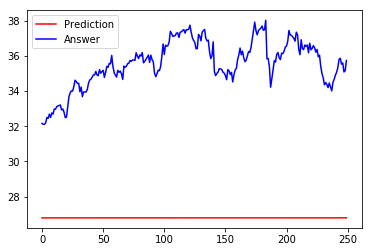

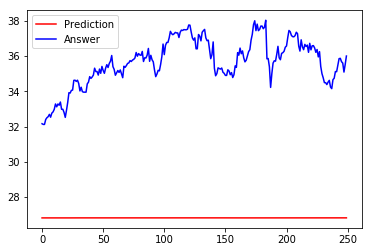

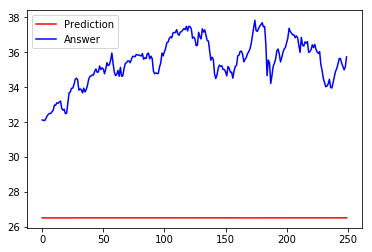

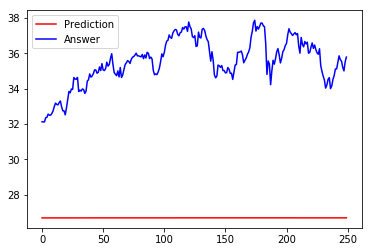

250/250 [==============================] - 0s 1ms/step
[array([[ 20150424.],
       [ 20150424.],
       [ 20150424.],
       [ 20150422.],
       [ 20150424.],
       [ 20150426.],
       [ 20150426.],
       [ 20150424.],
       [ 20150422.],
       [ 20150424.],
       [ 20150422.],
       [ 20150424.],
       [ 20150424.],
       [ 20150424.],
       [ 20150424.],
       [ 20150426.],
       [ 20150424.],
       [ 20150424.],
       [ 20150424.],
       [ 20150424.],
       [ 20150424.],
       [ 20150426.],
       [ 20150424.],
       [ 20150424.],
       [ 20150426.],
       [ 20150426.],
       [ 20150428.],
       [ 20150424.],
       [ 20150424.],
       [ 20150426.],
       [ 20150426.],
       [ 20150428.],
       [ 20150428.],
       [ 20150428.],
       [ 20150428.],
       [ 20150428.],
       [ 20150428.],
       [ 20150428.],
       [ 20150428.],
       [ 20150428.],
       [ 20150428.],
       [ 20150426.],
       [ 20150426.],
       [ 20150428.],
       [ 20150428.],

Train on 611 samples, validate on 263 samples
Epoch 1/50
611/611 [==============================] - 59s 97ms/step - loss: 0.0713 - acc: 0.1882 - val_loss: 0.1694 - val_acc: 0.0000e+00
Epoch 2/50
611/611 [==============================] - 1s 1ms/step - loss: 0.0678 - acc: 0.2520 - val_loss: 0.1598 - val_acc: 0.0000e+00
Epoch 3/50
611/611 [==============================] - 1s 1ms/step - loss: 0.0600 - acc: 0.2520 - val_loss: 0.1363 - val_acc: 0.0000e+00
Epoch 4/50
611/611 [==============================] - 1s 1ms/step - loss: 0.0448 - acc: 0.2520 - val_loss: 0.0986 - val_acc: 0.0000e+00
Epoch 5/50
611/611 [==============================] - 1s 1ms/step - loss: 0.0293 - acc: 0.2520 - val_loss: 0.0645 - val_acc: 0.0000e+00
Epoch 6/50
611/611 [==============================] - 1s 1ms/step - loss: 0.0267 - acc: 0.2520 - val_loss: 0.0503 - val_acc: 0.0000e+00
Epoch 7/50
611/611 [==============================] - 1s 1ms/step - loss: 0.0229 - acc: 0.2504 - val_loss: 0.0512 - val_acc: 0.0000e+00


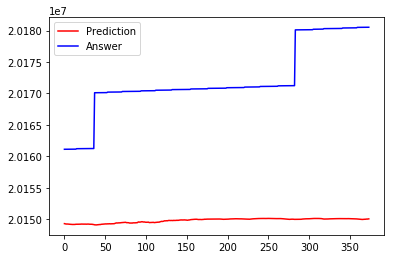

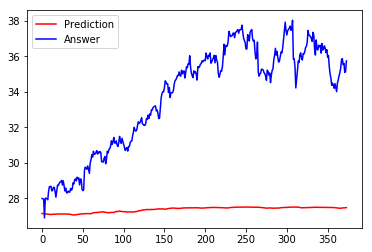

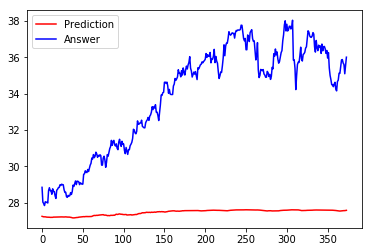

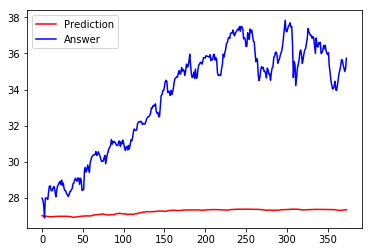

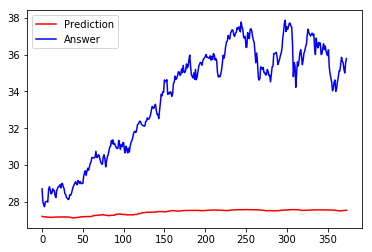

374/374 [==============================] - 0s 251us/step
[array([[ 20149280.],
       [ 20149242.],
       [ 20149218.],
       [ 20149220.],
       [ 20149216.],
       [ 20149198.],
       [ 20149174.],
       [ 20149176.],
       [ 20149166.],
       [ 20149164.],
       [ 20149148.],
       [ 20149156.],
       [ 20149152.],
       [ 20149154.],
       [ 20149182.],
       [ 20149178.],
       [ 20149184.],
       [ 20149186.],
       [ 20149186.],
       [ 20149194.],
       [ 20149198.],
       [ 20149212.],
       [ 20149204.],
       [ 20149202.],
       [ 20149206.],
       [ 20149200.],
       [ 20149202.],
       [ 20149194.],
       [ 20149206.],
       [ 20149212.],
       [ 20149196.],
       [ 20149186.],
       [ 20149186.],
       [ 20149190.],
       [ 20149178.],
       [ 20149146.],
       [ 20149134.],
       [ 20149092.],
       [ 20149076.],
       [ 20149076.],
       [ 20149092.],
       [ 20149106.],
       [ 20149118.],
       [ 20149136.],
       [ 20149134.

Train on 699 samples, validate on 175 samples
Epoch 1/50
699/699 [==============================] - 62s 88ms/step - loss: 0.0752 - acc: 0.0787 - val_loss: 0.2056 - val_acc: 0.0000e+00
Epoch 2/50
699/699 [==============================] - 5s 7ms/step - loss: 0.0712 - acc: 0.0544 - val_loss: 0.1849 - val_acc: 0.0000e+00
Epoch 3/50
699/699 [==============================] - 4s 6ms/step - loss: 0.0570 - acc: 0.0544 - val_loss: 0.1337 - val_acc: 0.0000e+00
Epoch 4/50
699/699 [==============================] - 5s 6ms/step - loss: 0.0354 - acc: 0.0544 - val_loss: 0.0745 - val_acc: 0.0000e+00
Epoch 5/50
699/699 [==============================] - 5s 7ms/step - loss: 0.0241 - acc: 0.1903 - val_loss: 0.0427 - val_acc: 0.0000e+00
Epoch 6/50
699/699 [==============================] - 4s 6ms/step - loss: 0.0211 - acc: 0.2847 - val_loss: 0.0543 - val_acc: 1.0000
Epoch 7/50
699/699 [==============================] - 4s 6ms/step - loss: 0.0206 - acc: 0.2790 - val_loss: 0.0659 - val_acc: 0.0000e+00
Epoc

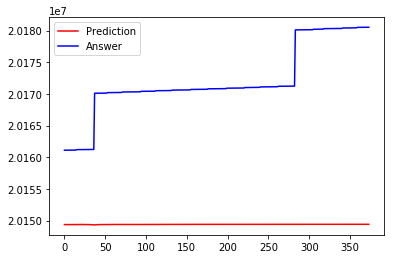

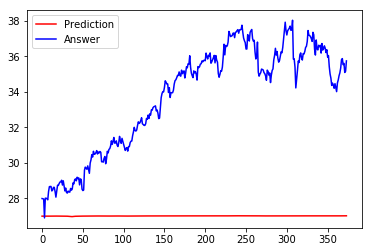

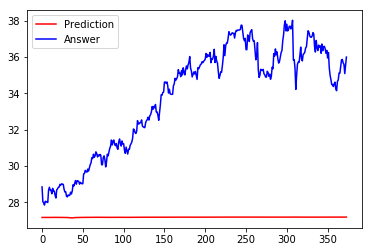

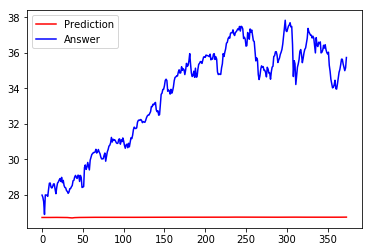

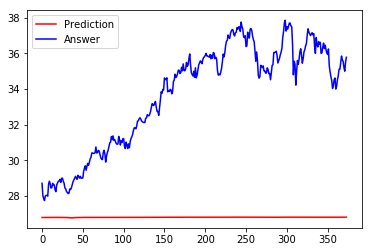

374/374 [==============================] - 1s 2ms/step
[array([[ 20149374.],
       [ 20149372.],
       [ 20149372.],
       [ 20149372.],
       [ 20149372.],
       [ 20149366.],
       [ 20149368.],
       [ 20149368.],
       [ 20149370.],
       [ 20149374.],
       [ 20149376.],
       [ 20149380.],
       [ 20149380.],
       [ 20149380.],
       [ 20149382.],
       [ 20149382.],
       [ 20149384.],
       [ 20149384.],
       [ 20149382.],
       [ 20149382.],
       [ 20149380.],
       [ 20149382.],
       [ 20149384.],
       [ 20149382.],
       [ 20149382.],
       [ 20149380.],
       [ 20149382.],
       [ 20149380.],
       [ 20149380.],
       [ 20149380.],
       [ 20149374.],
       [ 20149368.],
       [ 20149354.],
       [ 20149342.],
       [ 20149326.],
       [ 20149328.],
       [ 20149322.],
       [ 20149318.],
       [ 20149336.],
       [ 20149342.],
       [ 20149354.],
       [ 20149362.],
       [ 20149364.],
       [ 20149372.],
       [ 20149372.],

Train on 693 samples, validate on 174 samples
Epoch 1/50
693/693 [==============================] - 58s 84ms/step - loss: 0.0764 - acc: 0.0548 - val_loss: 0.2082 - val_acc: 0.0000e+00
Epoch 2/50
693/693 [==============================] - 0s 551us/step - loss: 0.0736 - acc: 0.0491 - val_loss: 0.2012 - val_acc: 0.0000e+00
Epoch 3/50
693/693 [==============================] - 0s 603us/step - loss: 0.0693 - acc: 0.0476 - val_loss: 0.1883 - val_acc: 0.0000e+00
Epoch 4/50
693/693 [==============================] - 0s 582us/step - loss: 0.0610 - acc: 0.0476 - val_loss: 0.1647 - val_acc: 0.0000e+00
Epoch 5/50
693/693 [==============================] - 0s 623us/step - loss: 0.0478 - acc: 0.0476 - val_loss: 0.1300 - val_acc: 0.0000e+00
Epoch 6/50
693/693 [==============================] - 0s 599us/step - loss: 0.0334 - acc: 0.0476 - val_loss: 0.0910 - val_acc: 0.0000e+00
Epoch 7/50
693/693 [==============================] - 0s 616us/step - loss: 0.0249 - acc: 0.0476 - val_loss: 0.0592 - val_acc:

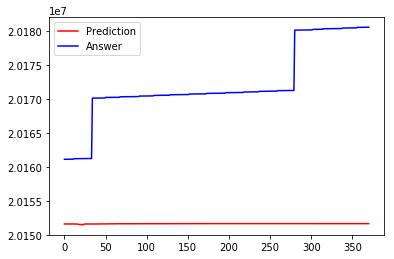

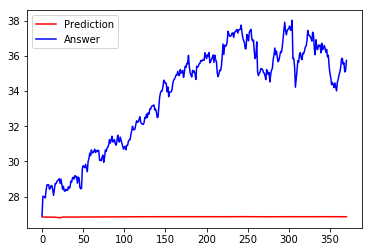

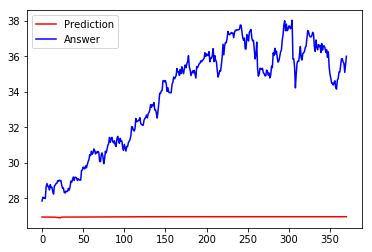

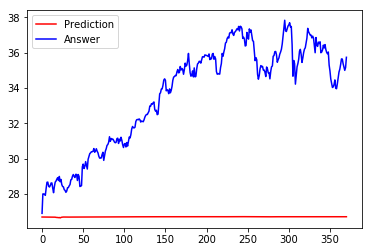

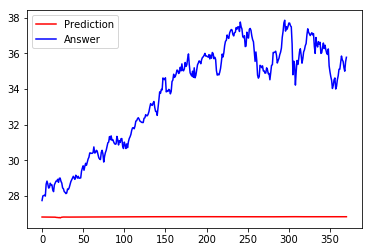

371/371 [==============================] - 0s 197us/step
[array([[ 20151608.],
       [ 20151606.],
       [ 20151604.],
       [ 20151604.],
       [ 20151602.],
       [ 20151602.],
       [ 20151604.],
       [ 20151604.],
       [ 20151604.],
       [ 20151604.],
       [ 20151604.],
       [ 20151606.],
       [ 20151604.],
       [ 20151600.],
       [ 20151596.],
       [ 20151592.],
       [ 20151582.],
       [ 20151552.],
       [ 20151548.],
       [ 20151530.],
       [ 20151504.],
       [ 20151532.],
       [ 20151466.],
       [ 20151536.],
       [ 20151578.],
       [ 20151596.],
       [ 20151604.],
       [ 20151606.],
       [ 20151606.],
       [ 20151602.],
       [ 20151602.],
       [ 20151598.],
       [ 20151598.],
       [ 20151596.],
       [ 20151594.],
       [ 20151596.],
       [ 20151596.],
       [ 20151600.],
       [ 20151600.],
       [ 20151600.],
       [ 20151604.],
       [ 20151604.],
       [ 20151604.],
       [ 20151604.],
       [ 20151604.

Train on 779 samples, validate on 335 samples
Epoch 1/51
779/779 [==============================] - 60s 77ms/step - loss: 0.0851 - acc: 0.1797 - val_loss: 0.4582 - val_acc: 0.0567
Epoch 2/51
779/779 [==============================] - 2s 3ms/step - loss: 0.0782 - acc: 0.1194 - val_loss: 0.4246 - val_acc: 0.0567
Epoch 3/51
779/779 [==============================] - 3s 3ms/step - loss: 0.0644 - acc: 0.1386 - val_loss: 0.3687 - val_acc: 0.0567
Epoch 4/51
779/779 [==============================] - 3s 3ms/step - loss: 0.0463 - acc: 0.1040 - val_loss: 0.2956 - val_acc: 0.0716
Epoch 5/51
779/779 [==============================] - 3s 3ms/step - loss: 0.0302 - acc: 0.0834 - val_loss: 0.2101 - val_acc: 0.0716
Epoch 6/51
779/779 [==============================] - 3s 4ms/step - loss: 0.0246 - acc: 0.1001 - val_loss: 0.1571 - val_acc: 0.0567
Epoch 7/51
779/779 [==============================] - 3s 3ms/step - loss: 0.0257 - acc: 0.1155 - val_loss: 0.1581 - val_acc: 0.0388
Epoch 8/51
779/779 [========

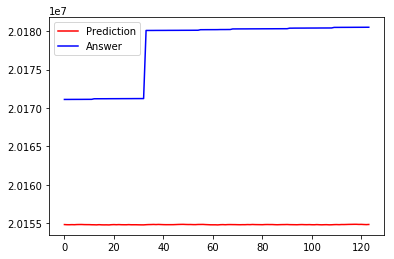

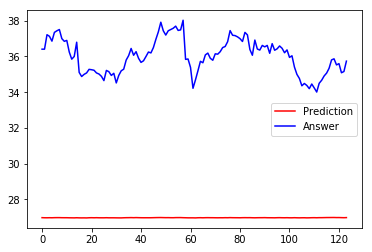

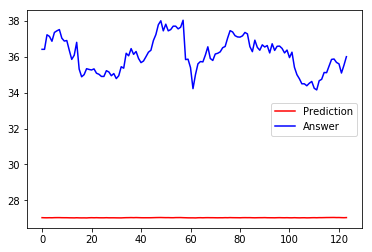

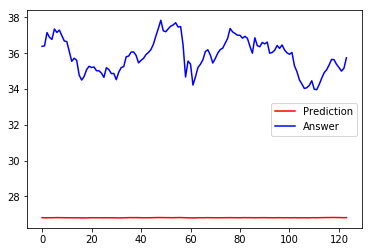

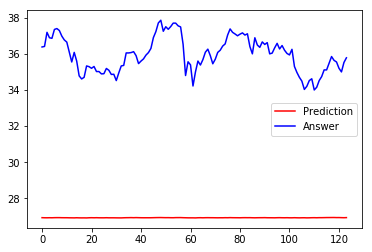

124/124 [==============================] - 0s 1ms/step
[array([[ 20154814.],
       [ 20154796.],
       [ 20154792.],
       [ 20154804.],
       [ 20154794.],
       [ 20154814.],
       [ 20154820.],
       [ 20154822.],
       [ 20154808.],
       [ 20154804.],
       [ 20154804.],
       [ 20154790.],
       [ 20154786.],
       [ 20154776.],
       [ 20154800.],
       [ 20154780.],
       [ 20154774.],
       [ 20154778.],
       [ 20154768.],
       [ 20154796.],
       [ 20154808.],
       [ 20154794.],
       [ 20154810.],
       [ 20154794.],
       [ 20154790.],
       [ 20154788.],
       [ 20154806.],
       [ 20154788.],
       [ 20154790.],
       [ 20154790.],
       [ 20154782.],
       [ 20154776.],
       [ 20154774.],
       [ 20154796.],
       [ 20154812.],
       [ 20154816.],
       [ 20154828.],
       [ 20154814.],
       [ 20154830.],
       [ 20154816.],
       [ 20154804.],
       [ 20154798.],
       [ 20154800.],
       [ 20154800.],
       [ 20154802.],

Train on 884 samples, validate on 221 samples
Epoch 1/50
884/884 [==============================] - 71s 81ms/step - loss: 0.1056 - acc: 0.0701 - val_loss: 0.5157 - val_acc: 0.1131
Epoch 2/50
884/884 [==============================] - 11s 12ms/step - loss: 0.0742 - acc: 0.0362 - val_loss: 0.3811 - val_acc: 0.0588
Epoch 3/50
884/884 [==============================] - 11s 13ms/step - loss: 0.0400 - acc: 0.0385 - val_loss: 0.2174 - val_acc: 0.0588
Epoch 4/50
884/884 [==============================] - 12s 13ms/step - loss: 0.0301 - acc: 0.1143 - val_loss: 0.2024 - val_acc: 0.1719
Epoch 5/50
884/884 [==============================] - 11s 13ms/step - loss: 0.0292 - acc: 0.2636 - val_loss: 0.2440 - val_acc: 0.1719
Epoch 6/50
884/884 [==============================] - 11s 13ms/step - loss: 0.0269 - acc: 0.3688 - val_loss: 0.2390 - val_acc: 0.5701
Epoch 7/50
884/884 [==============================] - 11s 13ms/step - loss: 0.0264 - acc: 0.4989 - val_loss: 0.2303 - val_acc: 0.5701
Epoch 8/50
884/8

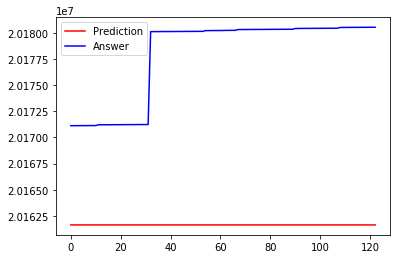

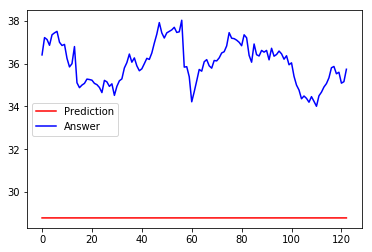

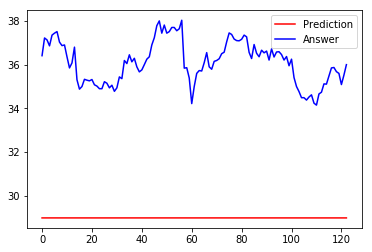

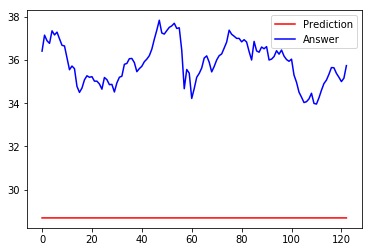

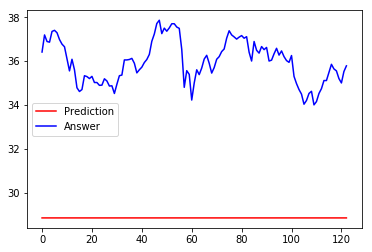

123/123 [==============================] - 0s 3ms/step
[array([[ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161640.],
       [ 20161640.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161640.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161638.],
       [ 20161640.],

Train on 785 samples, validate on 197 samples
Epoch 1/50
785/785 [==============================] - 58s 74ms/step - loss: 0.0853 - acc: 0.0497 - val_loss: 0.3159 - val_acc: 0.0000e+00
Epoch 2/50
785/785 [==============================] - 0s 497us/step - loss: 0.0691 - acc: 0.0459 - val_loss: 0.2558 - val_acc: 0.0000e+00
Epoch 3/50
785/785 [==============================] - 0s 508us/step - loss: 0.0412 - acc: 0.0471 - val_loss: 0.1563 - val_acc: 0.0000e+00
Epoch 4/50
785/785 [==============================] - 0s 510us/step - loss: 0.0224 - acc: 0.1146 - val_loss: 0.0698 - val_acc: 1.0000
Epoch 5/50
785/785 [==============================] - 0s 496us/step - loss: 0.0224 - acc: 0.4573 - val_loss: 0.0888 - val_acc: 1.0000
Epoch 6/50
785/785 [==============================] - 0s 533us/step - loss: 0.0195 - acc: 0.4624 - val_loss: 0.1127 - val_acc: 1.0000
Epoch 7/50
785/785 [==============================] - 0s 513us/step - loss: 0.0183 - acc: 0.4624 - val_loss: 0.0963 - val_acc: 1.0000
Epoc

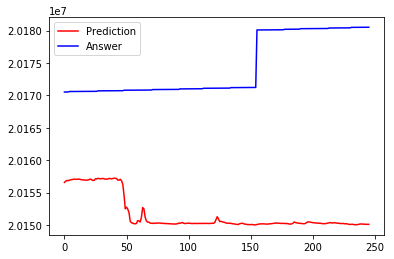

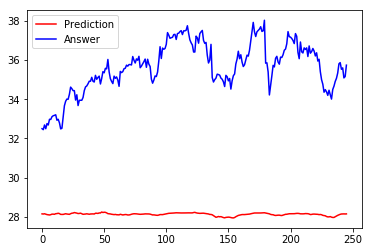

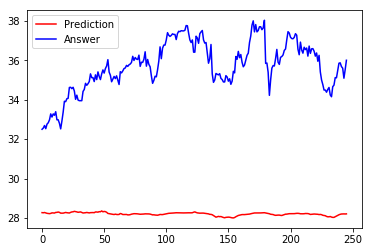

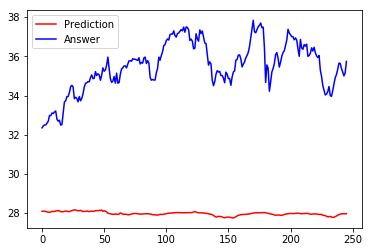

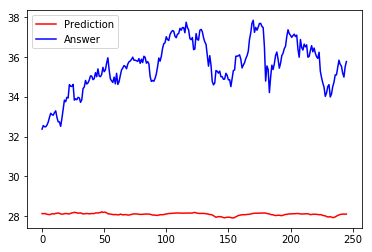

246/246 [==============================] - 0s 220us/step
[array([[ 20156572.],
       [ 20156750.],
       [ 20156872.],
       [ 20156846.],
       [ 20156916.],
       [ 20156972.],
       [ 20157010.],
       [ 20157034.],
       [ 20157074.],
       [ 20157052.],
       [ 20157052.],
       [ 20157078.],
       [ 20157068.],
       [ 20157022.],
       [ 20156976.],
       [ 20156970.],
       [ 20156950.],
       [ 20156912.],
       [ 20156942.],
       [ 20156932.],
       [ 20157036.],
       [ 20157080.],
       [ 20156962.],
       [ 20156874.],
       [ 20156884.],
       [ 20157128.],
       [ 20157110.],
       [ 20157210.],
       [ 20157170.],
       [ 20157118.],
       [ 20157148.],
       [ 20157188.],
       [ 20157120.],
       [ 20157080.],
       [ 20157074.],
       [ 20157094.],
       [ 20157196.],
       [ 20157156.],
       [ 20157118.],
       [ 20157172.],
       [ 20157228.],
       [ 20157202.],
       [ 20157166.],
       [ 20156906.],
       [ 20156934.

Train on 611 samples, validate on 263 samples
Epoch 1/51
611/611 [==============================] - 61s 100ms/step - loss: 0.0712 - acc: 0.2733 - val_loss: 0.1576 - val_acc: 1.0000
Epoch 2/51
611/611 [==============================] - 2s 3ms/step - loss: 0.0603 - acc: 0.2766 - val_loss: 0.0985 - val_acc: 1.0000
Epoch 3/51
611/611 [==============================] - 2s 3ms/step - loss: 0.0386 - acc: 0.2766 - val_loss: 0.0564 - val_acc: 1.0000
Epoch 4/51
611/611 [==============================] - 2s 3ms/step - loss: 0.0280 - acc: 0.2766 - val_loss: 0.0511 - val_acc: 0.0000e+00
Epoch 5/51
611/611 [==============================] - 2s 3ms/step - loss: 0.0219 - acc: 0.3437 - val_loss: 0.0497 - val_acc: 0.0000e+00
Epoch 6/51
611/611 [==============================] - 2s 3ms/step - loss: 0.0204 - acc: 0.0556 - val_loss: 0.0472 - val_acc: 0.0000e+00
Epoch 7/51
611/611 [==============================] - 2s 3ms/step - loss: 0.0197 - acc: 0.1244 - val_loss: 0.0466 - val_acc: 0.0000e+00
Epoch 8/51


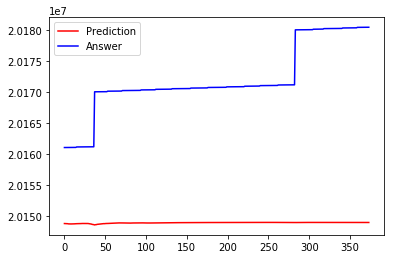

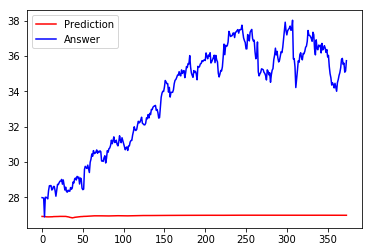

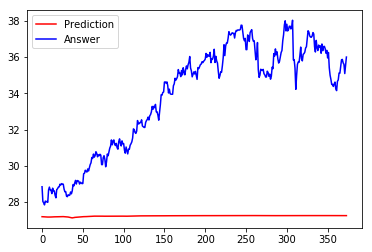

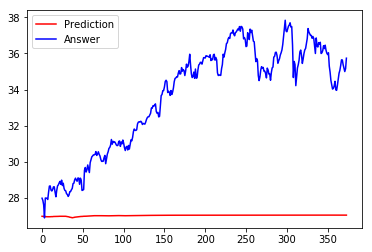

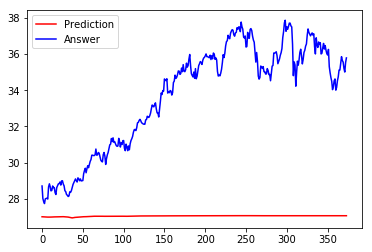

374/374 [==============================] - 0s 866us/step
[array([[ 20148842.],
       [ 20148830.],
       [ 20148826.],
       [ 20148822.],
       [ 20148816.],
       [ 20148786.],
       [ 20148778.],
       [ 20148778.],
       [ 20148776.],
       [ 20148784.],
       [ 20148780.],
       [ 20148796.],
       [ 20148792.],
       [ 20148796.],
       [ 20148816.],
       [ 20148818.],
       [ 20148828.],
       [ 20148826.],
       [ 20148826.],
       [ 20148830.],
       [ 20148836.],
       [ 20148850.],
       [ 20148850.],
       [ 20148850.],
       [ 20148854.],
       [ 20148848.],
       [ 20148856.],
       [ 20148848.],
       [ 20148854.],
       [ 20148846.],
       [ 20148828.],
       [ 20148810.],
       [ 20148784.],
       [ 20148756.],
       [ 20148708.],
       [ 20148686.],
       [ 20148664.],
       [ 20148620.],
       [ 20148658.],
       [ 20148664.],
       [ 20148706.],
       [ 20148722.],
       [ 20148732.],
       [ 20148768.],
       [ 20148758.

Train on 773 samples, validate on 332 samples
Epoch 1/50
773/773 [==============================] - 64s 83ms/step - loss: 0.0869 - acc: 0.2639 - val_loss: 0.4690 - val_acc: 0.1145
Epoch 2/50
773/773 [==============================] - 4s 5ms/step - loss: 0.0823 - acc: 0.2678 - val_loss: 0.4442 - val_acc: 0.1145
Epoch 3/50
773/773 [==============================] - 4s 5ms/step - loss: 0.0722 - acc: 0.2652 - val_loss: 0.3997 - val_acc: 0.1145
Epoch 4/50
773/773 [==============================] - 4s 5ms/step - loss: 0.0573 - acc: 0.2652 - val_loss: 0.3374 - val_acc: 0.1145
Epoch 5/50
773/773 [==============================] - 4s 5ms/step - loss: 0.0414 - acc: 0.2652 - val_loss: 0.2584 - val_acc: 0.1145
Epoch 6/50
773/773 [==============================] - 4s 5ms/step - loss: 0.0291 - acc: 0.2639 - val_loss: 0.1851 - val_acc: 0.1145
Epoch 7/50
773/773 [==============================] - 4s 5ms/step - loss: 0.0265 - acc: 0.2354 - val_loss: 0.1638 - val_acc: 0.0753
Epoch 8/50
773/773 [========

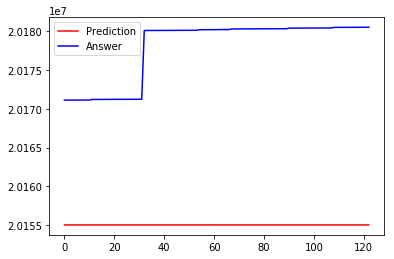

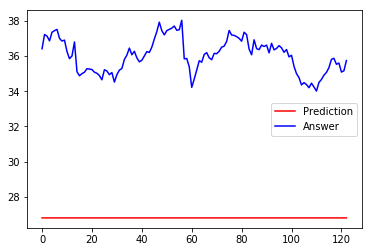

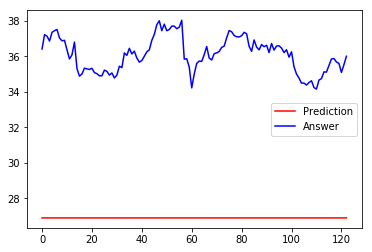

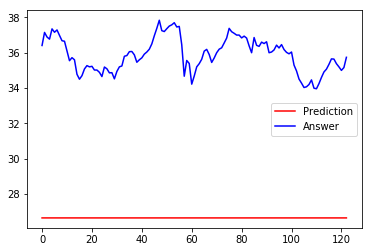

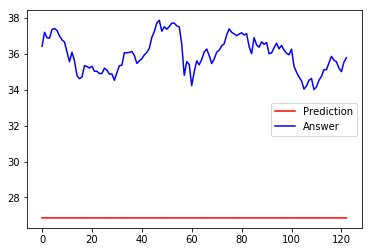

123/123 [==============================] - 0s 2ms/step
[array([[ 20155014.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155014.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],
       [ 20155012.],

Train on 891 samples, validate on 99 samples
Epoch 1/50
891/891 [==============================] - 62s 70ms/step - loss: 0.1034 - acc: 0.0853 - val_loss: 0.3608 - val_acc: 0.0000e+00
Epoch 2/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0711 - acc: 0.0438 - val_loss: 0.2311 - val_acc: 0.0000e+00
Epoch 3/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0357 - acc: 0.0438 - val_loss: 0.0951 - val_acc: 0.0000e+00
Epoch 4/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0285 - acc: 0.3210 - val_loss: 0.1347 - val_acc: 1.0000
Epoch 5/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0276 - acc: 0.5039 - val_loss: 0.1341 - val_acc: 1.0000
Epoch 6/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0266 - acc: 0.5039 - val_loss: 0.1144 - val_acc: 1.0000
Epoch 7/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0262 - acc: 0.4983 - val_loss: 0.1280 - val_acc: 1.0000
Epoch 8/50
891/89

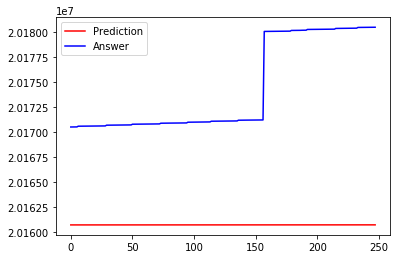

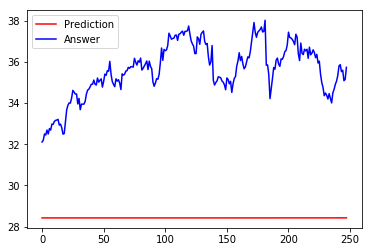

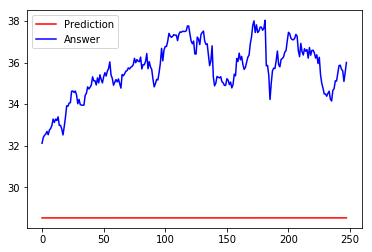

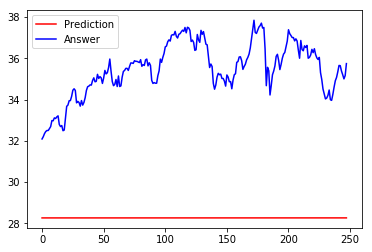

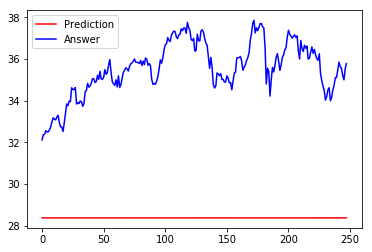

248/248 [==============================] - 0s 452us/step
[array([[ 20160706.],
       [ 20160706.],
       [ 20160706.],
       [ 20160706.],
       [ 20160706.],
       [ 20160706.],
       [ 20160706.],
       [ 20160706.],
       [ 20160706.],
       [ 20160706.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160708.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.],
       [ 20160710.

Train on 687 samples, validate on 295 samples
Epoch 1/50
687/687 [==============================] - 66s 97ms/step - loss: 0.0779 - acc: 0.1354 - val_loss: 0.2705 - val_acc: 0.0000e+00
Epoch 2/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0694 - acc: 0.1659 - val_loss: 0.2303 - val_acc: 0.0000e+00
Epoch 3/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0515 - acc: 0.2649 - val_loss: 0.1815 - val_acc: 0.0000e+00
Epoch 4/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0352 - acc: 0.2926 - val_loss: 0.1283 - val_acc: 0.0000e+00
Epoch 5/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0250 - acc: 0.2955 - val_loss: 0.0800 - val_acc: 0.0000e+00
Epoch 6/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0240 - acc: 0.2722 - val_loss: 0.0678 - val_acc: 0.0000e+00
Epoch 7/50
687/687 [==============================] - 7s 10ms/step - loss: 0.0225 - acc: 0.2897 - val_loss: 0.0832 - val_acc: 1.000

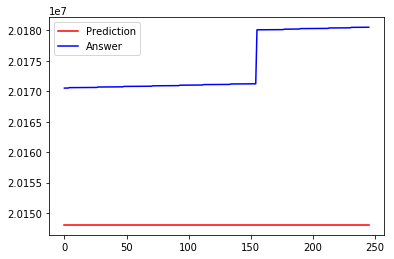

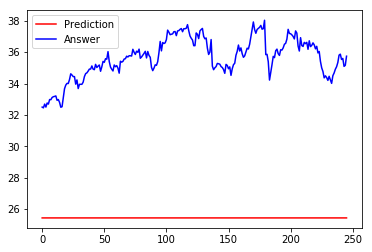

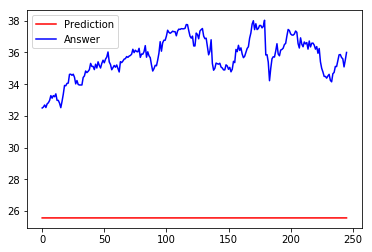

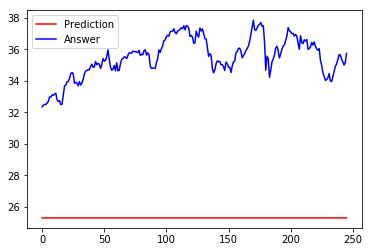

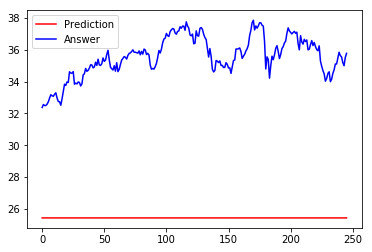

246/246 [==============================] - 1s 2ms/step
[array([[ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],
       [ 20148046.],

Train on 611 samples, validate on 263 samples
Epoch 1/50
611/611 [==============================] - 66s 108ms/step - loss: 0.0709 - acc: 0.2144 - val_loss: 0.1557 - val_acc: 0.0000e+00
Epoch 2/50
611/611 [==============================] - 4s 6ms/step - loss: 0.0526 - acc: 0.2160 - val_loss: 0.0608 - val_acc: 0.0000e+00
Epoch 3/50
611/611 [==============================] - 4s 6ms/step - loss: 0.0240 - acc: 0.2062 - val_loss: 0.0357 - val_acc: 0.0000e+00
Epoch 4/50
611/611 [==============================] - 4s 6ms/step - loss: 0.0225 - acc: 0.2700 - val_loss: 0.0587 - val_acc: 0.0000e+00
Epoch 5/50
611/611 [==============================] - 4s 6ms/step - loss: 0.0211 - acc: 0.2831 - val_loss: 0.0536 - val_acc: 1.0000
Epoch 6/50
611/611 [==============================] - 4s 6ms/step - loss: 0.0207 - acc: 0.1964 - val_loss: 0.0375 - val_acc: 1.0000
Epoch 7/50
611/611 [==============================] - 4s 6ms/step - loss: 0.0218 - acc: 0.2177 - val_loss: 0.0339 - val_acc: 1.0000
Epoch 8/50


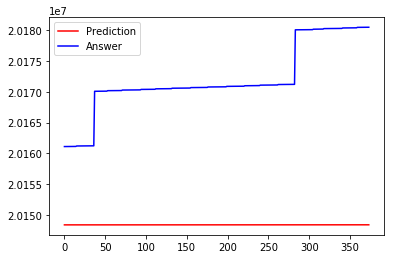

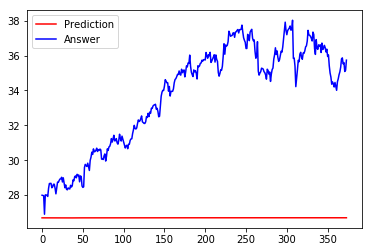

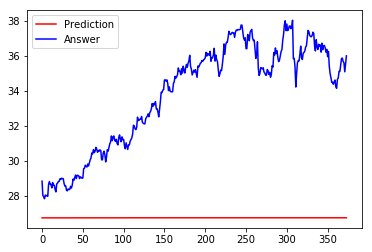

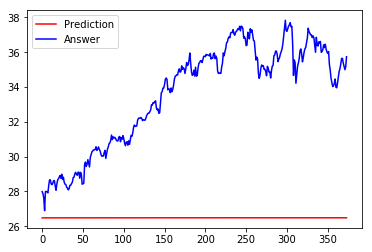

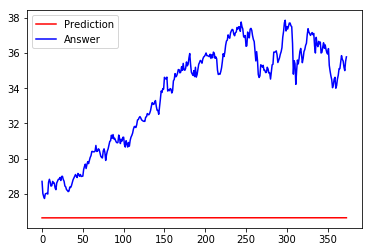

374/374 [==============================] - 1s 1ms/step
[array([[ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148366.],
       [ 20148366.],
       [ 20148366.],
       [ 20148366.],
       [ 20148366.],
       [ 20148366.],
       [ 20148366.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148368.],
       [ 20148366.],
       [ 20148366.],
       [ 20148364.],
       [ 20148362.],
       [ 20148362.],
       [ 20148360.],
       [ 20148360.],
       [ 20148360.],
       [ 20148360.],
       [ 20148360.],
       [ 20148362.],
       [ 20148364.],
       [ 20148366.],
       [ 20148366.],

Train on 898 samples, validate on 225 samples
Epoch 1/51
898/898 [==============================] - 61s 68ms/step - loss: 0.1055 - acc: 0.0434 - val_loss: 0.5537 - val_acc: 0.1067
Epoch 2/51
898/898 [==============================] - 1s 1ms/step - loss: 0.0984 - acc: 0.0423 - val_loss: 0.5197 - val_acc: 0.1067
Epoch 3/51
898/898 [==============================] - 1s 1ms/step - loss: 0.0850 - acc: 0.0423 - val_loss: 0.4612 - val_acc: 0.1067
Epoch 4/51
898/898 [==============================] - 1s 1ms/step - loss: 0.0665 - acc: 0.0434 - val_loss: 0.3805 - val_acc: 0.1067
Epoch 5/51
898/898 [==============================] - 1s 1ms/step - loss: 0.0485 - acc: 0.0468 - val_loss: 0.2865 - val_acc: 0.0578
Epoch 6/51
898/898 [==============================] - 1s 1ms/step - loss: 0.0396 - acc: 0.0457 - val_loss: 0.2216 - val_acc: 0.0578
Epoch 7/51
898/898 [==============================] - 1s 1ms/step - loss: 0.0334 - acc: 0.0367 - val_loss: 0.2055 - val_acc: 0.0578
Epoch 8/51
898/898 [========

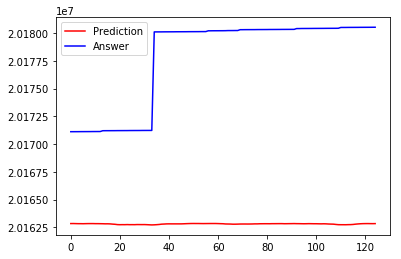

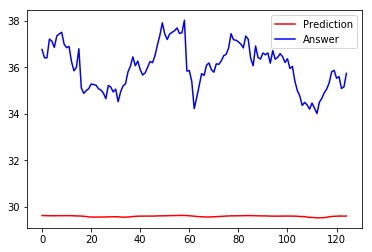

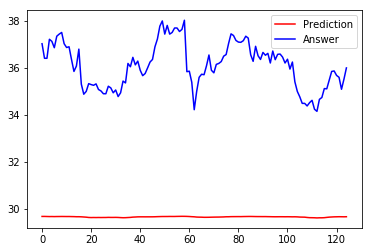

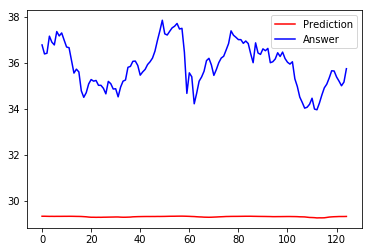

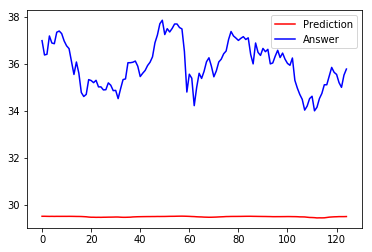

125/125 [==============================] - 0s 504us/step
[array([[ 20162840.],
       [ 20162842.],
       [ 20162836.],
       [ 20162830.],
       [ 20162830.],
       [ 20162826.],
       [ 20162832.],
       [ 20162836.],
       [ 20162838.],
       [ 20162838.],
       [ 20162832.],
       [ 20162832.],
       [ 20162828.],
       [ 20162824.],
       [ 20162816.],
       [ 20162818.],
       [ 20162810.],
       [ 20162790.],
       [ 20162774.],
       [ 20162746.],
       [ 20162738.],
       [ 20162742.],
       [ 20162740.],
       [ 20162748.],
       [ 20162740.],
       [ 20162742.],
       [ 20162740.],
       [ 20162750.],
       [ 20162748.],
       [ 20162746.],
       [ 20162748.],
       [ 20162740.],
       [ 20162728.],
       [ 20162718.],
       [ 20162726.],
       [ 20162740.],
       [ 20162758.],
       [ 20162786.],
       [ 20162796.],
       [ 20162810.],
       [ 20162814.],
       [ 20162812.],
       [ 20162812.],
       [ 20162812.],
       [ 20162812.

Train on 785 samples, validate on 197 samples
Epoch 1/50
785/785 [==============================] - 62s 79ms/step - loss: 0.0865 - acc: 0.2217 - val_loss: 0.3238 - val_acc: 0.0000e+00
Epoch 2/50
785/785 [==============================] - 1s 698us/step - loss: 0.0741 - acc: 0.1873 - val_loss: 0.2774 - val_acc: 0.0000e+00
Epoch 3/50
785/785 [==============================] - 1s 680us/step - loss: 0.0500 - acc: 0.1885 - val_loss: 0.1890 - val_acc: 0.0000e+00
Epoch 4/50
785/785 [==============================] - 1s 698us/step - loss: 0.0278 - acc: 0.1885 - val_loss: 0.0941 - val_acc: 0.0000e+00
Epoch 5/50
785/785 [==============================] - 1s 713us/step - loss: 0.0245 - acc: 0.1898 - val_loss: 0.0933 - val_acc: 0.0000e+00
Epoch 6/50
785/785 [==============================] - 1s 725us/step - loss: 0.0209 - acc: 0.4178 - val_loss: 0.1147 - val_acc: 1.0000
Epoch 7/50
785/785 [==============================] - 1s 699us/step - loss: 0.0210 - acc: 0.4624 - val_loss: 0.1135 - val_acc: 1.0

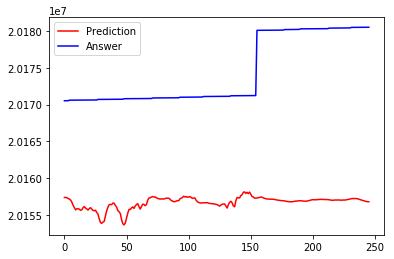

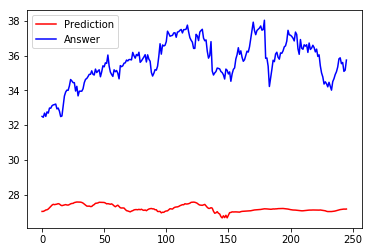

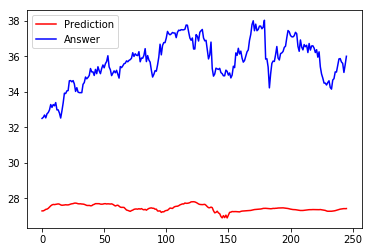

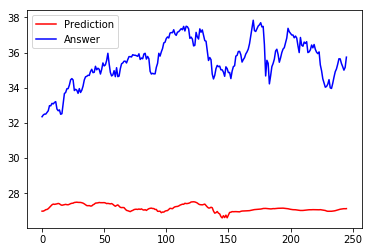

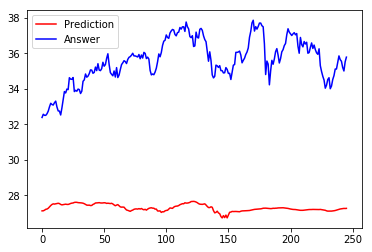

246/246 [==============================] - 0s 236us/step
[array([[ 20157370.],
       [ 20157356.],
       [ 20157348.],
       [ 20157226.],
       [ 20157158.],
       [ 20157010.],
       [ 20156722.],
       [ 20156304.],
       [ 20155982.],
       [ 20155678.],
       [ 20155826.],
       [ 20155852.],
       [ 20155762.],
       [ 20155620.],
       [ 20155702.],
       [ 20155974.],
       [ 20156132.],
       [ 20155932.],
       [ 20155810.],
       [ 20155654.],
       [ 20155858.],
       [ 20155978.],
       [ 20155790.],
       [ 20155618.],
       [ 20155558.],
       [ 20155638.],
       [ 20155332.],
       [ 20155114.],
       [ 20154476.],
       [ 20153968.],
       [ 20153850.],
       [ 20154020.],
       [ 20154110.],
       [ 20154824.],
       [ 20155548.],
       [ 20156030.],
       [ 20156388.],
       [ 20156420.],
       [ 20156392.],
       [ 20156604.],
       [ 20156594.],
       [ 20156288.],
       [ 20156074.],
       [ 20155580.],
       [ 20155432.

Train on 891 samples, validate on 223 samples
Epoch 1/51
891/891 [==============================] - 69s 77ms/step - loss: 0.1068 - acc: 0.1089 - val_loss: 0.5579 - val_acc: 0.0583
Epoch 2/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0995 - acc: 0.0763 - val_loss: 0.5252 - val_acc: 0.0583
Epoch 3/51
891/891 [==============================] - 2s 3ms/step - loss: 0.0862 - acc: 0.0976 - val_loss: 0.4711 - val_acc: 0.0583
Epoch 4/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0663 - acc: 0.0988 - val_loss: 0.3978 - val_acc: 0.0583
Epoch 5/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0459 - acc: 0.1021 - val_loss: 0.3115 - val_acc: 0.0583
Epoch 6/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0306 - acc: 0.1369 - val_loss: 0.2227 - val_acc: 0.0583
Epoch 7/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0291 - acc: 0.2570 - val_loss: 0.1697 - val_acc: 0.5785
Epoch 8/51
891/891 [========

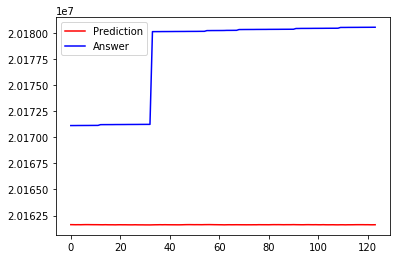

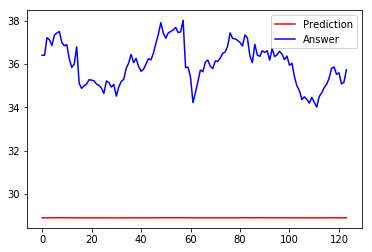

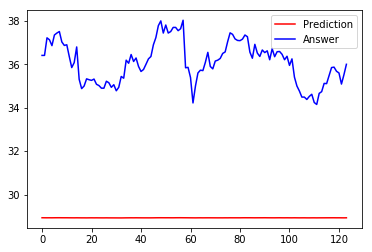

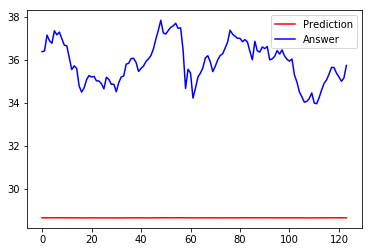

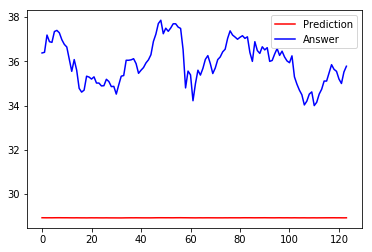

124/124 [==============================] - 0s 476us/step
[array([[ 20161634.],
       [ 20161630.],
       [ 20161626.],
       [ 20161630.],
       [ 20161626.],
       [ 20161632.],
       [ 20161636.],
       [ 20161636.],
       [ 20161632.],
       [ 20161630.],
       [ 20161630.],
       [ 20161628.],
       [ 20161624.],
       [ 20161622.],
       [ 20161628.],
       [ 20161622.],
       [ 20161620.],
       [ 20161620.],
       [ 20161616.],
       [ 20161622.],
       [ 20161624.],
       [ 20161620.],
       [ 20161622.],
       [ 20161618.],
       [ 20161616.],
       [ 20161616.],
       [ 20161622.],
       [ 20161616.],
       [ 20161614.],
       [ 20161614.],
       [ 20161610.],
       [ 20161610.],
       [ 20161608.],
       [ 20161614.],
       [ 20161620.],
       [ 20161622.],
       [ 20161628.],
       [ 20161622.],
       [ 20161628.],
       [ 20161624.],
       [ 20161622.],
       [ 20161620.],
       [ 20161620.],
       [ 20161618.],
       [ 20161618.

Train on 786 samples, validate on 337 samples
Epoch 1/50
786/786 [==============================] - 68s 86ms/step - loss: 0.0818 - acc: 0.1349 - val_loss: 0.4431 - val_acc: 0.0712
Epoch 2/50
786/786 [==============================] - 5s 7ms/step - loss: 0.0675 - acc: 0.1374 - val_loss: 0.3434 - val_acc: 0.0712
Epoch 3/50
786/786 [==============================] - 5s 7ms/step - loss: 0.0359 - acc: 0.0636 - val_loss: 0.1900 - val_acc: 0.0712
Epoch 4/50
786/786 [==============================] - 5s 7ms/step - loss: 0.0270 - acc: 0.0573 - val_loss: 0.1642 - val_acc: 0.0712
Epoch 5/50
786/786 [==============================] - 6s 7ms/step - loss: 0.0218 - acc: 0.2774 - val_loss: 0.2118 - val_acc: 0.7240
Epoch 6/50
786/786 [==============================] - 5s 7ms/step - loss: 0.0224 - acc: 0.3028 - val_loss: 0.2240 - val_acc: 0.0564
Epoch 7/50
786/786 [==============================] - 5s 7ms/step - loss: 0.0226 - acc: 0.3219 - val_loss: 0.2019 - val_acc: 0.7240
Epoch 8/50
786/786 [========

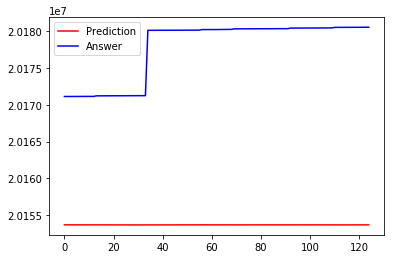

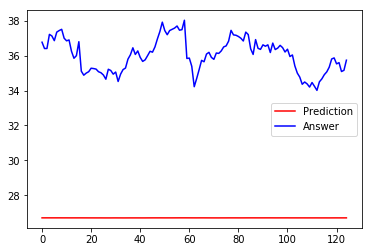

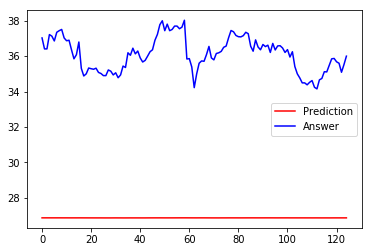

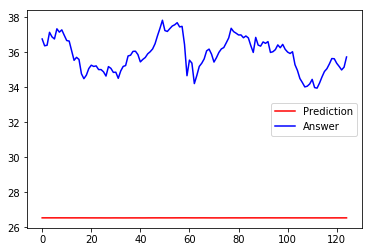

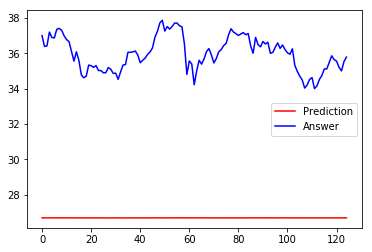

125/125 [==============================] - 0s 2ms/step
[array([[ 20153682.],
       [ 20153680.],
       [ 20153682.],
       [ 20153680.],
       [ 20153680.],
       [ 20153680.],
       [ 20153680.],
       [ 20153682.],
       [ 20153680.],
       [ 20153678.],
       [ 20153678.],
       [ 20153676.],
       [ 20153676.],
       [ 20153676.],
       [ 20153676.],
       [ 20153678.],
       [ 20153678.],
       [ 20153676.],
       [ 20153676.],
       [ 20153674.],
       [ 20153674.],
       [ 20153674.],
       [ 20153672.],
       [ 20153672.],
       [ 20153674.],
       [ 20153670.],
       [ 20153670.],
       [ 20153670.],
       [ 20153670.],
       [ 20153674.],
       [ 20153674.],
       [ 20153672.],
       [ 20153672.],
       [ 20153670.],
       [ 20153670.],
       [ 20153672.],
       [ 20153674.],
       [ 20153672.],
       [ 20153674.],
       [ 20153674.],
       [ 20153672.],
       [ 20153672.],
       [ 20153672.],
       [ 20153676.],
       [ 20153676.],

Train on 1002 samples, validate on 112 samples
Epoch 1/51
1002/1002 [==============================] - 65s 65ms/step - loss: 0.1379 - acc: 0.1657 - val_loss: 0.6798 - val_acc: 0.1161
Epoch 2/51
1002/1002 [==============================] - 1s 927us/step - loss: 0.1043 - acc: 0.2924 - val_loss: 0.4815 - val_acc: 0.1607
Epoch 3/51
1002/1002 [==============================] - 1s 858us/step - loss: 0.0461 - acc: 0.3882 - val_loss: 0.2159 - val_acc: 0.1607
Epoch 4/51
1002/1002 [==============================] - 1s 844us/step - loss: 0.0410 - acc: 0.5619 - val_loss: 0.3050 - val_acc: 0.1607
Epoch 5/51
1002/1002 [==============================] - 1s 888us/step - loss: 0.0388 - acc: 0.5689 - val_loss: 0.3283 - val_acc: 0.1607
Epoch 6/51
1002/1002 [==============================] - 1s 863us/step - loss: 0.0385 - acc: 0.5689 - val_loss: 0.2883 - val_acc: 0.1607
Epoch 7/51
1002/1002 [==============================] - 1s 872us/step - loss: 0.0386 - acc: 0.5689 - val_loss: 0.2894 - val_acc: 0.1607
E

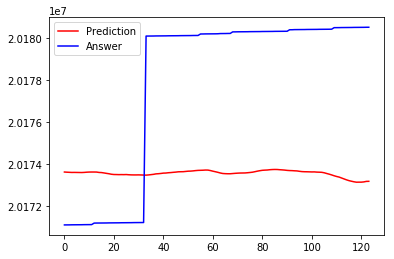

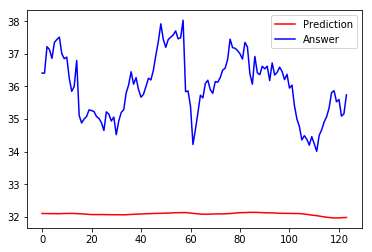

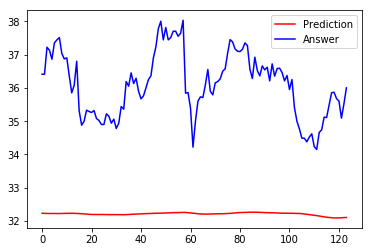

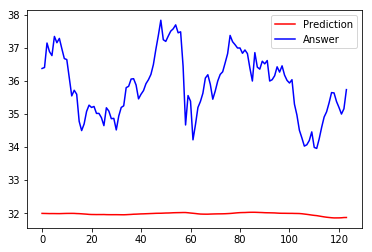

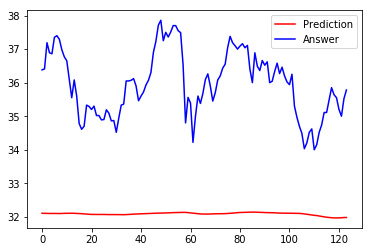

124/124 [==============================] - 0s 379us/step
[array([[ 20173632.],
       [ 20173624.],
       [ 20173618.],
       [ 20173612.],
       [ 20173614.],
       [ 20173612.],
       [ 20173610.],
       [ 20173608.],
       [ 20173614.],
       [ 20173624.],
       [ 20173630.],
       [ 20173632.],
       [ 20173632.],
       [ 20173630.],
       [ 20173612.],
       [ 20173606.],
       [ 20173588.],
       [ 20173568.],
       [ 20173550.],
       [ 20173526.],
       [ 20173514.],
       [ 20173512.],
       [ 20173508.],
       [ 20173510.],
       [ 20173508.],
       [ 20173512.],
       [ 20173502.],
       [ 20173496.],
       [ 20173494.],
       [ 20173494.],
       [ 20173496.],
       [ 20173492.],
       [ 20173488.],
       [ 20173484.],
       [ 20173494.],
       [ 20173508.],
       [ 20173522.],
       [ 20173544.],
       [ 20173552.],
       [ 20173564.],
       [ 20173580.],
       [ 20173584.],
       [ 20173598.],
       [ 20173606.],
       [ 20173618.

Train on 611 samples, validate on 263 samples
Epoch 1/50
611/611 [==============================] - 61s 100ms/step - loss: 0.0713 - acc: 0.2439 - val_loss: 0.1693 - val_acc: 0.0000e+00
Epoch 2/50
611/611 [==============================] - 0s 347us/step - loss: 0.0684 - acc: 0.2471 - val_loss: 0.1624 - val_acc: 0.0000e+00
Epoch 3/50
611/611 [==============================] - 0s 375us/step - loss: 0.0640 - acc: 0.2504 - val_loss: 0.1503 - val_acc: 0.0000e+00
Epoch 4/50
611/611 [==============================] - 0s 378us/step - loss: 0.0562 - acc: 0.2520 - val_loss: 0.1287 - val_acc: 0.0000e+00
Epoch 5/50
611/611 [==============================] - 0s 367us/step - loss: 0.0437 - acc: 0.2504 - val_loss: 0.0956 - val_acc: 0.0000e+00
Epoch 6/50
611/611 [==============================] - 0s 357us/step - loss: 0.0290 - acc: 0.2504 - val_loss: 0.0577 - val_acc: 0.0000e+00
Epoch 7/50
611/611 [==============================] - 0s 362us/step - loss: 0.0211 - acc: 0.2439 - val_loss: 0.0331 - val_acc

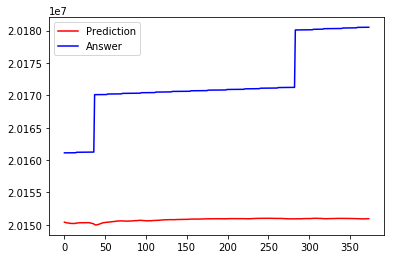

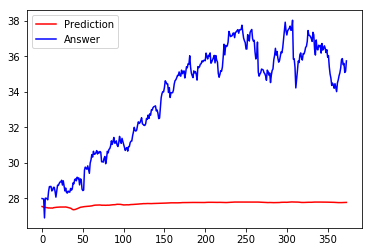

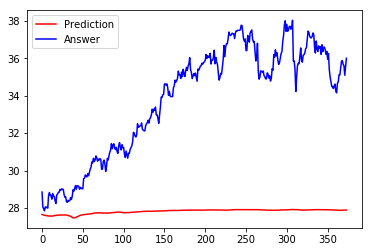

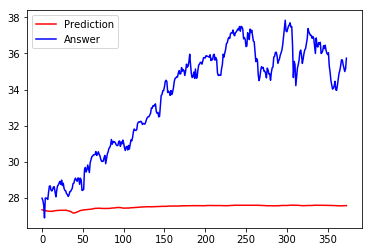

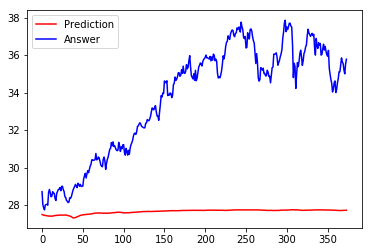

374/374 [==============================] - 0s 158us/step
[array([[ 20150394.],
       [ 20150368.],
       [ 20150322.],
       [ 20150290.],
       [ 20150284.],
       [ 20150272.],
       [ 20150236.],
       [ 20150228.],
       [ 20150200.],
       [ 20150214.],
       [ 20150192.],
       [ 20150204.],
       [ 20150192.],
       [ 20150190.],
       [ 20150242.],
       [ 20150252.],
       [ 20150272.],
       [ 20150290.],
       [ 20150298.],
       [ 20150310.],
       [ 20150312.],
       [ 20150324.],
       [ 20150326.],
       [ 20150326.],
       [ 20150328.],
       [ 20150318.],
       [ 20150326.],
       [ 20150318.],
       [ 20150330.],
       [ 20150340.],
       [ 20150322.],
       [ 20150292.],
       [ 20150268.],
       [ 20150248.],
       [ 20150216.],
       [ 20150178.],
       [ 20150120.],
       [ 20150038.],
       [ 20149984.],
       [ 20149974.],
       [ 20149992.],
       [ 20150024.],
       [ 20150064.],
       [ 20150116.],
       [ 20150152.

Train on 891 samples, validate on 99 samples
Epoch 1/50
891/891 [==============================] - 64s 71ms/step - loss: 0.1082 - acc: 0.1975 - val_loss: 0.3975 - val_acc: 1.0000
Epoch 2/50
891/891 [==============================] - 0s 222us/step - loss: 0.1044 - acc: 0.4175 - val_loss: 0.3880 - val_acc: 1.0000
Epoch 3/50
891/891 [==============================] - 0s 253us/step - loss: 0.0998 - acc: 0.4691 - val_loss: 0.3748 - val_acc: 1.0000
Epoch 4/50
891/891 [==============================] - 0s 266us/step - loss: 0.0935 - acc: 0.4826 - val_loss: 0.3567 - val_acc: 1.0000
Epoch 5/50
891/891 [==============================] - 0s 257us/step - loss: 0.0852 - acc: 0.4927 - val_loss: 0.3315 - val_acc: 1.0000
Epoch 6/50
891/891 [==============================] - 0s 265us/step - loss: 0.0739 - acc: 0.4949 - val_loss: 0.2950 - val_acc: 1.0000
Epoch 7/50
891/891 [==============================] - 0s 259us/step - loss: 0.0593 - acc: 0.4882 - val_loss: 0.2458 - val_acc: 1.0000
Epoch 8/50
891/89

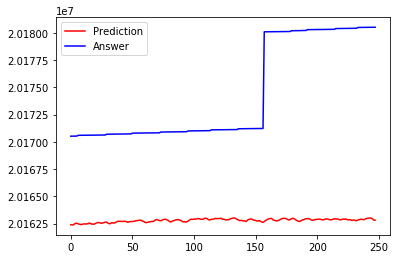

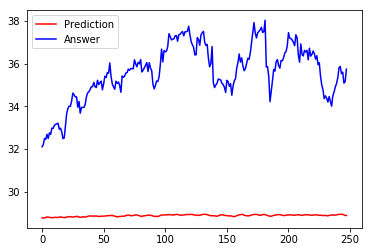

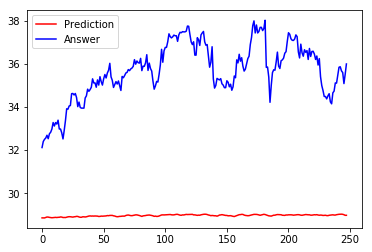

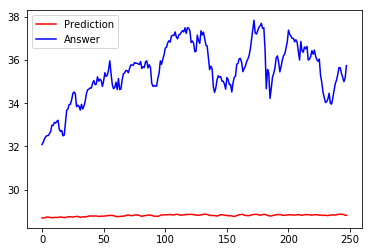

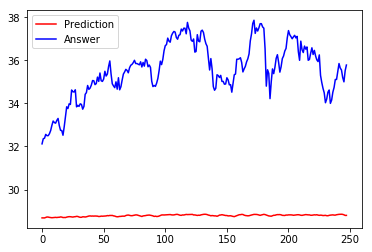

248/248 [==============================] - 0s 137us/step
[array([[ 20162384.],
       [ 20162384.],
       [ 20162376.],
       [ 20162464.],
       [ 20162532.],
       [ 20162522.],
       [ 20162474.],
       [ 20162442.],
       [ 20162410.],
       [ 20162424.],
       [ 20162454.],
       [ 20162472.],
       [ 20162448.],
       [ 20162478.],
       [ 20162484.],
       [ 20162542.],
       [ 20162522.],
       [ 20162446.],
       [ 20162454.],
       [ 20162442.],
       [ 20162512.],
       [ 20162562.],
       [ 20162596.],
       [ 20162586.],
       [ 20162550.],
       [ 20162522.],
       [ 20162570.],
       [ 20162588.],
       [ 20162640.],
       [ 20162628.],
       [ 20162546.],
       [ 20162492.],
       [ 20162490.],
       [ 20162568.],
       [ 20162568.],
       [ 20162544.],
       [ 20162576.],
       [ 20162640.],
       [ 20162700.],
       [ 20162724.],
       [ 20162694.],
       [ 20162708.],
       [ 20162688.],
       [ 20162710.],
       [ 20162694.

Train on 884 samples, validate on 221 samples
Epoch 1/51
884/884 [==============================] - 58s 66ms/step - loss: 0.1079 - acc: 0.5226 - val_loss: 0.5621 - val_acc: 0.5701
Epoch 2/51
884/884 [==============================] - 0s 467us/step - loss: 0.0991 - acc: 0.5226 - val_loss: 0.5266 - val_acc: 0.5701
Epoch 3/51
884/884 [==============================] - 0s 491us/step - loss: 0.0839 - acc: 0.5226 - val_loss: 0.4655 - val_acc: 0.5701
Epoch 4/51
884/884 [==============================] - 0s 508us/step - loss: 0.0622 - acc: 0.5226 - val_loss: 0.3775 - val_acc: 0.5701
Epoch 5/51
884/884 [==============================] - 0s 489us/step - loss: 0.0388 - acc: 0.5226 - val_loss: 0.2638 - val_acc: 0.5701
Epoch 6/51
884/884 [==============================] - 0s 543us/step - loss: 0.0272 - acc: 0.5226 - val_loss: 0.1729 - val_acc: 0.5701
Epoch 7/51
884/884 [==============================] - 0s 512us/step - loss: 0.0294 - acc: 0.5226 - val_loss: 0.1668 - val_acc: 0.5701
Epoch 8/51
884/8

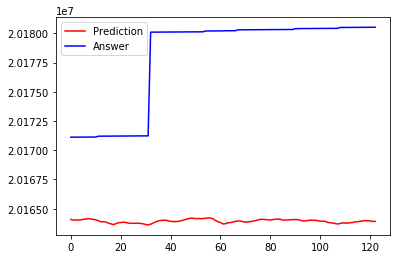

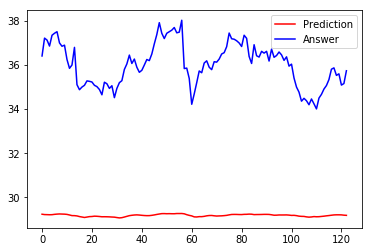

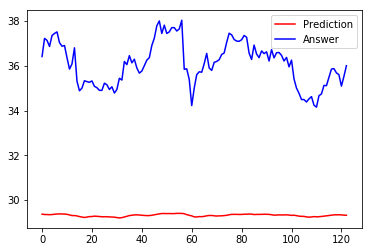

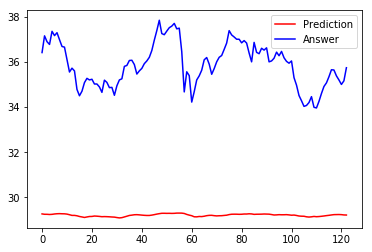

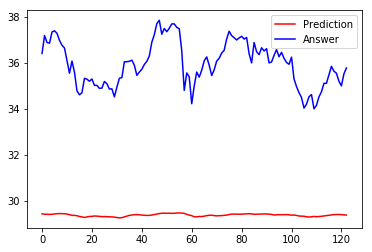

123/123 [==============================] - 0s 228us/step
[array([[ 20164080.],
       [ 20164026.],
       [ 20164034.],
       [ 20164032.],
       [ 20164042.],
       [ 20164090.],
       [ 20164118.],
       [ 20164152.],
       [ 20164124.],
       [ 20164084.],
       [ 20164048.],
       [ 20163978.],
       [ 20163878.],
       [ 20163886.],
       [ 20163864.],
       [ 20163766.],
       [ 20163708.],
       [ 20163640.],
       [ 20163712.],
       [ 20163800.],
       [ 20163812.],
       [ 20163846.],
       [ 20163824.],
       [ 20163778.],
       [ 20163742.],
       [ 20163754.],
       [ 20163754.],
       [ 20163754.],
       [ 20163738.],
       [ 20163706.],
       [ 20163648.],
       [ 20163612.],
       [ 20163670.],
       [ 20163768.],
       [ 20163872.],
       [ 20163946.],
       [ 20163994.],
       [ 20164004.],
       [ 20164016.],
       [ 20163958.],
       [ 20163918.],
       [ 20163900.],
       [ 20163896.],
       [ 20163916.],
       [ 20163956.

Train on 611 samples, validate on 263 samples
Epoch 1/50
611/611 [==============================] - 66s 108ms/step - loss: 0.0708 - acc: 0.1178 - val_loss: 0.1511 - val_acc: 0.0000e+00
Epoch 2/50
611/611 [==============================] - 3s 5ms/step - loss: 0.0473 - acc: 0.0573 - val_loss: 0.0500 - val_acc: 0.0000e+00
Epoch 3/50
611/611 [==============================] - 3s 5ms/step - loss: 0.0226 - acc: 0.0606 - val_loss: 0.0332 - val_acc: 0.0000e+00
Epoch 4/50
611/611 [==============================] - 3s 5ms/step - loss: 0.0216 - acc: 0.0786 - val_loss: 0.0504 - val_acc: 0.0000e+00
Epoch 5/50
611/611 [==============================] - 3s 5ms/step - loss: 0.0202 - acc: 0.3077 - val_loss: 0.0532 - val_acc: 0.0000e+00
Epoch 6/50
611/611 [==============================] - 3s 5ms/step - loss: 0.0204 - acc: 0.2815 - val_loss: 0.0516 - val_acc: 0.0000e+00
Epoch 7/50
611/611 [==============================] - 3s 5ms/step - loss: 0.0200 - acc: 0.2979 - val_loss: 0.0466 - val_acc: 0.0000e+00

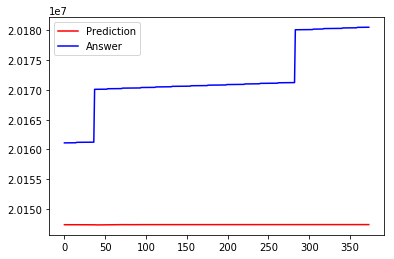

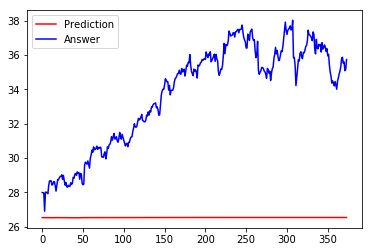

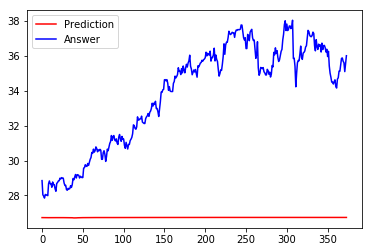

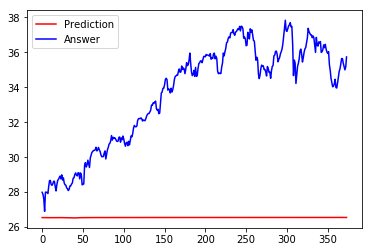

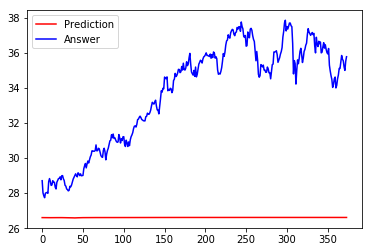

374/374 [==============================] - 1s 3ms/step
[array([[ 20147376.],
       [ 20147378.],
       [ 20147374.],
       [ 20147372.],
       [ 20147370.],
       [ 20147368.],
       [ 20147372.],
       [ 20147372.],
       [ 20147370.],
       [ 20147368.],
       [ 20147368.],
       [ 20147368.],
       [ 20147366.],
       [ 20147362.],
       [ 20147366.],
       [ 20147372.],
       [ 20147372.],
       [ 20147372.],
       [ 20147374.],
       [ 20147376.],
       [ 20147374.],
       [ 20147374.],
       [ 20147374.],
       [ 20147374.],
       [ 20147376.],
       [ 20147374.],
       [ 20147372.],
       [ 20147372.],
       [ 20147374.],
       [ 20147374.],
       [ 20147374.],
       [ 20147374.],
       [ 20147370.],
       [ 20147370.],
       [ 20147368.],
       [ 20147368.],
       [ 20147366.],
       [ 20147360.],
       [ 20147348.],
       [ 20147340.],
       [ 20147340.],
       [ 20147342.],
       [ 20147348.],
       [ 20147358.],
       [ 20147358.],

Train on 698 samples, validate on 300 samples
Epoch 1/50
698/698 [==============================] - 65s 93ms/step - loss: 0.0732 - acc: 0.0530 - val_loss: 0.2626 - val_acc: 0.0000e+00
Epoch 2/50
698/698 [==============================] - 0s 391us/step - loss: 0.0643 - acc: 0.0473 - val_loss: 0.2312 - val_acc: 0.0000e+00
Epoch 3/50
698/698 [==============================] - 0s 417us/step - loss: 0.0478 - acc: 0.0473 - val_loss: 0.1630 - val_acc: 0.0000e+00
Epoch 4/50
698/698 [==============================] - 0s 387us/step - loss: 0.0253 - acc: 0.0473 - val_loss: 0.0750 - val_acc: 0.0000e+00
Epoch 5/50
698/698 [==============================] - 0s 437us/step - loss: 0.0230 - acc: 0.0530 - val_loss: 0.0699 - val_acc: 0.0000e+00
Epoch 6/50
698/698 [==============================] - 0s 413us/step - loss: 0.0202 - acc: 0.2163 - val_loss: 0.0969 - val_acc: 0.0000e+00
Epoch 7/50
698/698 [==============================] - 0s 500us/step - loss: 0.0196 - acc: 0.2593 - val_loss: 0.1032 - val_acc:

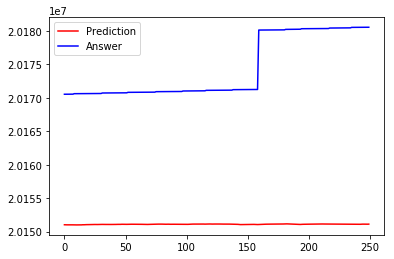

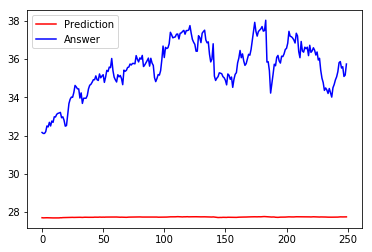

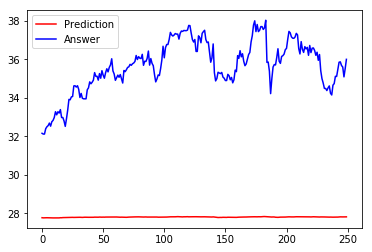

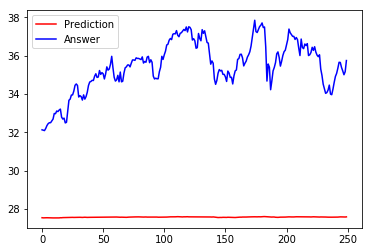

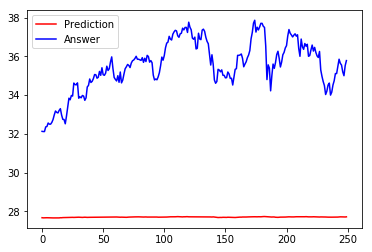

250/250 [==============================] - 0s 192us/step
[array([[ 20151030.],
       [ 20151016.],
       [ 20151018.],
       [ 20151020.],
       [ 20151026.],
       [ 20151024.],
       [ 20151028.],
       [ 20151016.],
       [ 20151008.],
       [ 20151006.],
       [ 20151006.],
       [ 20151012.],
       [ 20151016.],
       [ 20151012.],
       [ 20151012.],
       [ 20151030.],
       [ 20151028.],
       [ 20151044.],
       [ 20151046.],
       [ 20151044.],
       [ 20151052.],
       [ 20151058.],
       [ 20151064.],
       [ 20151070.],
       [ 20151070.],
       [ 20151070.],
       [ 20151064.],
       [ 20151066.],
       [ 20151072.],
       [ 20151076.],
       [ 20151084.],
       [ 20151082.],
       [ 20151076.],
       [ 20151070.],
       [ 20151076.],
       [ 20151084.],
       [ 20151076.],
       [ 20151068.],
       [ 20151072.],
       [ 20151072.],
       [ 20151076.],
       [ 20151076.],
       [ 20151080.],
       [ 20151092.],
       [ 20151090.

Train on 693 samples, validate on 174 samples
Epoch 1/50
693/693 [==============================] - 69s 99ms/step - loss: 0.0673 - acc: 0.0823 - val_loss: 0.1006 - val_acc: 0.0000e+00
Epoch 2/50
693/693 [==============================] - 6s 9ms/step - loss: 0.0236 - acc: 0.1631 - val_loss: 0.0382 - val_acc: 0.0000e+00
Epoch 3/50
693/693 [==============================] - 6s 9ms/step - loss: 0.0213 - acc: 0.2597 - val_loss: 0.0655 - val_acc: 0.0000e+00
Epoch 4/50
693/693 [==============================] - 6s 9ms/step - loss: 0.0204 - acc: 0.1703 - val_loss: 0.0663 - val_acc: 0.0000e+00
Epoch 5/50
693/693 [==============================] - 7s 9ms/step - loss: 0.0197 - acc: 0.0967 - val_loss: 0.0538 - val_acc: 0.0000e+00
Epoch 6/50
693/693 [==============================] - 6s 9ms/step - loss: 0.0195 - acc: 0.1573 - val_loss: 0.0517 - val_acc: 1.0000
Epoch 7/50
693/693 [==============================] - 7s 9ms/step - loss: 0.0194 - acc: 0.2958 - val_loss: 0.0578 - val_acc: 0.0000e+00
Epoc

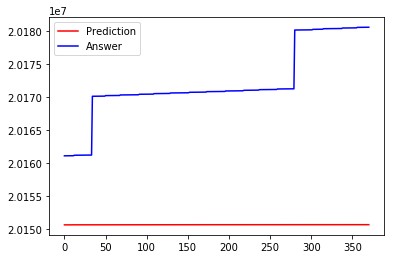

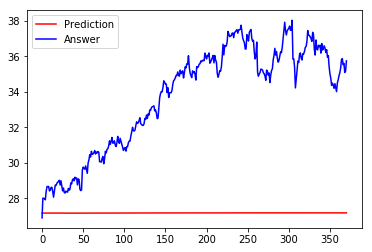

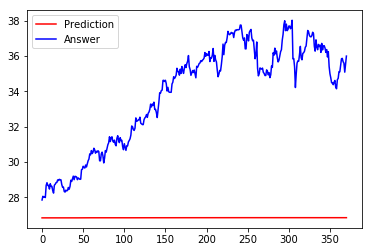

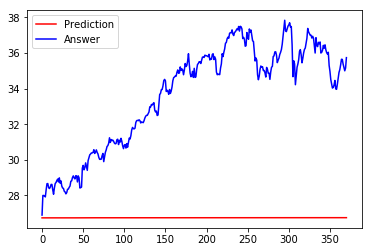

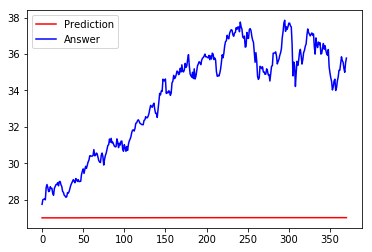

371/371 [==============================] - 2s 6ms/step
[array([[ 20150694.],
       [ 20150692.],
       [ 20150690.],
       [ 20150690.],
       [ 20150692.],
       [ 20150694.],
       [ 20150694.],
       [ 20150694.],
       [ 20150698.],
       [ 20150696.],
       [ 20150696.],
       [ 20150696.],
       [ 20150698.],
       [ 20150698.],
       [ 20150698.],
       [ 20150698.],
       [ 20150696.],
       [ 20150698.],
       [ 20150700.],
       [ 20150700.],
       [ 20150700.],
       [ 20150698.],
       [ 20150698.],
       [ 20150700.],
       [ 20150698.],
       [ 20150698.],
       [ 20150696.],
       [ 20150694.],
       [ 20150694.],
       [ 20150690.],
       [ 20150688.],
       [ 20150686.],
       [ 20150686.],
       [ 20150686.],
       [ 20150684.],
       [ 20150686.],
       [ 20150686.],
       [ 20150690.],
       [ 20150692.],
       [ 20150692.],
       [ 20150694.],
       [ 20150694.],
       [ 20150694.],
       [ 20150694.],
       [ 20150696.],

Train on 883 samples, validate on 99 samples
Epoch 1/50
883/883 [==============================] - 82s 93ms/step - loss: 0.1093 - acc: 0.1189 - val_loss: 0.3954 - val_acc: 0.0000e+00
Epoch 2/50
883/883 [==============================] - 14s 16ms/step - loss: 0.0998 - acc: 0.1121 - val_loss: 0.3506 - val_acc: 0.0000e+00
Epoch 3/50
883/883 [==============================] - 15s 17ms/step - loss: 0.0791 - acc: 0.0634 - val_loss: 0.2817 - val_acc: 0.0000e+00
Epoch 4/50
883/883 [==============================] - 15s 17ms/step - loss: 0.0583 - acc: 0.0566 - val_loss: 0.2038 - val_acc: 0.0000e+00
Epoch 5/50
883/883 [==============================] - 14s 16ms/step - loss: 0.0442 - acc: 0.0940 - val_loss: 0.1404 - val_acc: 0.0000e+00
Epoch 6/50
883/883 [==============================] - 15s 16ms/step - loss: 0.0353 - acc: 0.3556 - val_loss: 0.1179 - val_acc: 1.0000
Epoch 7/50
883/883 [==============================] - 14s 16ms/step - loss: 0.0281 - acc: 0.4881 - val_loss: 0.1244 - val_acc: 1.00

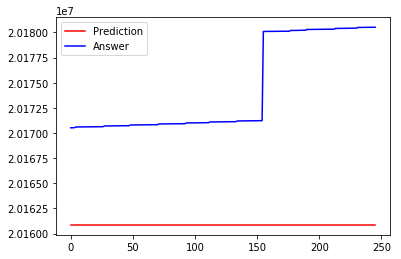

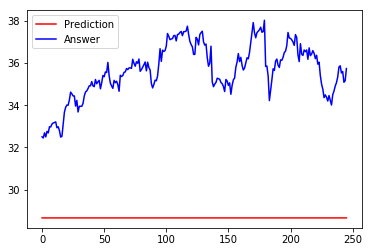

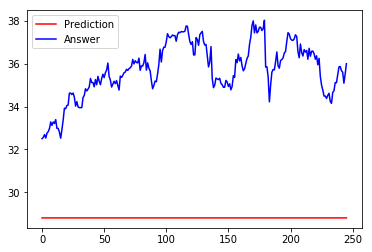

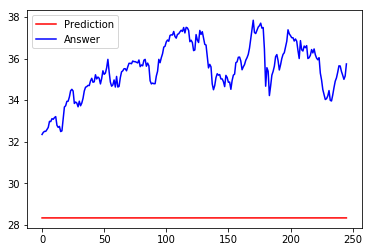

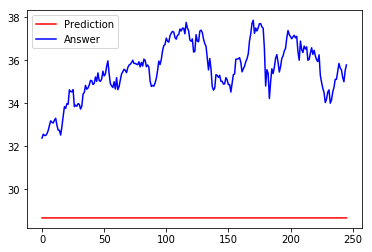

246/246 [==============================] - 1s 5ms/step
[array([[ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],
       [ 20160862.],

Train on 898 samples, validate on 225 samples
Epoch 1/51
898/898 [==============================] - 67s 75ms/step - loss: 0.1061 - acc: 0.2884 - val_loss: 0.5606 - val_acc: 0.1644
Epoch 2/51
898/898 [==============================] - 2s 2ms/step - loss: 0.1018 - acc: 0.2383 - val_loss: 0.5418 - val_acc: 0.1644
Epoch 3/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0942 - acc: 0.2428 - val_loss: 0.5089 - val_acc: 0.1644
Epoch 4/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0811 - acc: 0.2416 - val_loss: 0.4570 - val_acc: 0.1644
Epoch 5/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0636 - acc: 0.2416 - val_loss: 0.3876 - val_acc: 0.1644
Epoch 6/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0444 - acc: 0.2416 - val_loss: 0.3039 - val_acc: 0.1644
Epoch 7/51
898/898 [==============================] - 2s 2ms/step - loss: 0.0315 - acc: 0.2416 - val_loss: 0.2163 - val_acc: 0.1644
Epoch 8/51
898/898 [========

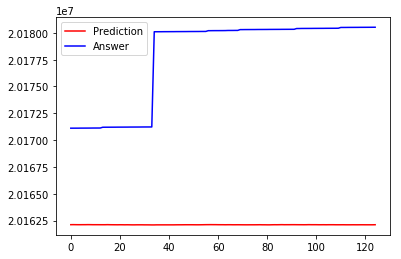

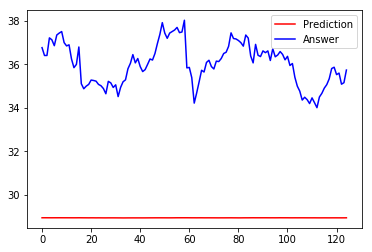

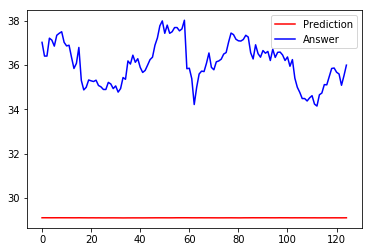

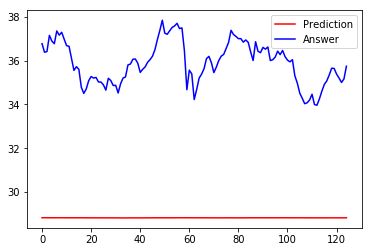

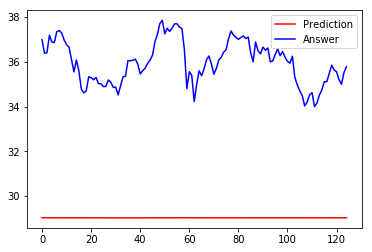

125/125 [==============================] - 0s 288us/step
[array([[ 20162120.],
       [ 20162124.],
       [ 20162120.],
       [ 20162118.],
       [ 20162118.],
       [ 20162120.],
       [ 20162120.],
       [ 20162124.],
       [ 20162122.],
       [ 20162118.],
       [ 20162118.],
       [ 20162118.],
       [ 20162116.],
       [ 20162116.],
       [ 20162116.],
       [ 20162122.],
       [ 20162116.],
       [ 20162114.],
       [ 20162112.],
       [ 20162110.],
       [ 20162114.],
       [ 20162112.],
       [ 20162108.],
       [ 20162112.],
       [ 20162108.],
       [ 20162104.],
       [ 20162104.],
       [ 20162108.],
       [ 20162108.],
       [ 20162108.],
       [ 20162104.],
       [ 20162104.],
       [ 20162102.],
       [ 20162098.],
       [ 20162098.],
       [ 20162104.],
       [ 20162104.],
       [ 20162104.],
       [ 20162104.],
       [ 20162104.],
       [ 20162104.],
       [ 20162104.],
       [ 20162104.],
       [ 20162108.],
       [ 20162110.

Train on 1002 samples, validate on 112 samples
Epoch 1/50
1002/1002 [==============================] - 63s 63ms/step - loss: 0.1392 - acc: 0.0389 - val_loss: 0.6904 - val_acc: 0.2143
Epoch 2/50
1002/1002 [==============================] - 1s 1ms/step - loss: 0.1224 - acc: 0.0379 - val_loss: 0.6106 - val_acc: 0.2143
Epoch 3/50
1002/1002 [==============================] - 1s 1ms/step - loss: 0.0907 - acc: 0.0369 - val_loss: 0.4742 - val_acc: 0.2143
Epoch 4/50
1002/1002 [==============================] - 1s 1ms/step - loss: 0.0545 - acc: 0.0369 - val_loss: 0.2912 - val_acc: 0.2143
Epoch 5/50
1002/1002 [==============================] - 1s 1ms/step - loss: 0.0401 - acc: 0.0369 - val_loss: 0.2190 - val_acc: 0.2143
Epoch 6/50
1002/1002 [==============================] - 1s 1ms/step - loss: 0.0360 - acc: 0.2944 - val_loss: 0.2751 - val_acc: 0.1607
Epoch 7/50
1002/1002 [==============================] - 1s 1ms/step - loss: 0.0335 - acc: 0.5689 - val_loss: 0.2994 - val_acc: 0.1607
Epoch 8/50
10

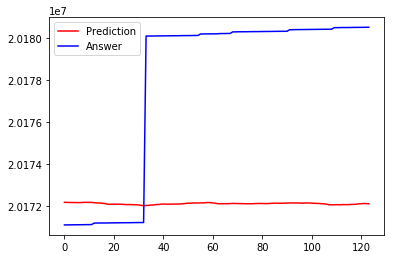

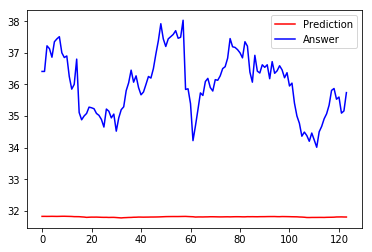

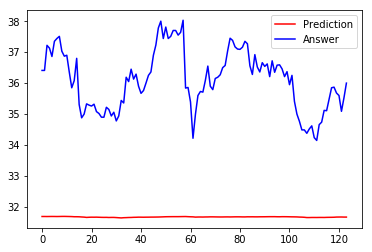

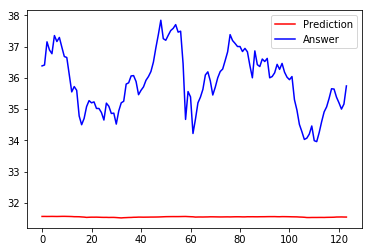

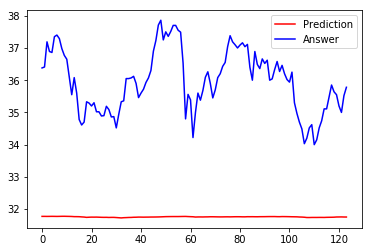

124/124 [==============================] - 0s 274us/step
[array([[ 20172188.],
       [ 20172188.],
       [ 20172184.],
       [ 20172180.],
       [ 20172182.],
       [ 20172178.],
       [ 20172176.],
       [ 20172182.],
       [ 20172188.],
       [ 20172188.],
       [ 20172188.],
       [ 20172184.],
       [ 20172174.],
       [ 20172162.],
       [ 20172158.],
       [ 20172152.],
       [ 20172134.],
       [ 20172118.],
       [ 20172092.],
       [ 20172100.],
       [ 20172102.],
       [ 20172100.],
       [ 20172104.],
       [ 20172100.],
       [ 20172090.],
       [ 20172082.],
       [ 20172084.],
       [ 20172078.],
       [ 20172078.],
       [ 20172076.],
       [ 20172064.],
       [ 20172048.],
       [ 20172028.],
       [ 20172040.],
       [ 20172046.],
       [ 20172058.],
       [ 20172066.],
       [ 20172084.],
       [ 20172086.],
       [ 20172102.],
       [ 20172108.],
       [ 20172104.],
       [ 20172104.],
       [ 20172104.],
       [ 20172106.

Train on 693 samples, validate on 174 samples
Epoch 1/50
693/693 [==============================] - 79s 114ms/step - loss: 0.0486 - acc: 0.0794 - val_loss: 0.0503 - val_acc: 0.0000e+00
Epoch 2/50
693/693 [==============================] - 11s 15ms/step - loss: 0.0218 - acc: 0.2165 - val_loss: 0.0718 - val_acc: 0.0000e+00
Epoch 3/50
693/693 [==============================] - 11s 15ms/step - loss: 0.0195 - acc: 0.3001 - val_loss: 0.0441 - val_acc: 0.0000e+00
Epoch 4/50
693/693 [==============================] - 11s 16ms/step - loss: 0.0114 - acc: 0.2597 - val_loss: 0.0215 - val_acc: 0.0000e+00
Epoch 5/50
693/693 [==============================] - 11s 16ms/step - loss: 0.0057 - acc: 0.3102 - val_loss: 0.0183 - val_acc: 0.4713
Epoch 6/50
693/693 [==============================] - 11s 15ms/step - loss: 0.0046 - acc: 0.2929 - val_loss: 0.0186 - val_acc: 0.4713
Epoch 7/50
693/693 [==============================] - 11s 15ms/step - loss: 0.0040 - acc: 0.2814 - val_loss: 0.0157 - val_acc: 0.5345

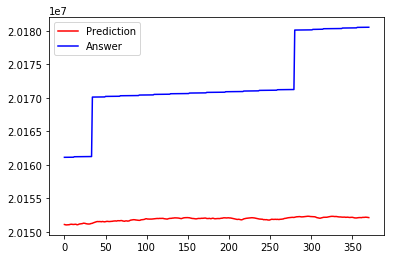

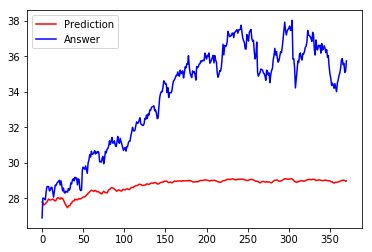

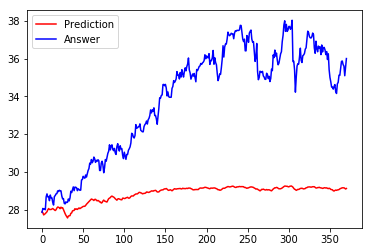

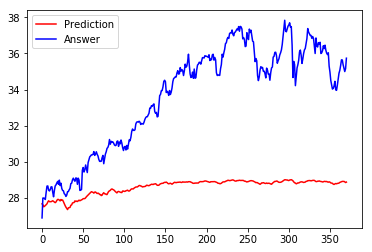

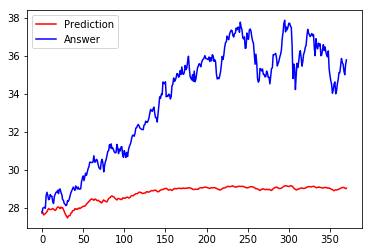

371/371 [==============================] - 2s 4ms/step
[array([[ 20151090.],
       [ 20151058.],
       [ 20151028.],
       [ 20151044.],
       [ 20151044.],
       [ 20151058.],
       [ 20151062.],
       [ 20151112.],
       [ 20151128.],
       [ 20151130.],
       [ 20151102.],
       [ 20151096.],
       [ 20151116.],
       [ 20151122.],
       [ 20151128.],
       [ 20151064.],
       [ 20151056.],
       [ 20151096.],
       [ 20151156.],
       [ 20151176.],
       [ 20151210.],
       [ 20151232.],
       [ 20151228.],
       [ 20151284.],
       [ 20151282.],
       [ 20151266.],
       [ 20151218.],
       [ 20151192.],
       [ 20151174.],
       [ 20151162.],
       [ 20151172.],
       [ 20151170.],
       [ 20151224.],
       [ 20151240.],
       [ 20151272.],
       [ 20151336.],
       [ 20151380.],
       [ 20151416.],
       [ 20151454.],
       [ 20151506.],
       [ 20151532.],
       [ 20151526.],
       [ 20151520.],
       [ 20151534.],
       [ 20151518.],

Train on 891 samples, validate on 99 samples
Epoch 1/51
891/891 [==============================] - 77s 86ms/step - loss: 0.0882 - acc: 0.1190 - val_loss: 0.1911 - val_acc: 0.0000e+00
Epoch 2/51
891/891 [==============================] - 10s 11ms/step - loss: 0.0352 - acc: 0.2570 - val_loss: 0.1116 - val_acc: 1.0000
Epoch 3/51
891/891 [==============================] - 10s 11ms/step - loss: 0.0268 - acc: 0.3356 - val_loss: 0.1186 - val_acc: 0.0000e+00
Epoch 4/51
891/891 [==============================] - 10s 11ms/step - loss: 0.0232 - acc: 0.1886 - val_loss: 0.0806 - val_acc: 0.0000e+00
Epoch 5/51
891/891 [==============================] - 10s 11ms/step - loss: 0.0108 - acc: 0.4523 - val_loss: 0.0425 - val_acc: 1.0000
Epoch 6/51
891/891 [==============================] - 10s 11ms/step - loss: 0.0077 - acc: 0.5062 - val_loss: 0.0345 - val_acc: 1.0000
Epoch 7/51
891/891 [==============================] - 10s 11ms/step - loss: 0.0057 - acc: 0.5511 - val_loss: 0.0158 - val_acc: 1.0000
Epoch

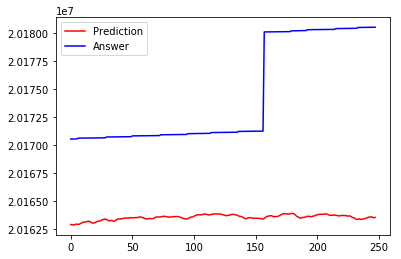

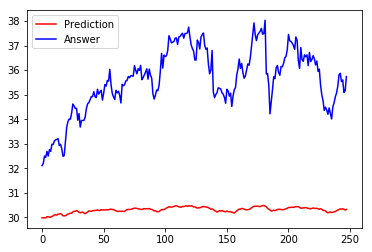

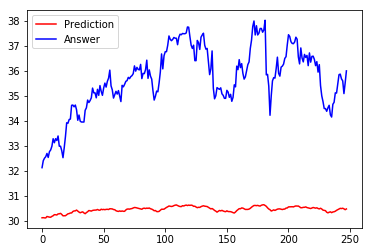

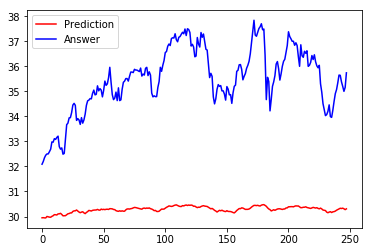

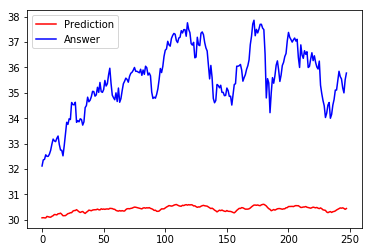

248/248 [==============================] - 1s 3ms/step
[array([[ 20162868.],
       [ 20162860.],
       [ 20162838.],
       [ 20162840.],
       [ 20162906.],
       [ 20162900.],
       [ 20162890.],
       [ 20162904.],
       [ 20162974.],
       [ 20163018.],
       [ 20163080.],
       [ 20163102.],
       [ 20163098.],
       [ 20163142.],
       [ 20163158.],
       [ 20163158.],
       [ 20163106.],
       [ 20163026.],
       [ 20163004.],
       [ 20163010.],
       [ 20163066.],
       [ 20163124.],
       [ 20163156.],
       [ 20163188.],
       [ 20163200.],
       [ 20163268.],
       [ 20163322.],
       [ 20163332.],
       [ 20163368.],
       [ 20163318.],
       [ 20163246.],
       [ 20163206.],
       [ 20163222.],
       [ 20163248.],
       [ 20163200.],
       [ 20163156.],
       [ 20163222.],
       [ 20163286.],
       [ 20163366.],
       [ 20163368.],
       [ 20163354.],
       [ 20163384.],
       [ 20163414.],
       [ 20163434.],
       [ 20163442.],

Train on 898 samples, validate on 225 samples
Epoch 1/50
898/898 [==============================] - 64s 71ms/step - loss: 0.1056 - acc: 0.4633 - val_loss: 0.5551 - val_acc: 0.5867
Epoch 2/50
898/898 [==============================] - 1s 950us/step - loss: 0.0977 - acc: 0.5078 - val_loss: 0.5148 - val_acc: 0.5867
Epoch 3/50
898/898 [==============================] - 1s 968us/step - loss: 0.0793 - acc: 0.5078 - val_loss: 0.4285 - val_acc: 0.5867
Epoch 4/50
898/898 [==============================] - 1s 998us/step - loss: 0.0501 - acc: 0.5078 - val_loss: 0.3036 - val_acc: 0.5867
Epoch 5/50
898/898 [==============================] - 1s 1ms/step - loss: 0.0309 - acc: 0.5078 - val_loss: 0.1823 - val_acc: 0.5867
Epoch 6/50
898/898 [==============================] - 1s 1ms/step - loss: 0.0316 - acc: 0.5078 - val_loss: 0.1885 - val_acc: 0.5867
Epoch 7/50
898/898 [==============================] - 1s 971us/step - loss: 0.0271 - acc: 0.5078 - val_loss: 0.2426 - val_acc: 0.5867
Epoch 8/50
898/898 [

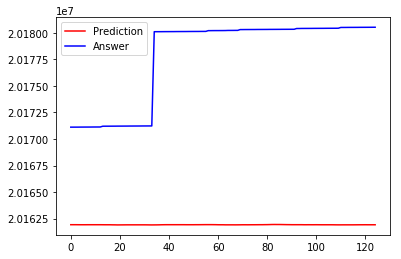

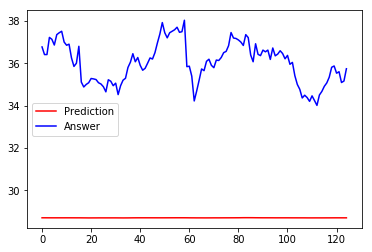

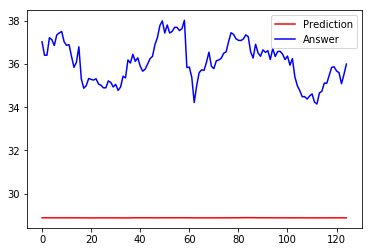

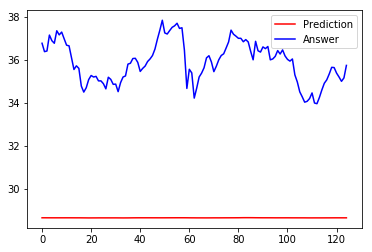

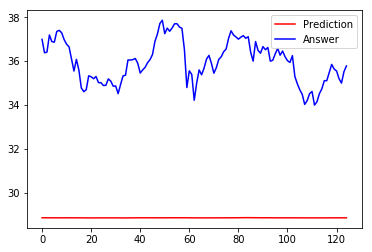

125/125 [==============================] - 0s 280us/step
[array([[ 20161928.],
       [ 20161928.],
       [ 20161928.],
       [ 20161926.],
       [ 20161924.],
       [ 20161924.],
       [ 20161924.],
       [ 20161926.],
       [ 20161926.],
       [ 20161926.],
       [ 20161926.],
       [ 20161926.],
       [ 20161926.],
       [ 20161924.],
       [ 20161922.],
       [ 20161922.],
       [ 20161922.],
       [ 20161916.],
       [ 20161914.],
       [ 20161908.],
       [ 20161910.],
       [ 20161912.],
       [ 20161914.],
       [ 20161916.],
       [ 20161916.],
       [ 20161916.],
       [ 20161916.],
       [ 20161916.],
       [ 20161916.],
       [ 20161916.],
       [ 20161916.],
       [ 20161914.],
       [ 20161910.],
       [ 20161908.],
       [ 20161910.],
       [ 20161912.],
       [ 20161916.],
       [ 20161922.],
       [ 20161926.],
       [ 20161928.],
       [ 20161928.],
       [ 20161928.],
       [ 20161928.],
       [ 20161928.],
       [ 20161928.

Train on 779 samples, validate on 335 samples
Epoch 1/50
779/779 [==============================] - 71s 91ms/step - loss: 0.0786 - acc: 0.1759 - val_loss: 0.4059 - val_acc: 0.7194
Epoch 2/50
779/779 [==============================] - 1s 1ms/step - loss: 0.0440 - acc: 0.4146 - val_loss: 0.2425 - val_acc: 0.7194
Epoch 3/50
779/779 [==============================] - 1s 1ms/step - loss: 0.0239 - acc: 0.4454 - val_loss: 0.1483 - val_acc: 0.7194
Epoch 4/50
779/779 [==============================] - 1s 2ms/step - loss: 0.0217 - acc: 0.4236 - val_loss: 0.2146 - val_acc: 0.7194
Epoch 5/50
779/779 [==============================] - 1s 1ms/step - loss: 0.0215 - acc: 0.3132 - val_loss: 0.2178 - val_acc: 0.7194
Epoch 6/50
779/779 [==============================] - 1s 1ms/step - loss: 0.0204 - acc: 0.4044 - val_loss: 0.1845 - val_acc: 0.7194
Epoch 7/50
779/779 [==============================] - 1s 1ms/step - loss: 0.0202 - acc: 0.4403 - val_loss: 0.1883 - val_acc: 0.7194
Epoch 8/50
779/779 [========

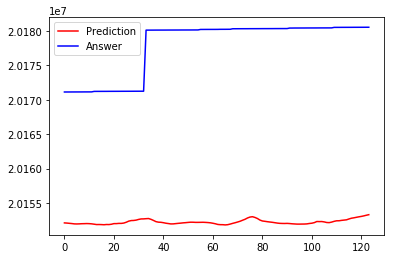

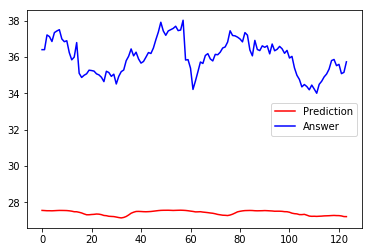

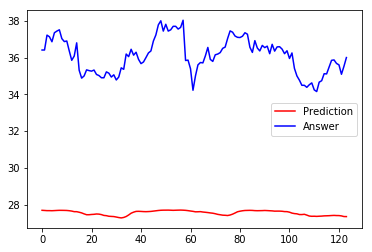

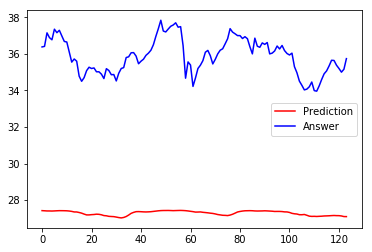

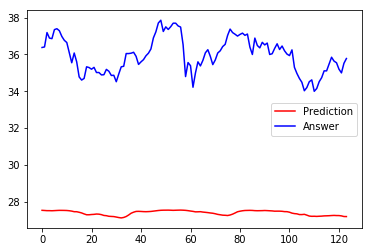

124/124 [==============================] - 0s 468us/step
[array([[ 20152096.],
       [ 20152072.],
       [ 20152036.],
       [ 20152000.],
       [ 20151954.],
       [ 20151944.],
       [ 20151956.],
       [ 20151978.],
       [ 20151986.],
       [ 20152000.],
       [ 20151988.],
       [ 20151960.],
       [ 20151910.],
       [ 20151856.],
       [ 20151862.],
       [ 20151850.],
       [ 20151830.],
       [ 20151864.],
       [ 20151856.],
       [ 20151902.],
       [ 20151992.],
       [ 20151994.],
       [ 20152026.],
       [ 20152026.],
       [ 20152074.],
       [ 20152194.],
       [ 20152354.],
       [ 20152436.],
       [ 20152452.],
       [ 20152504.],
       [ 20152604.],
       [ 20152672.],
       [ 20152680.],
       [ 20152710.],
       [ 20152732.],
       [ 20152614.],
       [ 20152454.],
       [ 20152280.],
       [ 20152204.],
       [ 20152184.],
       [ 20152126.],
       [ 20152052.],
       [ 20152002.],
       [ 20151948.],
       [ 20151954.

Train on 606 samples, validate on 261 samples
Epoch 1/50
606/606 [==============================] - 83s 137ms/step - loss: 0.0721 - acc: 0.1337 - val_loss: 0.1460 - val_acc: 0.0000e+00
Epoch 2/50
606/606 [==============================] - 13s 21ms/step - loss: 0.0467 - acc: 0.0545 - val_loss: 0.0680 - val_acc: 0.0000e+00
Epoch 3/50
606/606 [==============================] - 13s 22ms/step - loss: 0.0264 - acc: 0.0545 - val_loss: 0.0437 - val_acc: 0.0000e+00
Epoch 4/50
606/606 [==============================] - 13s 22ms/step - loss: 0.0209 - acc: 0.0545 - val_loss: 0.0594 - val_acc: 0.0000e+00
Epoch 5/50
606/606 [==============================] - 13s 22ms/step - loss: 0.0213 - acc: 0.2294 - val_loss: 0.0652 - val_acc: 0.0000e+00
Epoch 6/50
606/606 [==============================] - 13s 21ms/step - loss: 0.0216 - acc: 0.1997 - val_loss: 0.0536 - val_acc: 0.0000e+00
Epoch 7/50
606/606 [==============================] - 13s 22ms/step - loss: 0.0202 - acc: 0.1947 - val_loss: 0.0443 - val_acc

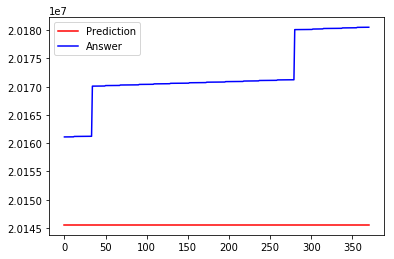

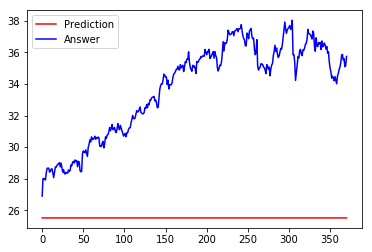

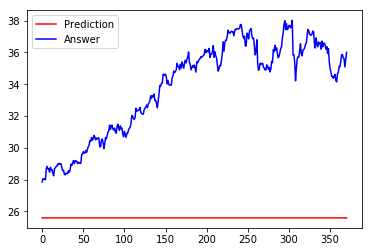

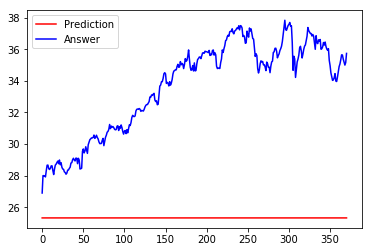

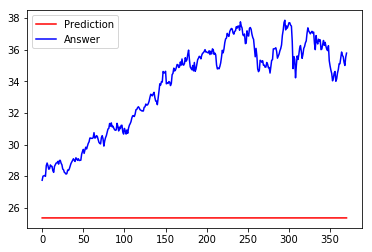

371/371 [==============================] - 2s 5ms/step
[array([[ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],
       [ 20145548.],

Train on 698 samples, validate on 300 samples
Epoch 1/50
698/698 [==============================] - 69s 99ms/step - loss: 0.0736 - acc: 0.1447 - val_loss: 0.2653 - val_acc: 0.0000e+00
Epoch 2/50
698/698 [==============================] - 0s 479us/step - loss: 0.0661 - acc: 0.0702 - val_loss: 0.2353 - val_acc: 0.0000e+00
Epoch 3/50
698/698 [==============================] - 0s 526us/step - loss: 0.0488 - acc: 0.0745 - val_loss: 0.1671 - val_acc: 0.0000e+00
Epoch 4/50
698/698 [==============================] - 0s 519us/step - loss: 0.0265 - acc: 0.1160 - val_loss: 0.0772 - val_acc: 0.0000e+00
Epoch 5/50
698/698 [==============================] - 0s 504us/step - loss: 0.0234 - acc: 0.1289 - val_loss: 0.0739 - val_acc: 0.0000e+00
Epoch 6/50
698/698 [==============================] - 0s 539us/step - loss: 0.0211 - acc: 0.1848 - val_loss: 0.1009 - val_acc: 0.0000e+00
Epoch 7/50
698/698 [==============================] - 0s 520us/step - loss: 0.0213 - acc: 0.1705 - val_loss: 0.1023 - val_acc:

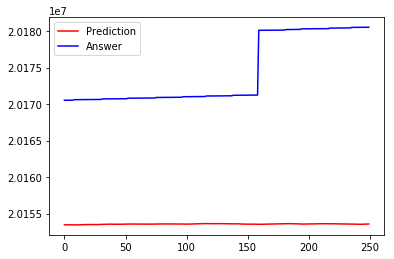

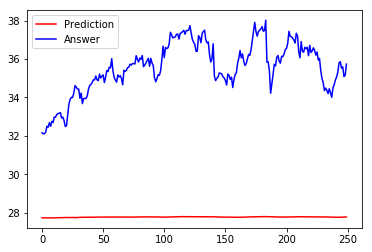

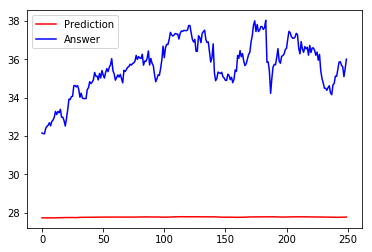

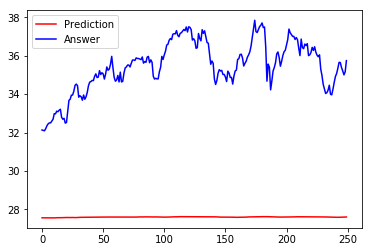

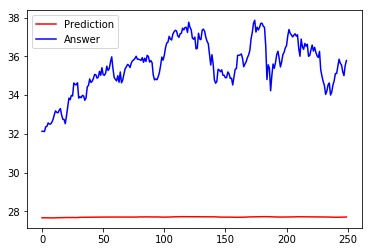

250/250 [==============================] - 0s 204us/step
[array([[ 20153458.],
       [ 20153456.],
       [ 20153454.],
       [ 20153446.],
       [ 20153456.],
       [ 20153466.],
       [ 20153462.],
       [ 20153452.],
       [ 20153442.],
       [ 20153448.],
       [ 20153444.],
       [ 20153462.],
       [ 20153468.],
       [ 20153474.],
       [ 20153482.],
       [ 20153488.],
       [ 20153476.],
       [ 20153478.],
       [ 20153484.],
       [ 20153492.],
       [ 20153500.],
       [ 20153498.],
       [ 20153488.],
       [ 20153494.],
       [ 20153504.],
       [ 20153500.],
       [ 20153500.],
       [ 20153482.],
       [ 20153486.],
       [ 20153504.],
       [ 20153510.],
       [ 20153524.],
       [ 20153526.],
       [ 20153526.],
       [ 20153534.],
       [ 20153534.],
       [ 20153546.],
       [ 20153546.],
       [ 20153540.],
       [ 20153540.],
       [ 20153526.],
       [ 20153522.],
       [ 20153530.],
       [ 20153542.],
       [ 20153542.

Train on 602 samples, validate on 258 samples
Epoch 1/51
602/602 [==============================] - 80s 134ms/step - loss: 0.0711 - acc: 0.1993 - val_loss: 0.1189 - val_acc: 0.0000e+00
Epoch 2/51
602/602 [==============================] - 11s 18ms/step - loss: 0.0364 - acc: 0.1013 - val_loss: 0.0474 - val_acc: 0.0000e+00
Epoch 3/51
602/602 [==============================] - 11s 18ms/step - loss: 0.0227 - acc: 0.1096 - val_loss: 0.0318 - val_acc: 0.0000e+00
Epoch 4/51
602/602 [==============================] - 11s 18ms/step - loss: 0.0234 - acc: 0.1611 - val_loss: 0.0500 - val_acc: 0.0000e+00
Epoch 5/51
602/602 [==============================] - 11s 18ms/step - loss: 0.0212 - acc: 0.1429 - val_loss: 0.0618 - val_acc: 0.0000e+00
Epoch 6/51
602/602 [==============================] - 11s 18ms/step - loss: 0.0211 - acc: 0.1761 - val_loss: 0.0537 - val_acc: 0.0000e+00
Epoch 7/51
602/602 [==============================] - 11s 18ms/step - loss: 0.0195 - acc: 0.1761 - val_loss: 0.0491 - val_acc

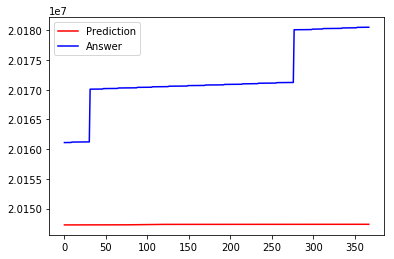

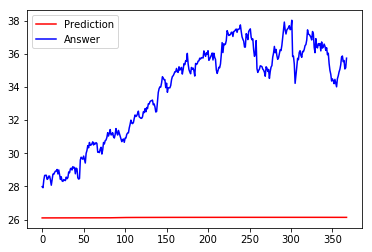

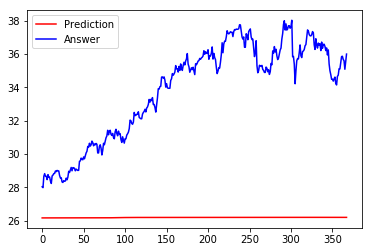

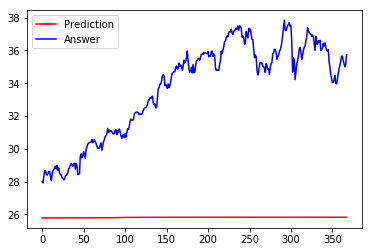

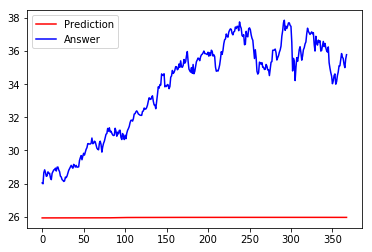

368/368 [==============================] - 3s 8ms/step
[array([[ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147262.],
       [ 20147264.],
       [ 20147264.],
       [ 20147264.],
       [ 20147264.],
       [ 20147266.],
       [ 20147266.],
       [ 20147266.],
       [ 20147266.],

Train on 891 samples, validate on 223 samples
Epoch 1/50
891/891 [==============================] - 71s 80ms/step - loss: 0.1066 - acc: 0.1661 - val_loss: 0.5550 - val_acc: 0.0852
Epoch 2/50
891/891 [==============================] - 2s 2ms/step - loss: 0.0970 - acc: 0.1706 - val_loss: 0.5090 - val_acc: 0.0852
Epoch 3/50
891/891 [==============================] - 2s 2ms/step - loss: 0.0776 - acc: 0.1717 - val_loss: 0.4251 - val_acc: 0.0852
Epoch 4/50
891/891 [==============================] - 2s 2ms/step - loss: 0.0523 - acc: 0.1717 - val_loss: 0.3055 - val_acc: 0.0852
Epoch 5/50
891/891 [==============================] - 2s 2ms/step - loss: 0.0364 - acc: 0.1717 - val_loss: 0.2056 - val_acc: 0.0852
Epoch 6/50
891/891 [==============================] - 2s 2ms/step - loss: 0.0327 - acc: 0.1728 - val_loss: 0.2050 - val_acc: 0.0852
Epoch 7/50
891/891 [==============================] - 2s 2ms/step - loss: 0.0268 - acc: 0.3356 - val_loss: 0.2405 - val_acc: 0.5785
Epoch 8/50
891/891 [========

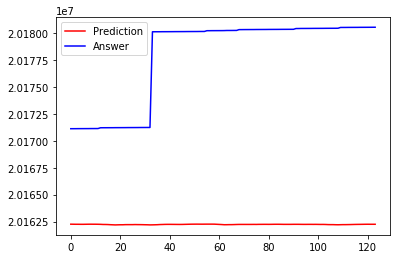

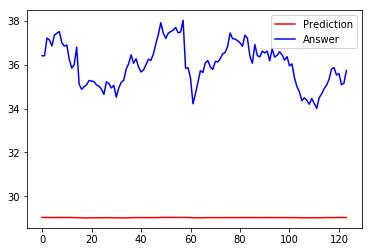

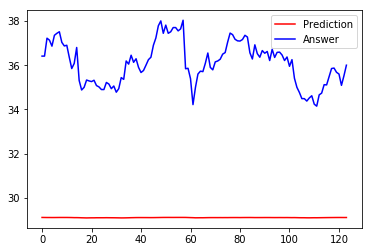

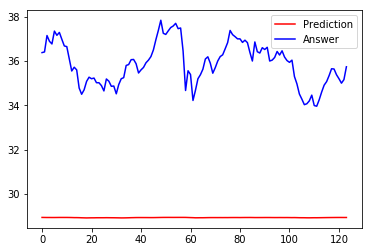

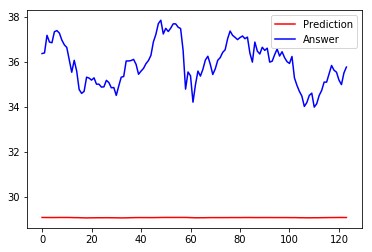

124/124 [==============================] - 0s 468us/step
[array([[ 20162262.],
       [ 20162258.],
       [ 20162254.],
       [ 20162254.],
       [ 20162250.],
       [ 20162250.],
       [ 20162254.],
       [ 20162258.],
       [ 20162260.],
       [ 20162258.],
       [ 20162258.],
       [ 20162254.],
       [ 20162248.],
       [ 20162236.],
       [ 20162234.],
       [ 20162228.],
       [ 20162214.],
       [ 20162204.],
       [ 20162194.],
       [ 20162202.],
       [ 20162208.],
       [ 20162208.],
       [ 20162218.],
       [ 20162220.],
       [ 20162220.],
       [ 20162220.],
       [ 20162226.],
       [ 20162222.],
       [ 20162220.],
       [ 20162216.],
       [ 20162210.],
       [ 20162206.],
       [ 20162196.],
       [ 20162200.],
       [ 20162206.],
       [ 20162214.],
       [ 20162228.],
       [ 20162234.],
       [ 20162242.],
       [ 20162246.],
       [ 20162246.],
       [ 20162244.],
       [ 20162242.],
       [ 20162240.],
       [ 20162238.

Train on 884 samples, validate on 221 samples
Epoch 1/50
884/884 [==============================] - 73s 83ms/step - loss: 0.1090 - acc: 0.0701 - val_loss: 0.5652 - val_acc: 0.0588
Epoch 2/50
884/884 [==============================] - 3s 3ms/step - loss: 0.1006 - acc: 0.0441 - val_loss: 0.5220 - val_acc: 0.0588
Epoch 3/50
884/884 [==============================] - 3s 3ms/step - loss: 0.0809 - acc: 0.0385 - val_loss: 0.4423 - val_acc: 0.0588
Epoch 4/50
884/884 [==============================] - 3s 3ms/step - loss: 0.0538 - acc: 0.0373 - val_loss: 0.3270 - val_acc: 0.0588
Epoch 5/50
884/884 [==============================] - 3s 3ms/step - loss: 0.0320 - acc: 0.0373 - val_loss: 0.1984 - val_acc: 0.0588
Epoch 6/50
884/884 [==============================] - 3s 3ms/step - loss: 0.0305 - acc: 0.0520 - val_loss: 0.1785 - val_acc: 0.5701
Epoch 7/50
884/884 [==============================] - 3s 3ms/step - loss: 0.0276 - acc: 0.4921 - val_loss: 0.2300 - val_acc: 0.5701
Epoch 8/50
884/884 [========

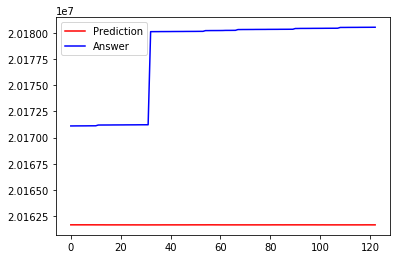

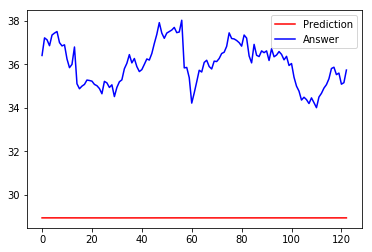

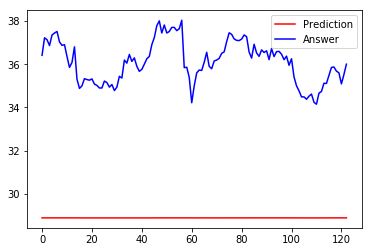

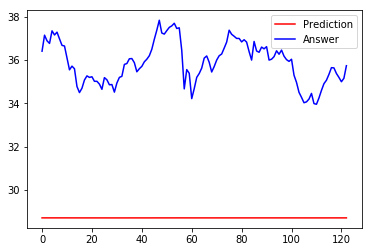

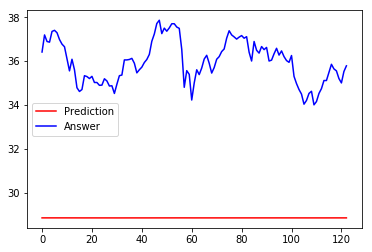

123/123 [==============================] - 0s 512us/step
[array([[ 20161692.],
       [ 20161692.],
       [ 20161692.],
       [ 20161692.],
       [ 20161692.],
       [ 20161692.],
       [ 20161692.],
       [ 20161692.],
       [ 20161692.],
       [ 20161692.],
       [ 20161690.],
       [ 20161690.],
       [ 20161690.],
       [ 20161690.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161686.],
       [ 20161688.],
       [ 20161686.],
       [ 20161686.],
       [ 20161686.],
       [ 20161686.],
       [ 20161684.],
       [ 20161684.],
       [ 20161686.],
       [ 20161686.],
       [ 20161686.],
       [ 20161686.],
       [ 20161686.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.],
       [ 20161688.

Train on 699 samples, validate on 175 samples
Epoch 1/51
699/699 [==============================] - 72s 102ms/step - loss: 0.0747 - acc: 0.1187 - val_loss: 0.2044 - val_acc: 0.0000e+00
Epoch 2/51
699/699 [==============================] - 0s 288us/step - loss: 0.0713 - acc: 0.1316 - val_loss: 0.1955 - val_acc: 0.0000e+00
Epoch 3/51
699/699 [==============================] - 0s 403us/step - loss: 0.0660 - acc: 0.2089 - val_loss: 0.1802 - val_acc: 0.0000e+00
Epoch 4/51
699/699 [==============================] - 0s 375us/step - loss: 0.0571 - acc: 0.2203 - val_loss: 0.1544 - val_acc: 0.0000e+00
Epoch 5/51
699/699 [==============================] - 0s 368us/step - loss: 0.0439 - acc: 0.2203 - val_loss: 0.1178 - val_acc: 0.0000e+00
Epoch 6/51
699/699 [==============================] - 0s 351us/step - loss: 0.0299 - acc: 0.2203 - val_loss: 0.0762 - val_acc: 0.0000e+00
Epoch 7/51
699/699 [==============================] - 0s 392us/step - loss: 0.0219 - acc: 0.2203 - val_loss: 0.0456 - val_acc

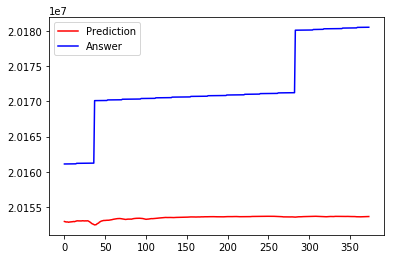

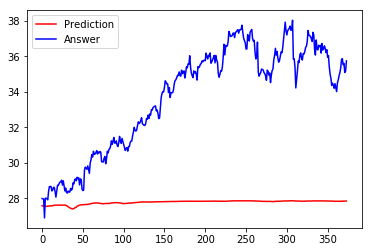

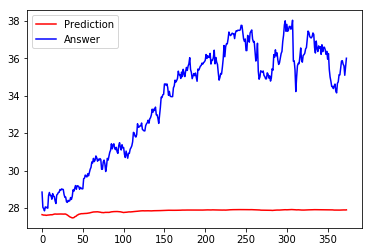

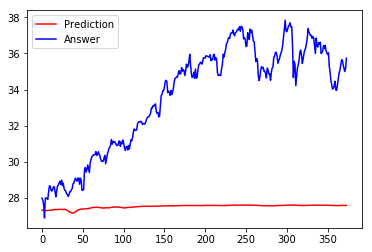

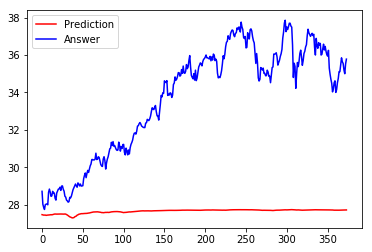

374/374 [==============================] - 0s 136us/step
[array([[ 20152946.],
       [ 20152908.],
       [ 20152876.],
       [ 20152872.],
       [ 20152880.],
       [ 20152834.],
       [ 20152864.],
       [ 20152874.],
       [ 20152890.],
       [ 20152898.],
       [ 20152914.],
       [ 20152942.],
       [ 20152916.],
       [ 20152946.],
       [ 20152984.],
       [ 20153026.],
       [ 20153040.],
       [ 20153026.],
       [ 20153024.],
       [ 20153030.],
       [ 20153020.],
       [ 20153026.],
       [ 20153048.],
       [ 20153040.],
       [ 20153038.],
       [ 20153022.],
       [ 20153038.],
       [ 20153026.],
       [ 20153044.],
       [ 20153026.],
       [ 20152964.],
       [ 20152892.],
       [ 20152798.],
       [ 20152722.],
       [ 20152618.],
       [ 20152578.],
       [ 20152516.],
       [ 20152458.],
       [ 20152474.],
       [ 20152500.],
       [ 20152614.],
       [ 20152672.],
       [ 20152736.],
       [ 20152864.],
       [ 20152916.

Train on 891 samples, validate on 223 samples
Epoch 1/50
891/891 [==============================] - 67s 75ms/step - loss: 0.0994 - acc: 0.4815 - val_loss: 0.4877 - val_acc: 0.5785
Epoch 2/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0551 - acc: 0.5152 - val_loss: 0.2745 - val_acc: 0.5785
Epoch 3/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0330 - acc: 0.5152 - val_loss: 0.2045 - val_acc: 0.5785
Epoch 4/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0269 - acc: 0.5129 - val_loss: 0.2523 - val_acc: 0.5785
Epoch 5/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0271 - acc: 0.3064 - val_loss: 0.2295 - val_acc: 0.1704
Epoch 6/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0261 - acc: 0.3737 - val_loss: 0.2156 - val_acc: 0.5785
Epoch 7/50
891/891 [==============================] - 1s 1ms/step - loss: 0.0241 - acc: 0.5140 - val_loss: 0.2102 - val_acc: 0.5785
Epoch 8/50
891/891 [========

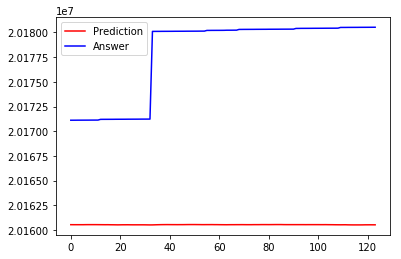

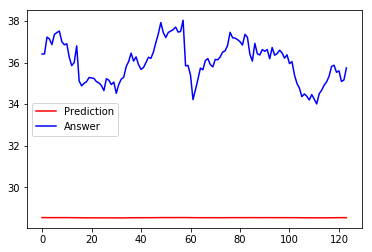

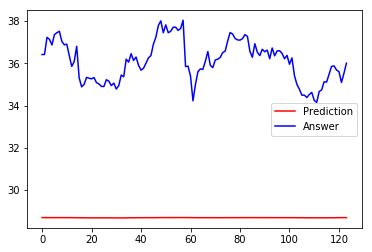

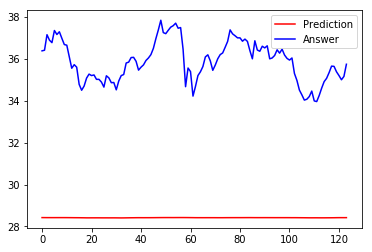

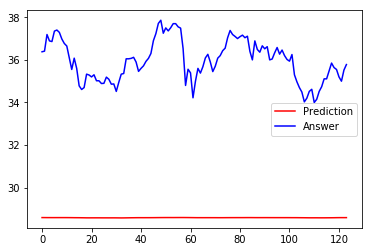

124/124 [==============================] - 0s 468us/step
[array([[ 20160546.],
       [ 20160544.],
       [ 20160544.],
       [ 20160544.],
       [ 20160544.],
       [ 20160544.],
       [ 20160548.],
       [ 20160550.],
       [ 20160550.],
       [ 20160550.],
       [ 20160550.],
       [ 20160548.],
       [ 20160546.],
       [ 20160544.],
       [ 20160542.],
       [ 20160544.],
       [ 20160538.],
       [ 20160536.],
       [ 20160532.],
       [ 20160528.],
       [ 20160532.],
       [ 20160536.],
       [ 20160536.],
       [ 20160538.],
       [ 20160534.],
       [ 20160532.],
       [ 20160532.],
       [ 20160532.],
       [ 20160532.],
       [ 20160532.],
       [ 20160530.],
       [ 20160526.],
       [ 20160522.],
       [ 20160524.],
       [ 20160532.],
       [ 20160540.],
       [ 20160546.],
       [ 20160550.],
       [ 20160552.],
       [ 20160554.],
       [ 20160552.],
       [ 20160550.],
       [ 20160550.],
       [ 20160548.],
       [ 20160550.

Train on 699 samples, validate on 175 samples
Epoch 1/51
699/699 [==============================] - 345s 493ms/step - loss: 0.0737 - acc: 0.0758 - val_loss: 0.1984 - val_acc: 0.0000e+00
Epoch 2/51
699/699 [==============================] - 1s 1ms/step - loss: 0.0622 - acc: 0.0601 - val_loss: 0.1509 - val_acc: 0.0000e+00
Epoch 3/51
699/699 [==============================] - 1s 1ms/step - loss: 0.0319 - acc: 0.0572 - val_loss: 0.0516 - val_acc: 0.0000e+00
Epoch 4/51
699/699 [==============================] - 1s 1ms/step - loss: 0.0219 - acc: 0.0887 - val_loss: 0.0430 - val_acc: 0.0000e+00
Epoch 5/51
699/699 [==============================] - 1s 1ms/step - loss: 0.0199 - acc: 0.1288 - val_loss: 0.0689 - val_acc: 0.0000e+00
Epoch 6/51
699/699 [==============================] - 1s 1ms/step - loss: 0.0202 - acc: 0.2446 - val_loss: 0.0627 - val_acc: 0.0000e+00
Epoch 7/51
699/699 [==============================] - 1s 1ms/step - loss: 0.0196 - acc: 0.3104 - val_loss: 0.0490 - val_acc: 1.0000
Ep

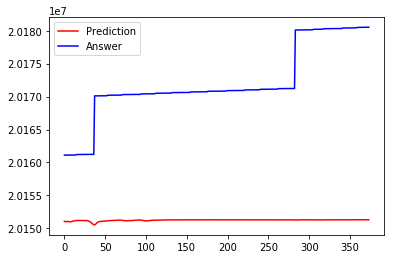

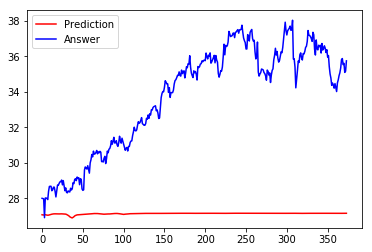

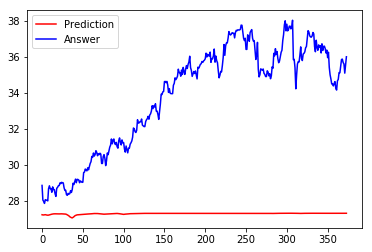

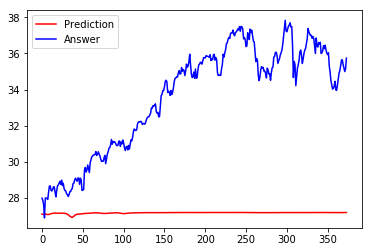

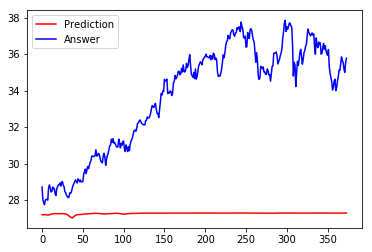

374/374 [==============================] - 0s 564us/step
[array([[ 20151050.],
       [ 20151024.],
       [ 20151018.],
       [ 20151042.],
       [ 20151056.],
       [ 20151020.],
       [ 20150992.],
       [ 20150978.],
       [ 20150992.],
       [ 20151032.],
       [ 20151070.],
       [ 20151116.],
       [ 20151138.],
       [ 20151164.],
       [ 20151180.],
       [ 20151194.],
       [ 20151194.],
       [ 20151192.],
       [ 20151184.],
       [ 20151178.],
       [ 20151176.],
       [ 20151180.],
       [ 20151188.],
       [ 20151190.],
       [ 20151194.],
       [ 20151182.],
       [ 20151182.],
       [ 20151172.],
       [ 20151168.],
       [ 20151148.],
       [ 20151104.],
       [ 20151036.],
       [ 20150950.],
       [ 20150856.],
       [ 20150710.],
       [ 20150636.],
       [ 20150562.],
       [ 20150518.],
       [ 20150610.],
       [ 20150716.],
       [ 20150856.],
       [ 20150934.],
       [ 20150980.],
       [ 20151032.],
       [ 20151044.

78
Train on 699 samples, validate on 175 samples
Epoch 1/51
699/699 [==============================] - 89s 127ms/step - loss: 0.0732 - acc: 0.1760 - val_loss: 0.1947 - val_acc: 0.0000e+00
Epoch 2/51
699/699 [==============================] - 1s 880us/step - loss: 0.0574 - acc: 0.1946 - val_loss: 0.1324 - val_acc: 0.0000e+00
Epoch 3/51
699/699 [==============================] - 1s 1ms/step - loss: 0.0295 - acc: 0.2203 - val_loss: 0.0523 - val_acc: 0.0000e+00
Epoch 4/51
699/699 [==============================] - 1s 980us/step - loss: 0.0218 - acc: 0.2961 - val_loss: 0.0515 - val_acc: 1.0000
Epoch 5/51
699/699 [==============================] - 1s 953us/step - loss: 0.0208 - acc: 0.1845 - val_loss: 0.0652 - val_acc: 0.0000e+00
Epoch 6/51
699/699 [==============================] - 1s 898us/step - loss: 0.0202 - acc: 0.0801 - val_loss: 0.0565 - val_acc: 0.0000e+00
Epoch 7/51
699/699 [==============================] - 1s 911us/step - loss: 0.0191 - acc: 0.0744 - val_loss: 0.0535 - val_acc: 0

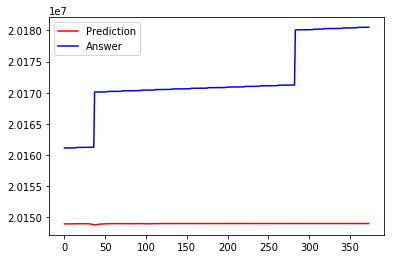

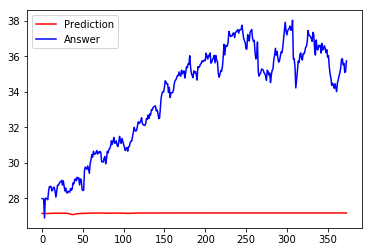

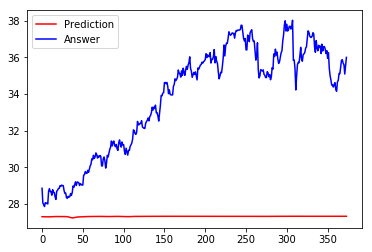

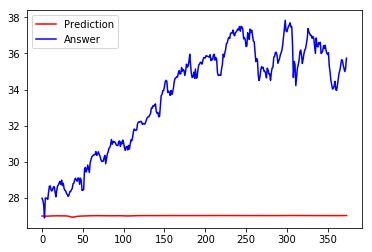

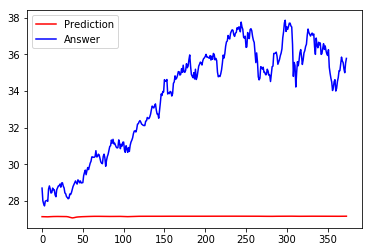

374/374 [==============================] - 0s 361us/step
[array([[ 20148914.],
       [ 20148906.],
       [ 20148904.],
       [ 20148904.],
       [ 20148904.],
       [ 20148896.],
       [ 20148892.],
       [ 20148892.],
       [ 20148894.],
       [ 20148902.],
       [ 20148912.],
       [ 20148920.],
       [ 20148926.],
       [ 20148930.],
       [ 20148932.],
       [ 20148936.],
       [ 20148938.],
       [ 20148940.],
       [ 20148940.],
       [ 20148938.],
       [ 20148938.],
       [ 20148938.],
       [ 20148940.],
       [ 20148940.],
       [ 20148940.],
       [ 20148938.],
       [ 20148936.],
       [ 20148934.],
       [ 20148934.],
       [ 20148932.],
       [ 20148922.],
       [ 20148912.],
       [ 20148894.],
       [ 20148868.],
       [ 20148832.],
       [ 20148798.],
       [ 20148772.],
       [ 20148744.],
       [ 20148756.],
       [ 20148776.],
       [ 20148806.],
       [ 20148834.],
       [ 20148852.],
       [ 20148868.],
       [ 20148878.

Train on 785 samples, validate on 197 samples
Epoch 1/50
785/785 [==============================] - 73s 94ms/step - loss: 0.0837 - acc: 0.0599 - val_loss: 0.2719 - val_acc: 0.0000e+00
Epoch 2/50
785/785 [==============================] - 6s 7ms/step - loss: 0.0487 - acc: 0.0420 - val_loss: 0.1451 - val_acc: 0.0000e+00
Epoch 3/50
785/785 [==============================] - 6s 7ms/step - loss: 0.0247 - acc: 0.2217 - val_loss: 0.0851 - val_acc: 1.0000
Epoch 4/50
785/785 [==============================] - 6s 7ms/step - loss: 0.0226 - acc: 0.3032 - val_loss: 0.1089 - val_acc: 0.0000e+00
Epoch 5/50
785/785 [==============================] - 6s 7ms/step - loss: 0.0222 - acc: 0.2650 - val_loss: 0.1057 - val_acc: 1.0000
Epoch 6/50
785/785 [==============================] - 6s 7ms/step - loss: 0.0197 - acc: 0.4446 - val_loss: 0.0889 - val_acc: 1.0000
Epoch 7/50
785/785 [==============================] - 6s 7ms/step - loss: 0.0177 - acc: 0.4510 - val_loss: 0.0879 - val_acc: 1.0000
Epoch 8/50
785/7

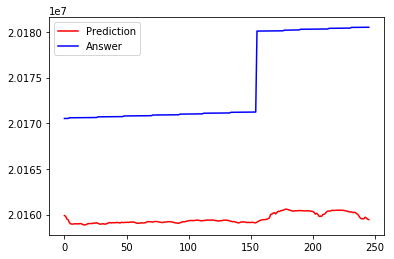

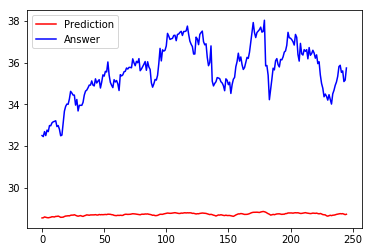

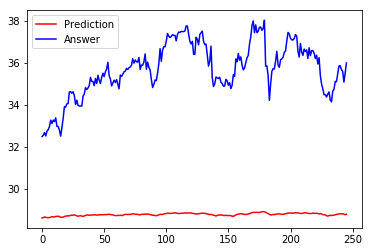

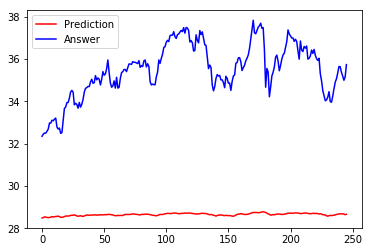

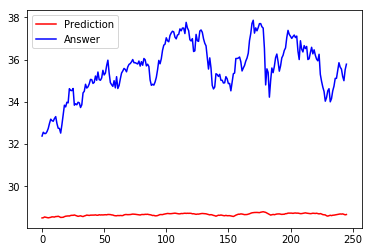

246/246 [==============================] - 1s 5ms/step
[array([[ 20159890.],
       [ 20159796.],
       [ 20159504.],
       [ 20159432.],
       [ 20159116.],
       [ 20158976.],
       [ 20158964.],
       [ 20158946.],
       [ 20158984.],
       [ 20158992.],
       [ 20158964.],
       [ 20158994.],
       [ 20158978.],
       [ 20159018.],
       [ 20158970.],
       [ 20158888.],
       [ 20158862.],
       [ 20158866.],
       [ 20158938.],
       [ 20159000.],
       [ 20159010.],
       [ 20159020.],
       [ 20159000.],
       [ 20159052.],
       [ 20159070.],
       [ 20159056.],
       [ 20159096.],
       [ 20159034.],
       [ 20158972.],
       [ 20158942.],
       [ 20158966.],
       [ 20158996.],
       [ 20158966.],
       [ 20158938.],
       [ 20159004.],
       [ 20159046.],
       [ 20159120.],
       [ 20159098.],
       [ 20159084.],
       [ 20159110.],
       [ 20159102.],
       [ 20159112.],
       [ 20159120.],
       [ 20159132.],
       [ 20159090.],

78
Train on 602 samples, validate on 258 samples
Epoch 1/50
602/602 [==============================] - 103s 171ms/step - loss: 0.0700 - acc: 0.3372 - val_loss: 0.1328 - val_acc: 0.0000e+00
Epoch 2/50
602/602 [==============================] - 30s 49ms/step - loss: 0.0364 - acc: 0.2392 - val_loss: 0.0555 - val_acc: 0.0000e+00
Epoch 3/50
602/602 [==============================] - 30s 50ms/step - loss: 0.0213 - acc: 0.1877 - val_loss: 0.0414 - val_acc: 0.0000e+00
Epoch 4/50
602/602 [==============================] - 30s 50ms/step - loss: 0.0208 - acc: 0.1246 - val_loss: 0.0398 - val_acc: 0.0000e+00
Epoch 5/50
602/602 [==============================] - 30s 49ms/step - loss: 0.0203 - acc: 0.1080 - val_loss: 0.0515 - val_acc: 0.0000e+00
Epoch 6/50
602/602 [==============================] - 30s 50ms/step - loss: 0.0200 - acc: 0.2342 - val_loss: 0.0445 - val_acc: 0.0000e+00
Epoch 7/50
602/602 [==============================] - 30s 49ms/step - loss: 0.0199 - acc: 0.2359 - val_loss: 0.0477 - val

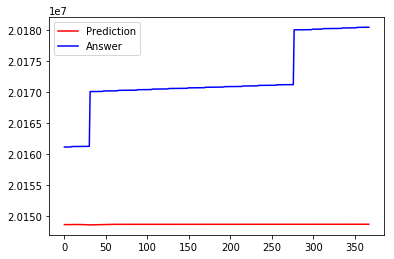

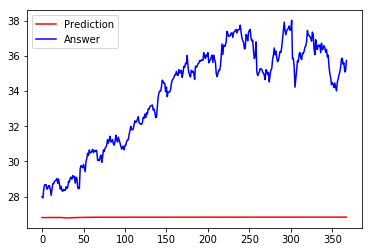

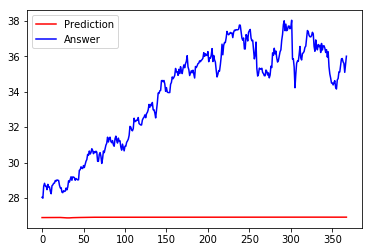

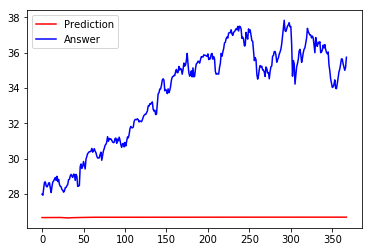

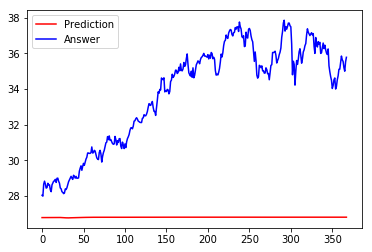

368/368 [==============================] - 5s 13ms/step
[array([[ 20148554.],
       [ 20148556.],
       [ 20148556.],
       [ 20148558.],
       [ 20148564.],
       [ 20148570.],
       [ 20148570.],
       [ 20148574.],
       [ 20148570.],
       [ 20148570.],
       [ 20148570.],
       [ 20148568.],
       [ 20148568.],
       [ 20148566.],
       [ 20148566.],
       [ 20148568.],
       [ 20148572.],
       [ 20148572.],
       [ 20148570.],
       [ 20148568.],
       [ 20148568.],
       [ 20148566.],
       [ 20148568.],
       [ 20148562.],
       [ 20148556.],
       [ 20148550.],
       [ 20148542.],
       [ 20148532.],
       [ 20148522.],
       [ 20148518.],
       [ 20148510.],
       [ 20148506.],
       [ 20148510.],
       [ 20148510.],
       [ 20148522.],
       [ 20148526.],
       [ 20148530.],
       [ 20148540.],
       [ 20148542.],
       [ 20148548.],
       [ 20148548.],
       [ 20148556.],
       [ 20148558.],
       [ 20148556.],
       [ 20148560.]

Train on 611 samples, validate on 263 samples
Epoch 1/51
611/611 [==============================] - 76s 124ms/step - loss: 0.0712 - acc: 0.2537 - val_loss: 0.1680 - val_acc: 1.0000
Epoch 2/51
611/611 [==============================] - 1s 2ms/step - loss: 0.0672 - acc: 0.2553 - val_loss: 0.1537 - val_acc: 0.0000e+00
Epoch 3/51
611/611 [==============================] - 1s 2ms/step - loss: 0.0580 - acc: 0.2717 - val_loss: 0.1201 - val_acc: 0.0000e+00
Epoch 4/51
611/611 [==============================] - 1s 2ms/step - loss: 0.0402 - acc: 0.2520 - val_loss: 0.0698 - val_acc: 0.0000e+00
Epoch 5/51
611/611 [==============================] - 1s 2ms/step - loss: 0.0237 - acc: 0.2488 - val_loss: 0.0298 - val_acc: 0.0000e+00
Epoch 6/51
611/611 [==============================] - 1s 2ms/step - loss: 0.0247 - acc: 0.2128 - val_loss: 0.0293 - val_acc: 0.0000e+00
Epoch 7/51
611/611 [==============================] - 1s 2ms/step - loss: 0.0229 - acc: 0.2553 - val_loss: 0.0457 - val_acc: 0.0000e+00
Epo

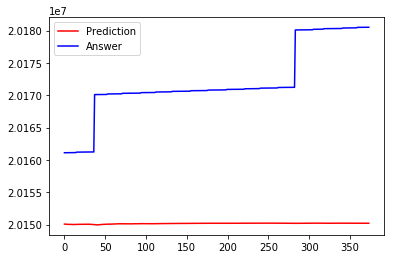

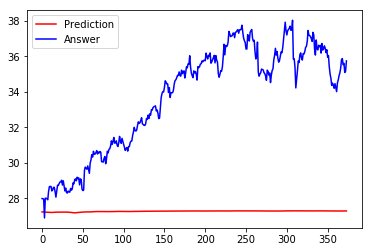

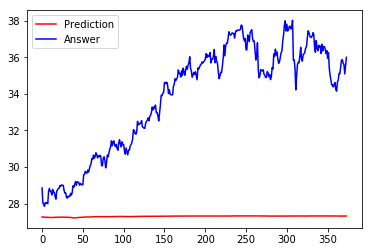

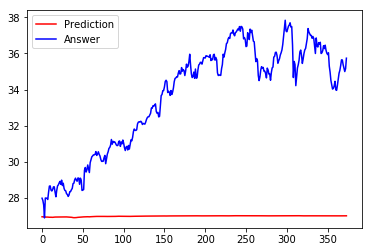

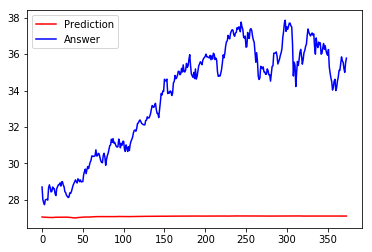

374/374 [==============================] - 0s 396us/step
[array([[ 20150070.],
       [ 20150068.],
       [ 20150054.],
       [ 20150040.],
       [ 20150034.],
       [ 20150026.],
       [ 20150032.],
       [ 20150028.],
       [ 20150016.],
       [ 20150004.],
       [ 20150006.],
       [ 20150006.],
       [ 20149996.],
       [ 20149994.],
       [ 20150012.],
       [ 20150028.],
       [ 20150030.],
       [ 20150032.],
       [ 20150036.],
       [ 20150044.],
       [ 20150042.],
       [ 20150034.],
       [ 20150042.],
       [ 20150044.],
       [ 20150050.],
       [ 20150044.],
       [ 20150038.],
       [ 20150040.],
       [ 20150044.],
       [ 20150050.],
       [ 20150048.],
       [ 20150042.],
       [ 20150024.],
       [ 20150020.],
       [ 20150016.],
       [ 20150012.],
       [ 20149998.],
       [ 20149982.],
       [ 20149952.],
       [ 20149942.],
       [ 20149946.],
       [ 20149950.],
       [ 20149960.],
       [ 20149978.],
       [ 20149992.

Train on 606 samples, validate on 261 samples
Epoch 1/50
606/606 [==============================] - 74s 121ms/step - loss: 0.0717 - acc: 0.2772 - val_loss: 0.1664 - val_acc: 0.0000e+00
Epoch 2/50
606/606 [==============================] - 1s 2ms/step - loss: 0.0647 - acc: 0.3003 - val_loss: 0.1469 - val_acc: 0.0000e+00
Epoch 3/50
606/606 [==============================] - 1s 2ms/step - loss: 0.0525 - acc: 0.3366 - val_loss: 0.1150 - val_acc: 0.0000e+00
Epoch 4/50
606/606 [==============================] - 1s 2ms/step - loss: 0.0362 - acc: 0.3449 - val_loss: 0.0773 - val_acc: 0.0000e+00
Epoch 5/50
606/606 [==============================] - 1s 2ms/step - loss: 0.0263 - acc: 0.3449 - val_loss: 0.0476 - val_acc: 0.0000e+00
Epoch 6/50
606/606 [==============================] - 1s 2ms/step - loss: 0.0236 - acc: 0.3449 - val_loss: 0.0367 - val_acc: 0.0000e+00
Epoch 7/50
606/606 [==============================] - 1s 2ms/step - loss: 0.0208 - acc: 0.3432 - val_loss: 0.0397 - val_acc: 0.0000e+00

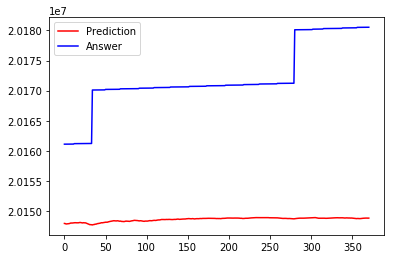

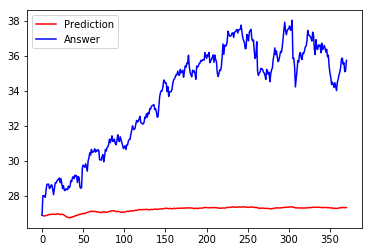

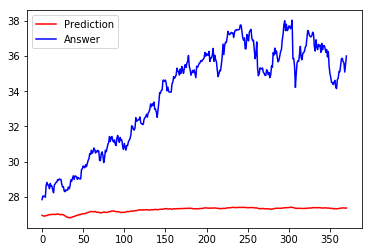

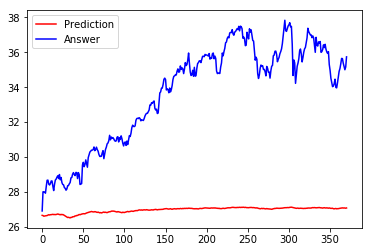

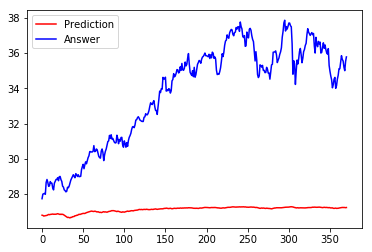

371/371 [==============================] - 0s 356us/step
[array([[ 20147956.],
       [ 20147932.],
       [ 20147868.],
       [ 20147880.],
       [ 20147900.],
       [ 20147916.],
       [ 20147938.],
       [ 20147988.],
       [ 20148036.],
       [ 20148016.],
       [ 20148038.],
       [ 20148048.],
       [ 20148064.],
       [ 20148080.],
       [ 20148064.],
       [ 20148062.],
       [ 20148056.],
       [ 20148064.],
       [ 20148094.],
       [ 20148120.],
       [ 20148098.],
       [ 20148068.],
       [ 20148042.],
       [ 20148080.],
       [ 20148056.],
       [ 20148064.],
       [ 20148036.],
       [ 20147980.],
       [ 20147932.],
       [ 20147872.],
       [ 20147816.],
       [ 20147750.],
       [ 20147762.],
       [ 20147740.],
       [ 20147712.],
       [ 20147764.],
       [ 20147768.],
       [ 20147822.],
       [ 20147850.],
       [ 20147860.],
       [ 20147926.],
       [ 20147936.],
       [ 20147972.],
       [ 20147986.],
       [ 20148024.

Train on 785 samples, validate on 197 samples
Epoch 1/50
785/785 [==============================] - 74s 95ms/step - loss: 0.0866 - acc: 0.0904 - val_loss: 0.3236 - val_acc: 0.0000e+00
Epoch 2/50
785/785 [==============================] - 1s 919us/step - loss: 0.0742 - acc: 0.0662 - val_loss: 0.2753 - val_acc: 0.0000e+00
Epoch 3/50
785/785 [==============================] - 1s 957us/step - loss: 0.0480 - acc: 0.0548 - val_loss: 0.1780 - val_acc: 0.0000e+00
Epoch 4/50
785/785 [==============================] - 1s 953us/step - loss: 0.0242 - acc: 0.0510 - val_loss: 0.0794 - val_acc: 0.0000e+00
Epoch 5/50
785/785 [==============================] - 1s 1ms/step - loss: 0.0242 - acc: 0.2484 - val_loss: 0.0970 - val_acc: 1.0000
Epoch 6/50
785/785 [==============================] - 1s 1ms/step - loss: 0.0218 - acc: 0.4624 - val_loss: 0.1264 - val_acc: 1.0000
Epoch 7/50
785/785 [==============================] - 1s 1ms/step - loss: 0.0218 - acc: 0.4624 - val_loss: 0.1151 - val_acc: 1.0000
Epoch 

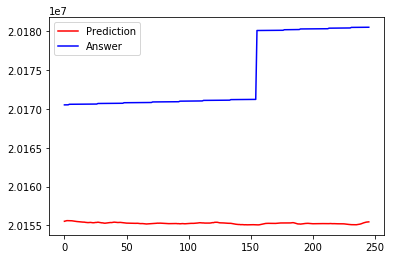

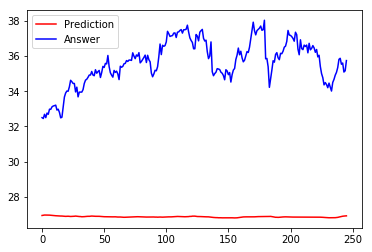

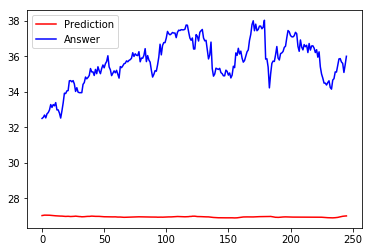

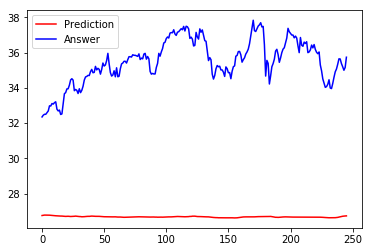

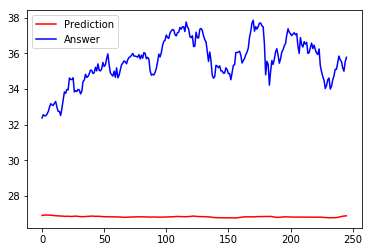

246/246 [==============================] - 0s 419us/step
[array([[ 20155532.],
       [ 20155576.],
       [ 20155616.],
       [ 20155614.],
       [ 20155626.],
       [ 20155618.],
       [ 20155596.],
       [ 20155570.],
       [ 20155544.],
       [ 20155510.],
       [ 20155500.],
       [ 20155482.],
       [ 20155464.],
       [ 20155438.],
       [ 20155424.],
       [ 20155424.],
       [ 20155424.],
       [ 20155392.],
       [ 20155380.],
       [ 20155362.],
       [ 20155372.],
       [ 20155386.],
       [ 20155360.],
       [ 20155342.],
       [ 20155352.],
       [ 20155380.],
       [ 20155384.],
       [ 20155416.],
       [ 20155388.],
       [ 20155356.],
       [ 20155332.],
       [ 20155326.],
       [ 20155288.],
       [ 20155290.],
       [ 20155310.],
       [ 20155340.],
       [ 20155358.],
       [ 20155372.],
       [ 20155366.],
       [ 20155398.],
       [ 20155422.],
       [ 20155400.],
       [ 20155392.],
       [ 20155374.],
       [ 20155380.

Train on 891 samples, validate on 223 samples
Epoch 1/51
891/891 [==============================] - 75s 84ms/step - loss: 0.1068 - acc: 0.2031 - val_loss: 0.5546 - val_acc: 0.3274
Epoch 2/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0965 - acc: 0.2862 - val_loss: 0.5038 - val_acc: 0.5785
Epoch 3/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0748 - acc: 0.2952 - val_loss: 0.4219 - val_acc: 0.5785
Epoch 4/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0484 - acc: 0.3042 - val_loss: 0.3065 - val_acc: 0.1076
Epoch 5/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0293 - acc: 0.2952 - val_loss: 0.1835 - val_acc: 0.5785
Epoch 6/51
891/891 [==============================] - 2s 2ms/step - loss: 0.0319 - acc: 0.4422 - val_loss: 0.1775 - val_acc: 0.5785
Epoch 7/51
891/891 [==============================] - 2s 3ms/step - loss: 0.0278 - acc: 0.5129 - val_loss: 0.2335 - val_acc: 0.5785
Epoch 8/51
891/891 [========

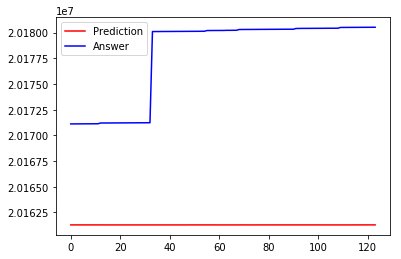

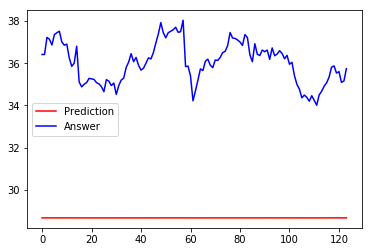

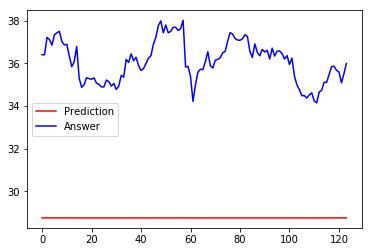

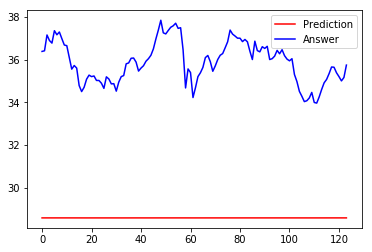

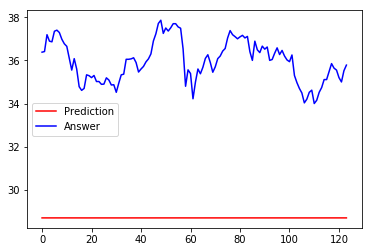

124/124 [==============================] - 0s 444us/step
[array([[ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161288.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.],
       [ 20161286.

Train on 602 samples, validate on 258 samples
Epoch 1/50
602/602 [==============================] - 81s 134ms/step - loss: 0.0744 - acc: 0.0598 - val_loss: 0.1751 - val_acc: 0.0000e+00
Epoch 2/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0720 - acc: 0.0581 - val_loss: 0.1689 - val_acc: 0.0000e+00
Epoch 3/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0679 - acc: 0.0681 - val_loss: 0.1562 - val_acc: 0.0000e+00
Epoch 4/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0603 - acc: 0.0631 - val_loss: 0.1385 - val_acc: 0.0000e+00
Epoch 5/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0506 - acc: 0.0581 - val_loss: 0.1165 - val_acc: 0.0000e+00
Epoch 6/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0397 - acc: 0.0615 - val_loss: 0.0903 - val_acc: 0.0000e+00
Epoch 7/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0288 - acc: 0.0565 - val_loss: 0.0629 - val_acc: 0.0000e+00

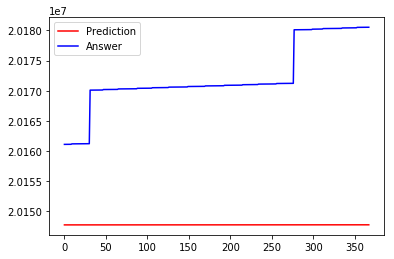

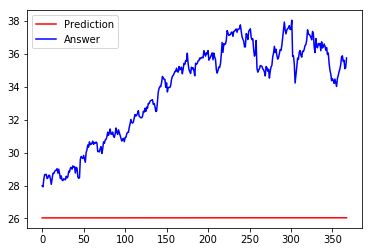

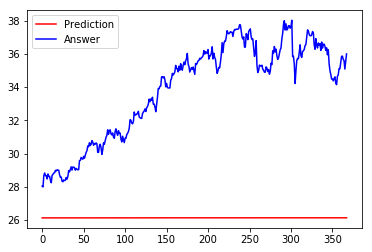

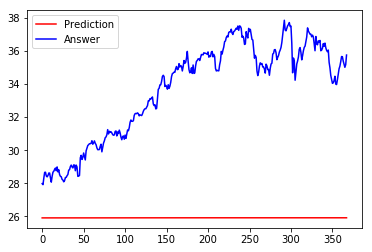

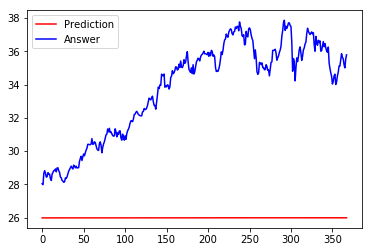

368/368 [==============================] - 0s 1ms/step
[array([[ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147778.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147774.],
       [ 20147774.],
       [ 20147774.],
       [ 20147774.],
       [ 20147774.],
       [ 20147774.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],
       [ 20147776.],

Train on 883 samples, validate on 99 samples
Epoch 1/51
883/883 [==============================] - 88s 100ms/step - loss: 0.0999 - acc: 0.5062 - val_loss: 0.3169 - val_acc: 1.0000
Epoch 2/51
883/883 [==============================] - 6s 7ms/step - loss: 0.0558 - acc: 0.5221 - val_loss: 0.1718 - val_acc: 1.0000
Epoch 3/51
883/883 [==============================] - 6s 7ms/step - loss: 0.0304 - acc: 0.5221 - val_loss: 0.0738 - val_acc: 1.0000
Epoch 4/51
883/883 [==============================] - 6s 7ms/step - loss: 0.0295 - acc: 0.5221 - val_loss: 0.1134 - val_acc: 1.0000
Epoch 5/51
883/883 [==============================] - 6s 7ms/step - loss: 0.0250 - acc: 0.5210 - val_loss: 0.1466 - val_acc: 1.0000
Epoch 6/51
883/883 [==============================] - 6s 7ms/step - loss: 0.0261 - acc: 0.3601 - val_loss: 0.1356 - val_acc: 0.0000e+00
Epoch 7/51
883/883 [==============================] - 6s 7ms/step - loss: 0.0241 - acc: 0.2424 - val_loss: 0.1062 - val_acc: 1.0000
Epoch 8/51
883/883 [====

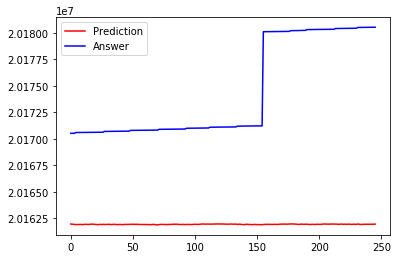

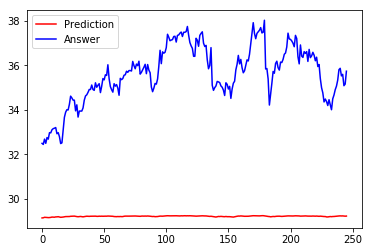

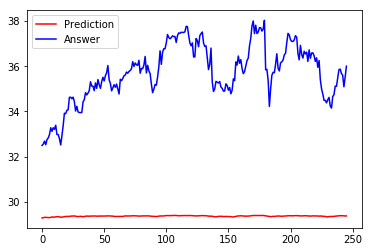

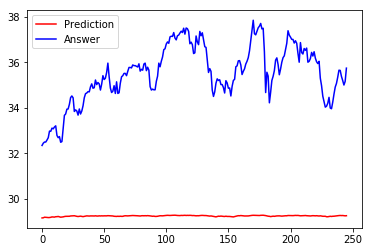

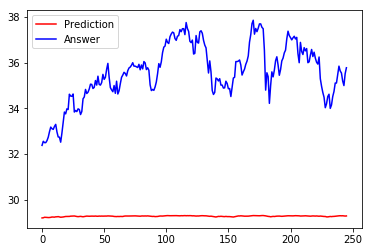

246/246 [==============================] - 1s 2ms/step
[array([[ 20161980.],
       [ 20161960.],
       [ 20161962.],
       [ 20161932.],
       [ 20161928.],
       [ 20161928.],
       [ 20161930.],
       [ 20161938.],
       [ 20161942.],
       [ 20161926.],
       [ 20161924.],
       [ 20161954.],
       [ 20161950.],
       [ 20161956.],
       [ 20161942.],
       [ 20161936.],
       [ 20161966.],
       [ 20161968.],
       [ 20161962.],
       [ 20161948.],
       [ 20161930.],
       [ 20161928.],
       [ 20161918.],
       [ 20161940.],
       [ 20161934.],
       [ 20161934.],
       [ 20161950.],
       [ 20161934.],
       [ 20161938.],
       [ 20161934.],
       [ 20161956.],
       [ 20161952.],
       [ 20161928.],
       [ 20161926.],
       [ 20161948.],
       [ 20161948.],
       [ 20161942.],
       [ 20161924.],
       [ 20161922.],
       [ 20161942.],
       [ 20161940.],
       [ 20161928.],
       [ 20161916.],
       [ 20161942.],
       [ 20161936.],

78
Train on 1010 samples, validate on 113 samples
Epoch 1/51
1010/1010 [==============================] - 78s 77ms/step - loss: 0.1372 - acc: 0.1832 - val_loss: 0.6953 - val_acc: 0.1681
Epoch 2/51
1010/1010 [==============================] - 0s 467us/step - loss: 0.1175 - acc: 0.1416 - val_loss: 0.5642 - val_acc: 0.1681
Epoch 3/51
1010/1010 [==============================] - 1s 564us/step - loss: 0.0621 - acc: 0.1525 - val_loss: 0.2651 - val_acc: 0.1681
Epoch 4/51
1010/1010 [==============================] - 0s 494us/step - loss: 0.0444 - acc: 0.2663 - val_loss: 0.2702 - val_acc: 0.1770
Epoch 5/51
1010/1010 [==============================] - 1s 600us/step - loss: 0.0385 - acc: 0.5594 - val_loss: 0.3142 - val_acc: 0.1770
Epoch 6/51
1010/1010 [==============================] - 1s 593us/step - loss: 0.0377 - acc: 0.5584 - val_loss: 0.2811 - val_acc: 0.1770
Epoch 7/51
1010/1010 [==============================] - 1s 519us/step - loss: 0.0367 - acc: 0.5614 - val_loss: 0.2776 - val_acc: 0.177

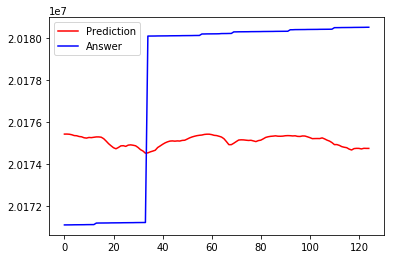

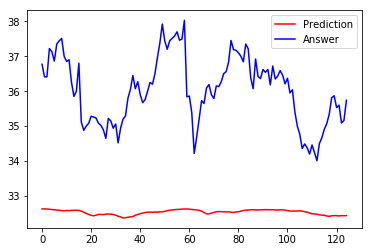

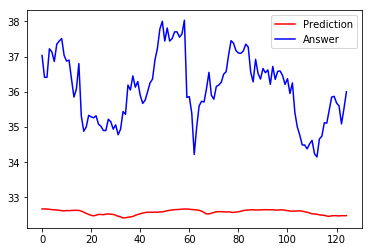

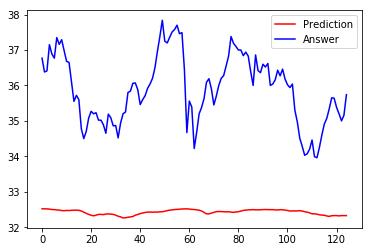

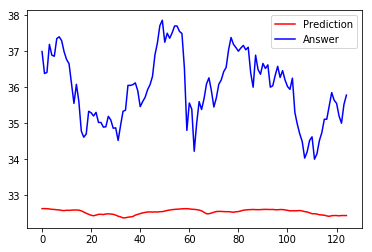

125/125 [==============================] - 0s 296us/step
[array([[ 20175436.],
       [ 20175438.],
       [ 20175430.],
       [ 20175406.],
       [ 20175366.],
       [ 20175358.],
       [ 20175322.],
       [ 20175308.],
       [ 20175262.],
       [ 20175246.],
       [ 20175276.],
       [ 20175268.],
       [ 20175286.],
       [ 20175302.],
       [ 20175302.],
       [ 20175288.],
       [ 20175218.],
       [ 20175104.],
       [ 20174980.],
       [ 20174880.],
       [ 20174788.],
       [ 20174738.],
       [ 20174800.],
       [ 20174876.],
       [ 20174884.],
       [ 20174852.],
       [ 20174912.],
       [ 20174924.],
       [ 20174906.],
       [ 20174880.],
       [ 20174800.],
       [ 20174696.],
       [ 20174632.],
       [ 20174528.],
       [ 20174544.],
       [ 20174592.],
       [ 20174628.],
       [ 20174668.],
       [ 20174798.],
       [ 20174872.],
       [ 20174950.],
       [ 20175018.],
       [ 20175068.],
       [ 20175104.],
       [ 20175112.

Train on 785 samples, validate on 197 samples
Epoch 1/50
785/785 [==============================] - 80s 102ms/step - loss: 0.0890 - acc: 0.2930 - val_loss: 0.3345 - val_acc: 0.0000e+00
Epoch 2/50
785/785 [==============================] - 2s 3ms/step - loss: 0.0849 - acc: 0.1516 - val_loss: 0.3218 - val_acc: 0.0000e+00
Epoch 3/50
785/785 [==============================] - 3s 3ms/step - loss: 0.0789 - acc: 0.1325 - val_loss: 0.3026 - val_acc: 0.0000e+00
Epoch 4/50
785/785 [==============================] - 3s 3ms/step - loss: 0.0699 - acc: 0.0854 - val_loss: 0.2765 - val_acc: 0.0000e+00
Epoch 5/50
785/785 [==============================] - 3s 3ms/step - loss: 0.0589 - acc: 0.0662 - val_loss: 0.2417 - val_acc: 0.0000e+00
Epoch 6/50
785/785 [==============================] - 3s 3ms/step - loss: 0.0457 - acc: 0.0471 - val_loss: 0.1959 - val_acc: 0.0000e+00
Epoch 7/50
785/785 [==============================] - 3s 3ms/step - loss: 0.0323 - acc: 0.0459 - val_loss: 0.1395 - val_acc: 0.0000e+00

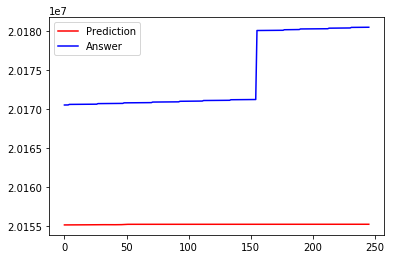

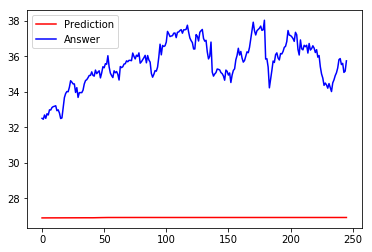

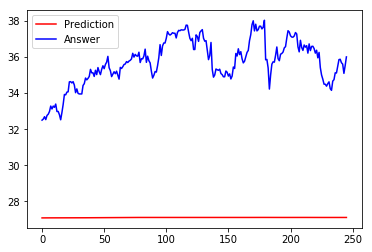

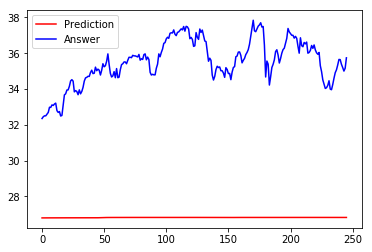

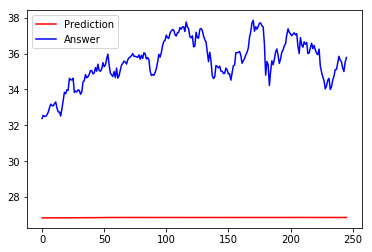

246/246 [==============================] - 0s 720us/step
[array([[ 20155106.],
       [ 20155106.],
       [ 20155106.],
       [ 20155106.],
       [ 20155106.],
       [ 20155106.],
       [ 20155112.],
       [ 20155112.],
       [ 20155116.],
       [ 20155116.],
       [ 20155114.],
       [ 20155118.],
       [ 20155118.],
       [ 20155118.],
       [ 20155118.],
       [ 20155112.],
       [ 20155116.],
       [ 20155118.],
       [ 20155120.],
       [ 20155122.],
       [ 20155124.],
       [ 20155124.],
       [ 20155124.],
       [ 20155128.],
       [ 20155128.],
       [ 20155128.],
       [ 20155128.],
       [ 20155126.],
       [ 20155126.],
       [ 20155128.],
       [ 20155132.],
       [ 20155132.],
       [ 20155136.],
       [ 20155134.],
       [ 20155134.],
       [ 20155132.],
       [ 20155132.],
       [ 20155128.],
       [ 20155128.],
       [ 20155130.],
       [ 20155130.],
       [ 20155132.],
       [ 20155132.],
       [ 20155134.],
       [ 20155132.

Train on 699 samples, validate on 175 samples
Epoch 1/51
699/699 [==============================] - 84s 121ms/step - loss: 0.0725 - acc: 0.3648 - val_loss: 0.1658 - val_acc: 1.0000
Epoch 2/51
699/699 [==============================] - 6s 9ms/step - loss: 0.0419 - acc: 0.3677 - val_loss: 0.0552 - val_acc: 1.0000
Epoch 3/51
699/699 [==============================] - 7s 10ms/step - loss: 0.0266 - acc: 0.3677 - val_loss: 0.0578 - val_acc: 1.0000
Epoch 4/51
699/699 [==============================] - 6s 9ms/step - loss: 0.0211 - acc: 0.3677 - val_loss: 0.0594 - val_acc: 1.0000
Epoch 5/51
699/699 [==============================] - 6s 9ms/step - loss: 0.0197 - acc: 0.3019 - val_loss: 0.0509 - val_acc: 0.0000e+00
Epoch 6/51
699/699 [==============================] - 7s 10ms/step - loss: 0.0195 - acc: 0.0544 - val_loss: 0.0616 - val_acc: 0.0000e+00
Epoch 7/51
699/699 [==============================] - 7s 9ms/step - loss: 0.0197 - acc: 0.0701 - val_loss: 0.0638 - val_acc: 0.0000e+00
Epoch 8/51
69

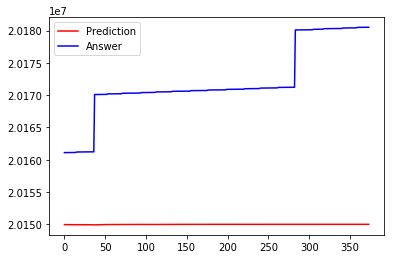

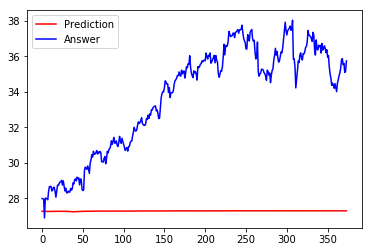

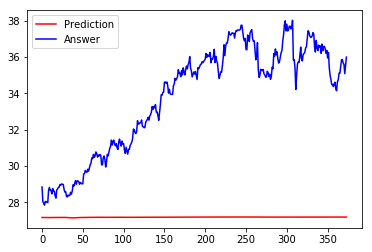

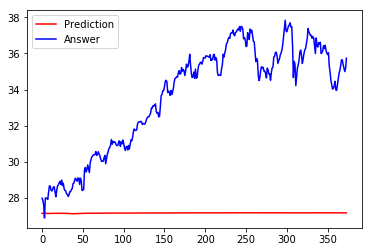

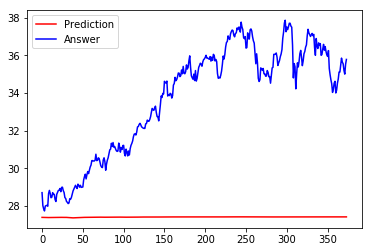

374/374 [==============================] - 1s 2ms/step
[array([[ 20149964.],
       [ 20149960.],
       [ 20149956.],
       [ 20149954.],
       [ 20149954.],
       [ 20149950.],
       [ 20149948.],
       [ 20149950.],
       [ 20149950.],
       [ 20149952.],
       [ 20149952.],
       [ 20149954.],
       [ 20149952.],
       [ 20149952.],
       [ 20149960.],
       [ 20149962.],
       [ 20149964.],
       [ 20149966.],
       [ 20149966.],
       [ 20149966.],
       [ 20149964.],
       [ 20149966.],
       [ 20149966.],
       [ 20149966.],
       [ 20149966.],
       [ 20149964.],
       [ 20149964.],
       [ 20149964.],
       [ 20149966.],
       [ 20149966.],
       [ 20149960.],
       [ 20149954.],
       [ 20149946.],
       [ 20149938.],
       [ 20149926.],
       [ 20149922.],
       [ 20149920.],
       [ 20149912.],
       [ 20149920.],
       [ 20149924.],
       [ 20149932.],
       [ 20149936.],
       [ 20149940.],
       [ 20149948.],
       [ 20149948.],

78
Train on 785 samples, validate on 197 samples
Epoch 1/50
785/785 [==============================] - 82s 104ms/step - loss: 0.0888 - acc: 0.0994 - val_loss: 0.3368 - val_acc: 0.0000e+00
Epoch 2/50
785/785 [==============================] - 2s 3ms/step - loss: 0.0851 - acc: 0.0446 - val_loss: 0.3235 - val_acc: 0.0000e+00
Epoch 3/50
785/785 [==============================] - 3s 3ms/step - loss: 0.0773 - acc: 0.0573 - val_loss: 0.2969 - val_acc: 0.0000e+00
Epoch 4/50
785/785 [==============================] - 2s 3ms/step - loss: 0.0646 - acc: 0.0484 - val_loss: 0.2560 - val_acc: 0.0000e+00
Epoch 5/50
785/785 [==============================] - 2s 3ms/step - loss: 0.0490 - acc: 0.0420 - val_loss: 0.2003 - val_acc: 0.0000e+00
Epoch 6/50
785/785 [==============================] - 3s 3ms/step - loss: 0.0344 - acc: 0.0420 - val_loss: 0.1356 - val_acc: 0.0000e+00
Epoch 7/50
785/785 [==============================] - 2s 3ms/step - loss: 0.0291 - acc: 0.0459 - val_loss: 0.0969 - val_acc: 0.0000e

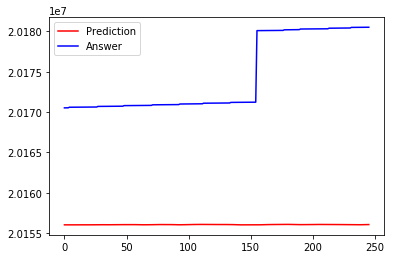

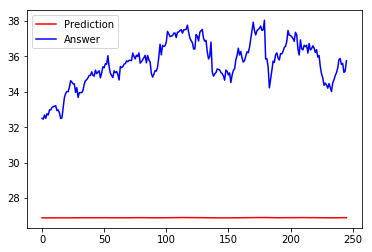

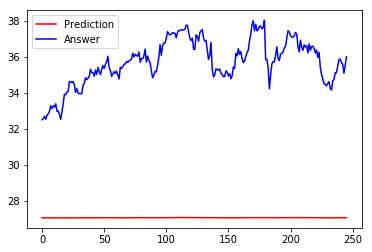

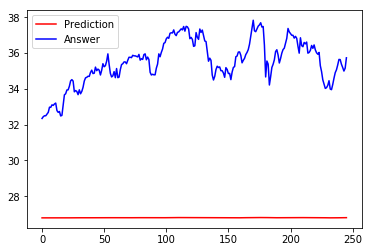

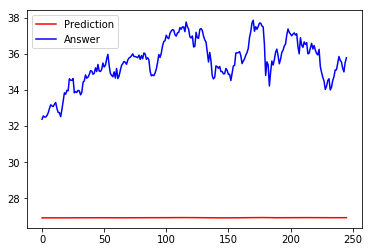

246/246 [==============================] - 0s 866us/step
[array([[ 20156018.],
       [ 20156016.],
       [ 20156018.],
       [ 20156018.],
       [ 20156018.],
       [ 20156018.],
       [ 20156016.],
       [ 20156016.],
       [ 20156018.],
       [ 20156020.],
       [ 20156020.],
       [ 20156022.],
       [ 20156022.],
       [ 20156024.],
       [ 20156022.],
       [ 20156020.],
       [ 20156018.],
       [ 20156016.],
       [ 20156016.],
       [ 20156018.],
       [ 20156020.],
       [ 20156022.],
       [ 20156022.],
       [ 20156026.],
       [ 20156028.],
       [ 20156032.],
       [ 20156034.],
       [ 20156036.],
       [ 20156036.],
       [ 20156034.],
       [ 20156034.],
       [ 20156034.],
       [ 20156032.],
       [ 20156028.],
       [ 20156028.],
       [ 20156028.],
       [ 20156030.],
       [ 20156032.],
       [ 20156034.],
       [ 20156034.],
       [ 20156036.],
       [ 20156038.],
       [ 20156038.],
       [ 20156040.],
       [ 20156040.

Train on 688 samples, validate on 172 samples
Epoch 1/50
688/688 [==============================] - 99s 144ms/step - loss: 0.0574 - acc: 0.1483 - val_loss: 0.0799 - val_acc: 0.0000e+00
Epoch 2/50
688/688 [==============================] - 21s 31ms/step - loss: 0.0231 - acc: 0.2849 - val_loss: 0.0431 - val_acc: 1.0000
Epoch 3/50
688/688 [==============================] - 21s 31ms/step - loss: 0.0209 - acc: 0.3096 - val_loss: 0.0619 - val_acc: 0.0000e+00
Epoch 4/50
688/688 [==============================] - 21s 31ms/step - loss: 0.0183 - acc: 0.1991 - val_loss: 0.0445 - val_acc: 1.0000
Epoch 5/50
688/688 [==============================] - 21s 31ms/step - loss: 0.0126 - acc: 0.2427 - val_loss: 0.0282 - val_acc: 1.0000
Epoch 6/50
688/688 [==============================] - 22s 31ms/step - loss: 0.0071 - acc: 0.2791 - val_loss: 0.0282 - val_acc: 1.0000
Epoch 7/50
688/688 [==============================] - 21s 31ms/step - loss: 0.0061 - acc: 0.3023 - val_loss: 0.0278 - val_acc: 1.0000
Epoch 8

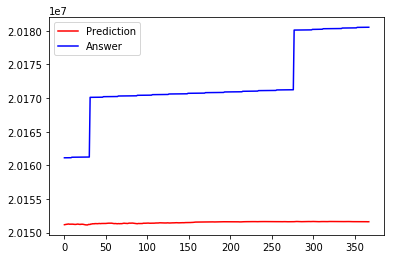

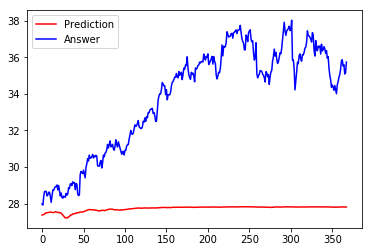

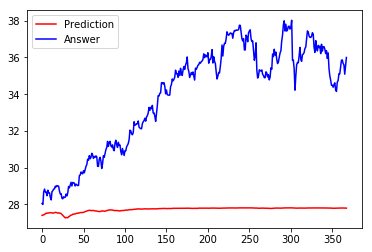

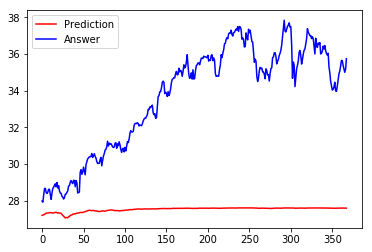

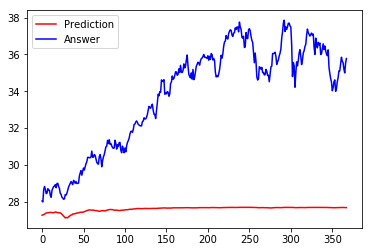

368/368 [==============================] - 3s 7ms/step
[array([[ 20151170.],
       [ 20151198.],
       [ 20151218.],
       [ 20151234.],
       [ 20151262.],
       [ 20151278.],
       [ 20151246.],
       [ 20151252.],
       [ 20151250.],
       [ 20151252.],
       [ 20151252.],
       [ 20151230.],
       [ 20151222.],
       [ 20151212.],
       [ 20151222.],
       [ 20151252.],
       [ 20151266.],
       [ 20151246.],
       [ 20151226.],
       [ 20151208.],
       [ 20151252.],
       [ 20151230.],
       [ 20151246.],
       [ 20151214.],
       [ 20151184.],
       [ 20151162.],
       [ 20151144.],
       [ 20151146.],
       [ 20151140.],
       [ 20151210.],
       [ 20151206.],
       [ 20151210.],
       [ 20151276.],
       [ 20151270.],
       [ 20151314.],
       [ 20151306.],
       [ 20151304.],
       [ 20151346.],
       [ 20151318.],
       [ 20151336.],
       [ 20151318.],
       [ 20151340.],
       [ 20151356.],
       [ 20151332.],
       [ 20151346.],

Train on 687 samples, validate on 295 samples
Epoch 1/50
687/687 [==============================] - 106s 154ms/step - loss: 0.0565 - acc: 0.3188 - val_loss: 0.1169 - val_acc: 1.0000
Epoch 2/50
687/687 [==============================] - 24s 34ms/step - loss: 0.0229 - acc: 0.3872 - val_loss: 0.0874 - val_acc: 1.0000
Epoch 3/50
687/687 [==============================] - 24s 35ms/step - loss: 0.0192 - acc: 0.3130 - val_loss: 0.0940 - val_acc: 0.0000e+00
Epoch 4/50
687/687 [==============================] - 23s 34ms/step - loss: 0.0194 - acc: 0.2154 - val_loss: 0.0949 - val_acc: 0.0000e+00
Epoch 5/50
687/687 [==============================] - 23s 34ms/step - loss: 0.0191 - acc: 0.1659 - val_loss: 0.0941 - val_acc: 0.0000e+00
Epoch 6/50
687/687 [==============================] - 24s 35ms/step - loss: 0.0190 - acc: 0.2969 - val_loss: 0.0927 - val_acc: 1.0000
Epoch 7/50
687/687 [==============================] - 23s 34ms/step - loss: 0.0189 - acc: 0.3886 - val_loss: 0.0892 - val_acc: 1.0000
Ep

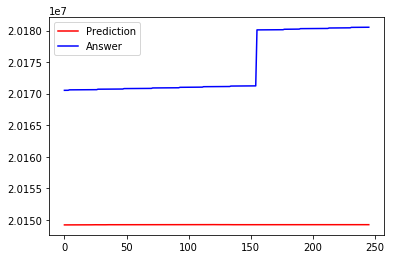

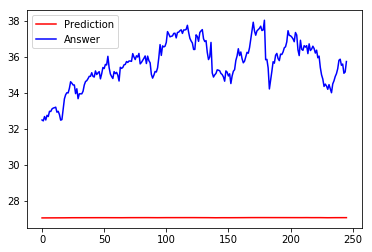

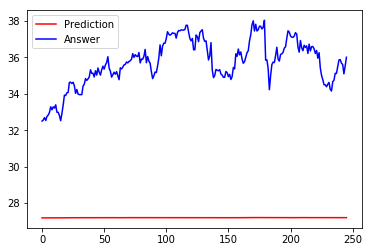

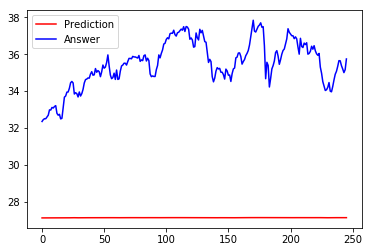

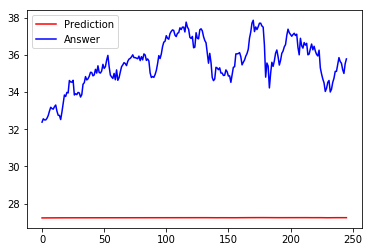

246/246 [==============================] - 3s 11ms/step
[array([[ 20149198.],
       [ 20149198.],
       [ 20149198.],
       [ 20149200.],
       [ 20149198.],
       [ 20149196.],
       [ 20149198.],
       [ 20149200.],
       [ 20149204.],
       [ 20149206.],
       [ 20149206.],
       [ 20149208.],
       [ 20149206.],
       [ 20149212.],
       [ 20149212.],
       [ 20149206.],
       [ 20149206.],
       [ 20149206.],
       [ 20149210.],
       [ 20149214.],
       [ 20149214.],
       [ 20149214.],
       [ 20149212.],
       [ 20149220.],
       [ 20149224.],
       [ 20149222.],
       [ 20149226.],
       [ 20149220.],
       [ 20149218.],
       [ 20149216.],
       [ 20149218.],
       [ 20149220.],
       [ 20149220.],
       [ 20149218.],
       [ 20149224.],
       [ 20149224.],
       [ 20149228.],
       [ 20149224.],
       [ 20149226.],
       [ 20149228.],
       [ 20149226.],
       [ 20149226.],
       [ 20149226.],
       [ 20149232.],
       [ 20149230.]

Train on 602 samples, validate on 258 samples
Epoch 1/50
602/602 [==============================] - 82s 135ms/step - loss: 0.0739 - acc: 0.1578 - val_loss: 0.1732 - val_acc: 0.0000e+00
Epoch 2/50
602/602 [==============================] - 1s 2ms/step - loss: 0.0707 - acc: 0.1744 - val_loss: 0.1670 - val_acc: 0.0000e+00
Epoch 3/50
602/602 [==============================] - 1s 2ms/step - loss: 0.0669 - acc: 0.1794 - val_loss: 0.1583 - val_acc: 0.0000e+00
Epoch 4/50
602/602 [==============================] - 1s 2ms/step - loss: 0.0616 - acc: 0.1827 - val_loss: 0.1461 - val_acc: 0.0000e+00
Epoch 5/50
602/602 [==============================] - 1s 2ms/step - loss: 0.0546 - acc: 0.2027 - val_loss: 0.1301 - val_acc: 0.0000e+00
Epoch 6/50
602/602 [==============================] - 1s 2ms/step - loss: 0.0464 - acc: 0.3007 - val_loss: 0.1108 - val_acc: 0.0000e+00
Epoch 7/50
602/602 [==============================] - 1s 2ms/step - loss: 0.0371 - acc: 0.3040 - val_loss: 0.0900 - val_acc: 0.0000e+00

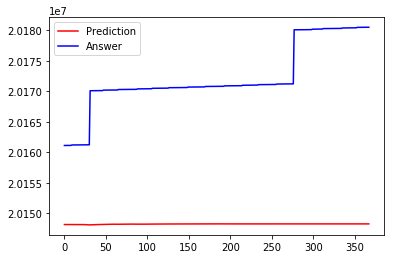

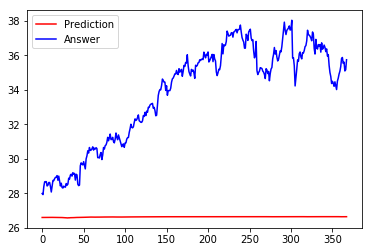

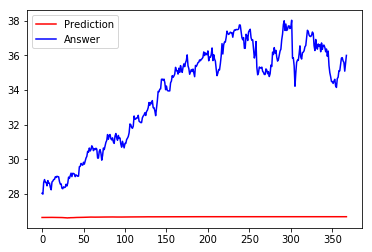

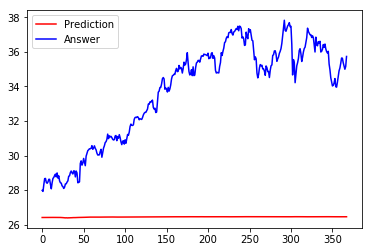

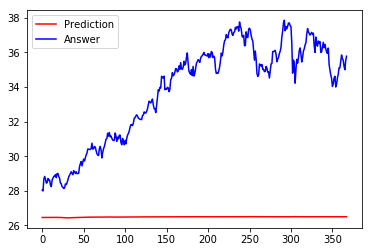

368/368 [==============================] - 0s 383us/step
[array([[ 20148146.],
       [ 20148146.],
       [ 20148148.],
       [ 20148152.],
       [ 20148154.],
       [ 20148158.],
       [ 20148152.],
       [ 20148158.],
       [ 20148158.],
       [ 20148158.],
       [ 20148160.],
       [ 20148154.],
       [ 20148156.],
       [ 20148156.],
       [ 20148156.],
       [ 20148160.],
       [ 20148162.],
       [ 20148160.],
       [ 20148154.],
       [ 20148148.],
       [ 20148152.],
       [ 20148146.],
       [ 20148148.],
       [ 20148144.],
       [ 20148134.],
       [ 20148126.],
       [ 20148114.],
       [ 20148104.],
       [ 20148092.],
       [ 20148100.],
       [ 20148092.],
       [ 20148082.],
       [ 20148100.],
       [ 20148096.],
       [ 20148112.],
       [ 20148112.],
       [ 20148110.],
       [ 20148126.],
       [ 20148124.],
       [ 20148132.],
       [ 20148128.],
       [ 20148138.],
       [ 20148146.],
       [ 20148142.],
       [ 20148150.

Train on 693 samples, validate on 174 samples
Epoch 1/50
693/693 [==============================] - 80s 115ms/step - loss: 0.0757 - acc: 0.0924 - val_loss: 0.2024 - val_acc: 0.0000e+00
Epoch 2/50
693/693 [==============================] - 1s 1ms/step - loss: 0.0692 - acc: 0.0505 - val_loss: 0.1833 - val_acc: 0.0000e+00
Epoch 3/50
693/693 [==============================] - 1s 1ms/step - loss: 0.0572 - acc: 0.0476 - val_loss: 0.1482 - val_acc: 0.0000e+00
Epoch 4/50
693/693 [==============================] - 1s 1ms/step - loss: 0.0403 - acc: 0.0476 - val_loss: 0.1004 - val_acc: 0.0000e+00
Epoch 5/50
693/693 [==============================] - 1s 1ms/step - loss: 0.0259 - acc: 0.0476 - val_loss: 0.0534 - val_acc: 0.0000e+00
Epoch 6/50
693/693 [==============================] - 1s 1ms/step - loss: 0.0241 - acc: 0.0476 - val_loss: 0.0360 - val_acc: 0.0000e+00
Epoch 7/50
693/693 [==============================] - 1s 1ms/step - loss: 0.0224 - acc: 0.1010 - val_loss: 0.0461 - val_acc: 0.0000e+00

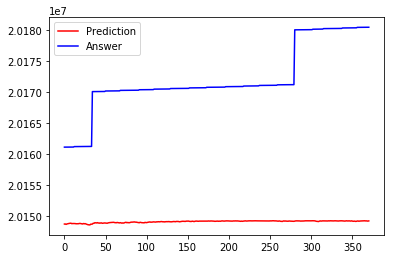

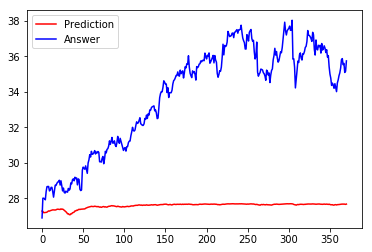

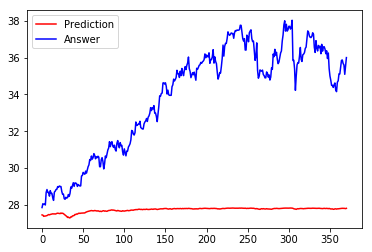

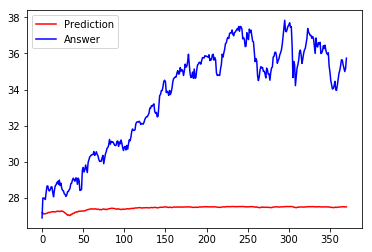

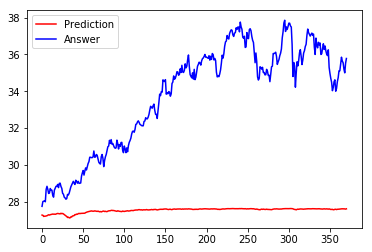

371/371 [==============================] - 0s 318us/step
[array([[ 20148664.],
       [ 20148680.],
       [ 20148610.],
       [ 20148678.],
       [ 20148716.],
       [ 20148742.],
       [ 20148768.],
       [ 20148794.],
       [ 20148798.],
       [ 20148728.],
       [ 20148750.],
       [ 20148746.],
       [ 20148744.],
       [ 20148744.],
       [ 20148710.],
       [ 20148710.],
       [ 20148702.],
       [ 20148718.],
       [ 20148752.],
       [ 20148766.],
       [ 20148732.],
       [ 20148694.],
       [ 20148678.],
       [ 20148750.],
       [ 20148698.],
       [ 20148738.],
       [ 20148686.],
       [ 20148628.],
       [ 20148584.],
       [ 20148550.],
       [ 20148542.],
       [ 20148524.],
       [ 20148646.],
       [ 20148640.],
       [ 20148664.],
       [ 20148796.],
       [ 20148786.],
       [ 20148878.],
       [ 20148852.],
       [ 20148842.],
       [ 20148894.],
       [ 20148822.],
       [ 20148850.],
       [ 20148802.],
       [ 20148838.

Train on 785 samples, validate on 197 samples
Epoch 1/51
785/785 [==============================] - 81s 103ms/step - loss: 0.0873 - acc: 0.1299 - val_loss: 0.3281 - val_acc: 0.0000e+00
Epoch 2/51
785/785 [==============================] - 0s 446us/step - loss: 0.0789 - acc: 0.2599 - val_loss: 0.3021 - val_acc: 0.0000e+00
Epoch 3/51
785/785 [==============================] - 0s 443us/step - loss: 0.0657 - acc: 0.2599 - val_loss: 0.2612 - val_acc: 0.0000e+00
Epoch 4/51
785/785 [==============================] - 0s 480us/step - loss: 0.0479 - acc: 0.2611 - val_loss: 0.2016 - val_acc: 0.0000e+00
Epoch 5/51
785/785 [==============================] - 0s 473us/step - loss: 0.0295 - acc: 0.2369 - val_loss: 0.1289 - val_acc: 0.0000e+00
Epoch 6/51
785/785 [==============================] - 0s 488us/step - loss: 0.0214 - acc: 0.1223 - val_loss: 0.0809 - val_acc: 0.0000e+00
Epoch 7/51
785/785 [==============================] - 0s 533us/step - loss: 0.0184 - acc: 0.3261 - val_loss: 0.0803 - val_acc

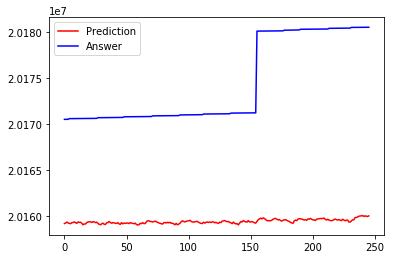

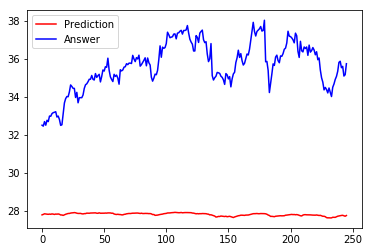

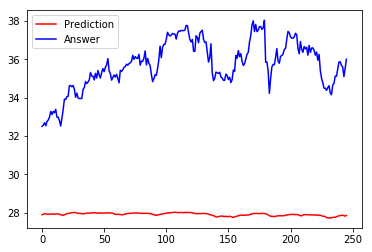

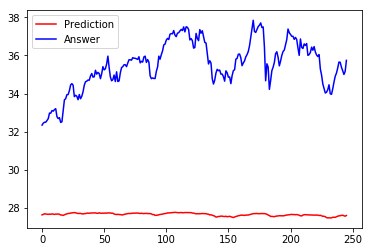

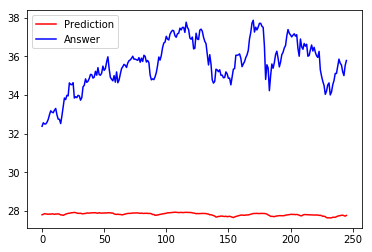

246/246 [==============================] - 0s 220us/step
[array([[ 20159216.],
       [ 20159262.],
       [ 20159376.],
       [ 20159280.],
       [ 20159222.],
       [ 20159202.],
       [ 20159306.],
       [ 20159322.],
       [ 20159394.],
       [ 20159302.],
       [ 20159236.],
       [ 20159388.],
       [ 20159334.],
       [ 20159362.],
       [ 20159238.],
       [ 20159076.],
       [ 20159174.],
       [ 20159158.],
       [ 20159314.],
       [ 20159392.],
       [ 20159392.],
       [ 20159410.],
       [ 20159330.],
       [ 20159416.],
       [ 20159384.],
       [ 20159310.],
       [ 20159362.],
       [ 20159226.],
       [ 20159128.],
       [ 20159074.],
       [ 20159184.],
       [ 20159258.],
       [ 20159138.],
       [ 20159108.],
       [ 20159292.],
       [ 20159322.],
       [ 20159438.],
       [ 20159316.],
       [ 20159252.],
       [ 20159322.],
       [ 20159280.],
       [ 20159238.],
       [ 20159232.],
       [ 20159312.],
       [ 20159176.

Train on 602 samples, validate on 258 samples
Epoch 1/50
602/602 [==============================] - 86s 143ms/step - loss: 0.0727 - acc: 0.2126 - val_loss: 0.1421 - val_acc: 0.0000e+00
Epoch 2/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0499 - acc: 0.3289 - val_loss: 0.0822 - val_acc: 0.0000e+00
Epoch 3/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0282 - acc: 0.3405 - val_loss: 0.0481 - val_acc: 0.0000e+00
Epoch 4/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0252 - acc: 0.3422 - val_loss: 0.0385 - val_acc: 0.0000e+00
Epoch 5/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0221 - acc: 0.2558 - val_loss: 0.0388 - val_acc: 0.0000e+00
Epoch 6/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0195 - acc: 0.1761 - val_loss: 0.0405 - val_acc: 0.0000e+00
Epoch 7/50
602/602 [==============================] - 4s 7ms/step - loss: 0.0196 - acc: 0.0598 - val_loss: 0.0454 - val_acc: 0.0000e+00

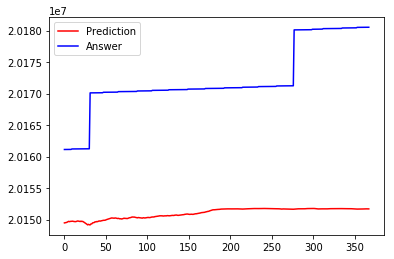

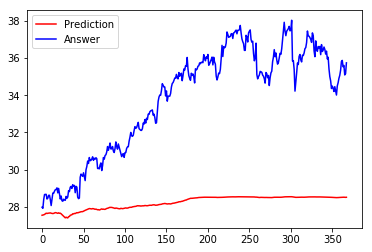

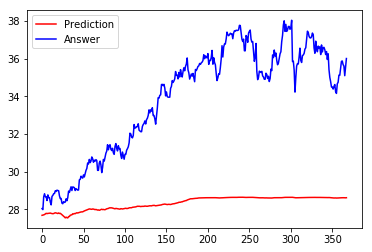

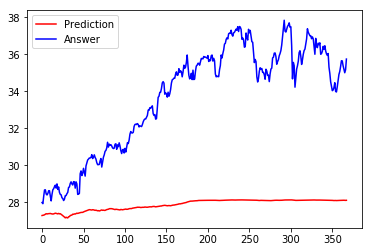

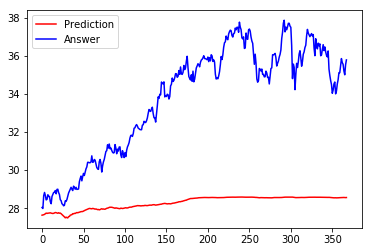

368/368 [==============================] - 1s 2ms/step
[array([[ 20149466.],
       [ 20149490.],
       [ 20149520.],
       [ 20149562.],
       [ 20149642.],
       [ 20149710.],
       [ 20149666.],
       [ 20149702.],
       [ 20149708.],
       [ 20149726.],
       [ 20149738.],
       [ 20149700.],
       [ 20149686.],
       [ 20149662.],
       [ 20149682.],
       [ 20149734.],
       [ 20149772.],
       [ 20149754.],
       [ 20149720.],
       [ 20149682.],
       [ 20149750.],
       [ 20149686.],
       [ 20149708.],
       [ 20149634.],
       [ 20149540.],
       [ 20149450.],
       [ 20149346.],
       [ 20149264.],
       [ 20149154.],
       [ 20149240.],
       [ 20149172.],
       [ 20149146.],
       [ 20149306.],
       [ 20149316.],
       [ 20149468.],
       [ 20149494.],
       [ 20149528.],
       [ 20149646.],
       [ 20149622.],
       [ 20149682.],
       [ 20149662.],
       [ 20149730.],
       [ 20149778.],
       [ 20149746.],
       [ 20149784.],

Train on 792 samples, validate on 198 samples
Epoch 1/51
792/792 [==============================] - 87s 110ms/step - loss: 0.0850 - acc: 0.2563 - val_loss: 0.3119 - val_acc: 0.0000e+00
Epoch 2/51
792/792 [==============================] - 5s 7ms/step - loss: 0.0670 - acc: 0.2551 - val_loss: 0.2390 - val_acc: 0.0000e+00
Epoch 3/51
792/792 [==============================] - 6s 7ms/step - loss: 0.0399 - acc: 0.2210 - val_loss: 0.1523 - val_acc: 0.0000e+00
Epoch 4/51
792/792 [==============================] - 6s 7ms/step - loss: 0.0258 - acc: 0.1780 - val_loss: 0.0840 - val_acc: 0.0000e+00
Epoch 5/51
792/792 [==============================] - 6s 7ms/step - loss: 0.0247 - acc: 0.2487 - val_loss: 0.0897 - val_acc: 1.0000
Epoch 6/51
792/792 [==============================] - 6s 7ms/step - loss: 0.0216 - acc: 0.4558 - val_loss: 0.1186 - val_acc: 1.0000
Epoch 7/51
792/792 [==============================] - 6s 7ms/step - loss: 0.0222 - acc: 0.4545 - val_loss: 0.1244 - val_acc: 1.0000
Epoch 8/51


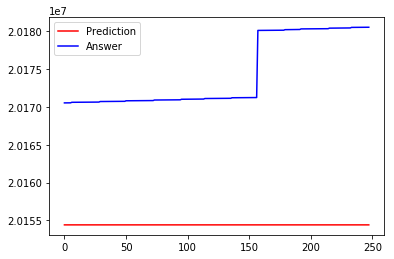

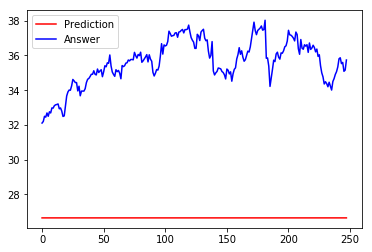

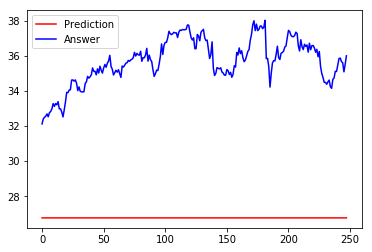

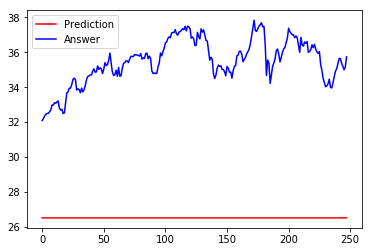

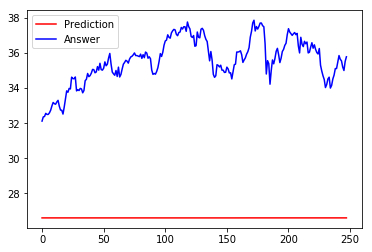

248/248 [==============================] - 0s 2ms/step
[array([[ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154398.],
       [ 20154398.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154398.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154398.],
       [ 20154398.],
       [ 20154398.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154402.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154398.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],
       [ 20154400.],

Train on 698 samples, validate on 300 samples
Epoch 1/50
698/698 [==============================] - 82s 117ms/step - loss: 0.0743 - acc: 0.2006 - val_loss: 0.2668 - val_acc: 0.0000e+00
Epoch 2/50
698/698 [==============================] - 0s 636us/step - loss: 0.0688 - acc: 0.1819 - val_loss: 0.2471 - val_acc: 0.0000e+00
Epoch 3/50
698/698 [==============================] - 0s 706us/step - loss: 0.0584 - acc: 0.1920 - val_loss: 0.2078 - val_acc: 0.0000e+00
Epoch 4/50
698/698 [==============================] - 0s 669us/step - loss: 0.0405 - acc: 0.2378 - val_loss: 0.1470 - val_acc: 0.0000e+00
Epoch 5/50
698/698 [==============================] - 1s 814us/step - loss: 0.0231 - acc: 0.2264 - val_loss: 0.0801 - val_acc: 0.0000e+00
Epoch 6/50
698/698 [==============================] - 0s 703us/step - loss: 0.0221 - acc: 0.2264 - val_loss: 0.0572 - val_acc: 0.0000e+00
Epoch 7/50
698/698 [==============================] - 0s 668us/step - loss: 0.0221 - acc: 0.2092 - val_loss: 0.0752 - val_acc

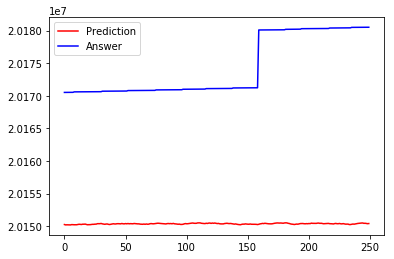

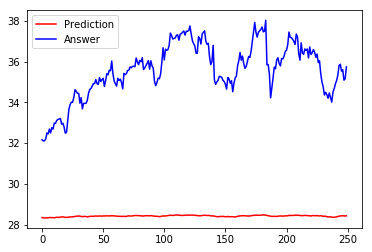

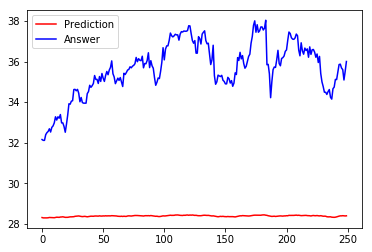

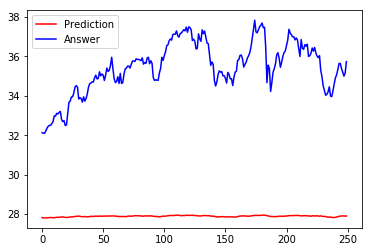

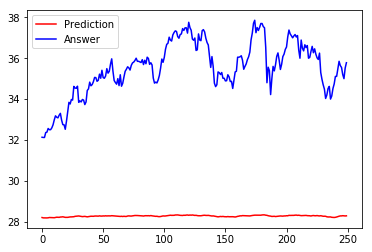

250/250 [==============================] - 0s 216us/step
[array([[ 20150236.],
       [ 20150180.],
       [ 20150196.],
       [ 20150192.],
       [ 20150186.],
       [ 20150178.],
       [ 20150226.],
       [ 20150208.],
       [ 20150202.],
       [ 20150196.],
       [ 20150204.],
       [ 20150238.],
       [ 20150278.],
       [ 20150254.],
       [ 20150244.],
       [ 20150290.],
       [ 20150284.],
       [ 20150306.],
       [ 20150246.],
       [ 20150204.],
       [ 20150220.],
       [ 20150218.],
       [ 20150242.],
       [ 20150270.],
       [ 20150270.],
       [ 20150296.],
       [ 20150298.],
       [ 20150368.],
       [ 20150368.],
       [ 20150366.],
       [ 20150402.],
       [ 20150342.],
       [ 20150304.],
       [ 20150274.],
       [ 20150310.],
       [ 20150324.],
       [ 20150268.],
       [ 20150240.],
       [ 20150284.],
       [ 20150318.],
       [ 20150354.],
       [ 20150326.],
       [ 20150324.],
       [ 20150362.],
       [ 20150368.

Train on 602 samples, validate on 258 samples
Epoch 1/51
602/602 [==============================] - 84s 139ms/step - loss: 0.0736 - acc: 0.0615 - val_loss: 0.1727 - val_acc: 0.0000e+00
Epoch 2/51
602/602 [==============================] - 1s 905us/step - loss: 0.0693 - acc: 0.0565 - val_loss: 0.1630 - val_acc: 0.0000e+00
Epoch 3/51
602/602 [==============================] - 1s 934us/step - loss: 0.0627 - acc: 0.0548 - val_loss: 0.1467 - val_acc: 0.0000e+00
Epoch 4/51
602/602 [==============================] - 1s 985us/step - loss: 0.0521 - acc: 0.0631 - val_loss: 0.1211 - val_acc: 0.0000e+00
Epoch 5/51
602/602 [==============================] - 1s 934us/step - loss: 0.0378 - acc: 0.0598 - val_loss: 0.0852 - val_acc: 0.0000e+00
Epoch 6/51
602/602 [==============================] - 1s 950us/step - loss: 0.0237 - acc: 0.0598 - val_loss: 0.0493 - val_acc: 0.0000e+00
Epoch 7/51
602/602 [==============================] - 1s 947us/step - loss: 0.0205 - acc: 0.0664 - val_loss: 0.0350 - val_acc

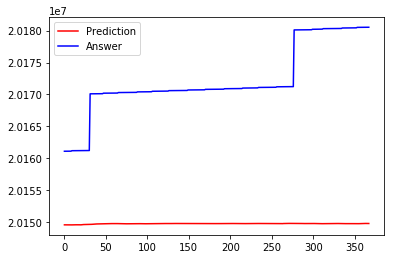

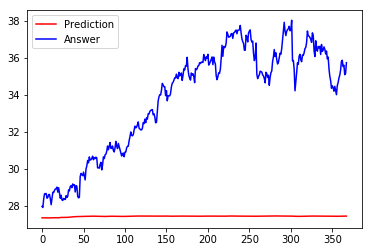

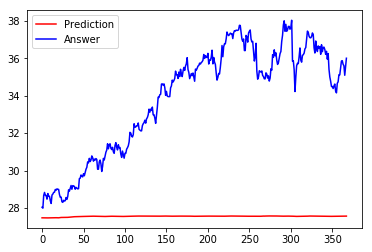

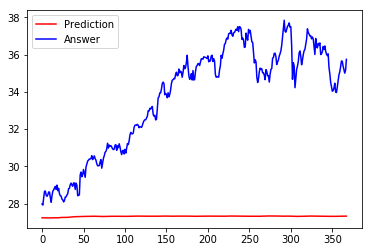

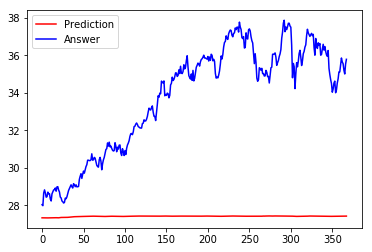

368/368 [==============================] - 0s 353us/step
[array([[ 20149600.],
       [ 20149602.],
       [ 20149596.],
       [ 20149592.],
       [ 20149598.],
       [ 20149596.],
       [ 20149592.],
       [ 20149590.],
       [ 20149588.],
       [ 20149592.],
       [ 20149598.],
       [ 20149602.],
       [ 20149606.],
       [ 20149612.],
       [ 20149608.],
       [ 20149602.],
       [ 20149608.],
       [ 20149614.],
       [ 20149606.],
       [ 20149602.],
       [ 20149602.],
       [ 20149620.],
       [ 20149634.],
       [ 20149644.],
       [ 20149646.],
       [ 20149652.],
       [ 20149654.],
       [ 20149654.],
       [ 20149656.],
       [ 20149654.],
       [ 20149654.],
       [ 20149660.],
       [ 20149670.],
       [ 20149680.],
       [ 20149692.],
       [ 20149702.],
       [ 20149710.],
       [ 20149722.],
       [ 20149730.],
       [ 20149738.],
       [ 20149742.],
       [ 20149746.],
       [ 20149752.],
       [ 20149754.],
       [ 20149758.

other_random_chromosome: 0
i_th chromosome: 2
other_random_chromosome: 3
i_th chromosome: 3
other_random_chromosome: 1
i_th chromosome: 4
other_random_chromosome: 1

iteration_now= 9
78
Train on 792 samples, validate on 198 samples
Epoch 1/50
792/792 [==============================] - 108s 136ms/step - loss: 0.0805 - acc: 0.3056 - val_loss: 0.2419 - val_acc: 0.0000e+00
Epoch 2/50
792/792 [==============================] - 21s 27ms/step - loss: 0.0348 - acc: 0.3018 - val_loss: 0.0921 - val_acc: 1.0000
Epoch 3/50
792/792 [==============================] - 22s 27ms/step - loss: 0.0240 - acc: 0.4066 - val_loss: 0.1012 - val_acc: 1.0000
Epoch 4/50
792/792 [==============================] - 22s 27ms/step - loss: 0.0214 - acc: 0.1275 - val_loss: 0.1238 - val_acc: 0.0000e+00
Epoch 5/50
792/792 [==============================] - 21s 27ms/step - loss: 0.0214 - acc: 0.2210 - val_loss: 0.1056 - val_acc: 1.0000
Epoch 6/50
792/792 [==============================] - 21s 27ms/step - loss: 0.0212 - acc

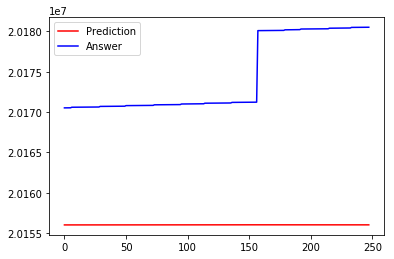

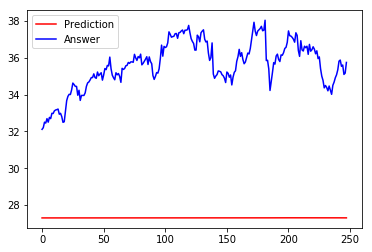

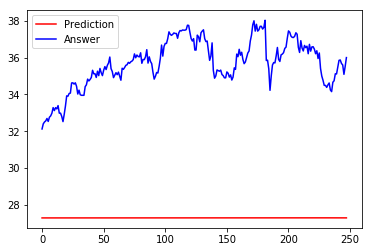

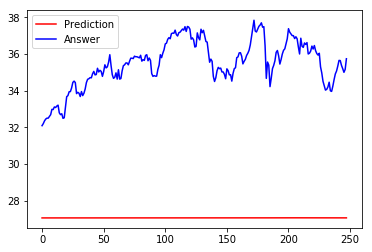

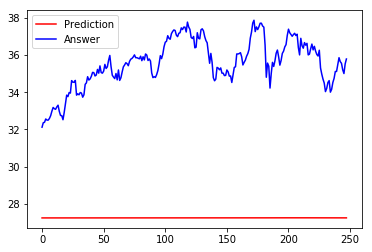

248/248 [==============================] - 2s 8ms/step
[array([[ 20156006.],
       [ 20156006.],
       [ 20156006.],
       [ 20156006.],
       [ 20156008.],
       [ 20156006.],
       [ 20156006.],
       [ 20156006.],
       [ 20156006.],
       [ 20156006.],
       [ 20156008.],
       [ 20156008.],
       [ 20156006.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156006.],
       [ 20156006.],
       [ 20156006.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156010.],
       [ 20156010.],
       [ 20156010.],
       [ 20156010.],
       [ 20156010.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156008.],
       [ 20156010.],
       [ 20156010.],
       [ 20156008.],
       [ 20156010.],
       [ 20156010.],
       [ 20156010.],
       [ 20156010.],

Train on 687 samples, validate on 295 samples
Epoch 1/51
687/687 [==============================] - 117s 171ms/step - loss: 0.0472 - acc: 0.0684 - val_loss: 0.0609 - val_acc: 0.0000e+00
Epoch 2/51
687/687 [==============================] - 34s 49ms/step - loss: 0.0210 - acc: 0.2183 - val_loss: 0.1114 - val_acc: 1.0000
Epoch 3/51
687/687 [==============================] - 34s 50ms/step - loss: 0.0197 - acc: 0.3130 - val_loss: 0.0800 - val_acc: 1.0000
Epoch 4/51
687/687 [==============================] - 34s 49ms/step - loss: 0.0195 - acc: 0.3130 - val_loss: 0.0997 - val_acc: 0.0000e+00
Epoch 5/51
687/687 [==============================] - 34s 50ms/step - loss: 0.0194 - acc: 0.2882 - val_loss: 0.0900 - val_acc: 1.0000
Epoch 6/51
687/687 [==============================] - 34s 49ms/step - loss: 0.0192 - acc: 0.3144 - val_loss: 0.0925 - val_acc: 1.0000
Epoch 7/51
687/687 [==============================] - 34s 49ms/step - loss: 0.0190 - acc: 0.3348 - val_loss: 0.0923 - val_acc: 1.0000
Epoch 

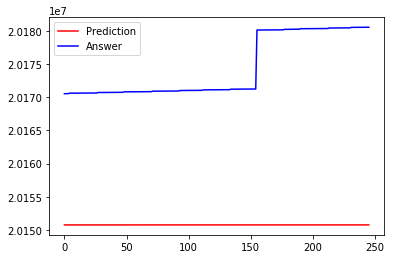

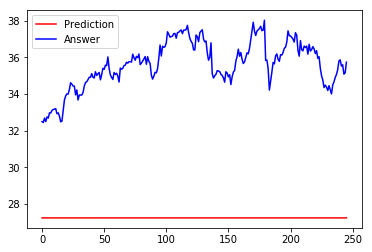

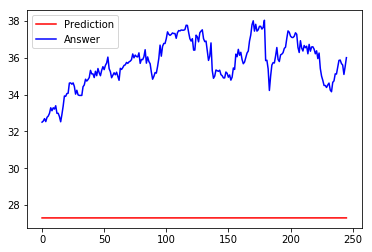

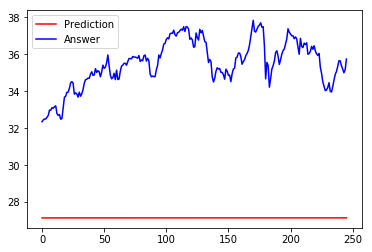

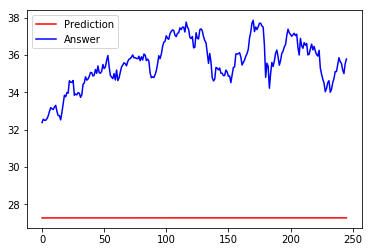

246/246 [==============================] - 3s 13ms/step
[array([[ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150782.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.],
       [ 20150784.]

Train on 785 samples, validate on 197 samples
Epoch 1/50
785/785 [==============================] - 91s 116ms/step - loss: 0.0885 - acc: 0.2535 - val_loss: 0.3295 - val_acc: 1.0000
Epoch 2/50
785/785 [==============================] - 7s 9ms/step - loss: 0.0809 - acc: 0.4548 - val_loss: 0.2960 - val_acc: 1.0000
Epoch 3/50
785/785 [==============================] - 7s 9ms/step - loss: 0.0655 - acc: 0.4624 - val_loss: 0.2450 - val_acc: 1.0000
Epoch 4/50
785/785 [==============================] - 7s 10ms/step - loss: 0.0460 - acc: 0.4637 - val_loss: 0.1816 - val_acc: 1.0000
Epoch 5/50
785/785 [==============================] - 7s 9ms/step - loss: 0.0292 - acc: 0.4662 - val_loss: 0.1100 - val_acc: 1.0000
Epoch 6/50
785/785 [==============================] - 7s 9ms/step - loss: 0.0241 - acc: 0.4624 - val_loss: 0.0704 - val_acc: 1.0000
Epoch 7/50
785/785 [==============================] - 8s 10ms/step - loss: 0.0245 - acc: 0.4624 - val_loss: 0.0765 - val_acc: 1.0000
Epoch 8/50
785/785 [=====

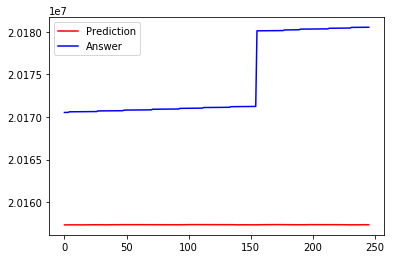

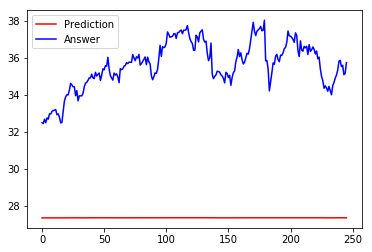

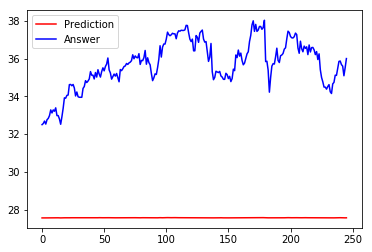

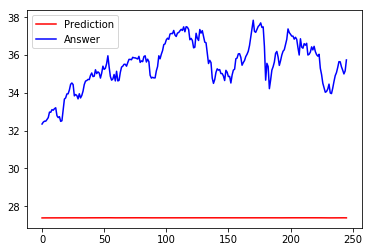

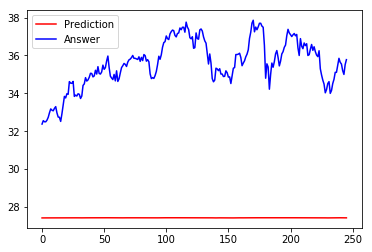

246/246 [==============================] - 1s 2ms/step
[array([[ 20157330.],
       [ 20157338.],
       [ 20157336.],
       [ 20157334.],
       [ 20157338.],
       [ 20157340.],
       [ 20157338.],
       [ 20157344.],
       [ 20157340.],
       [ 20157338.],
       [ 20157338.],
       [ 20157342.],
       [ 20157342.],
       [ 20157342.],
       [ 20157334.],
       [ 20157334.],
       [ 20157338.],
       [ 20157340.],
       [ 20157344.],
       [ 20157344.],
       [ 20157348.],
       [ 20157352.],
       [ 20157350.],
       [ 20157352.],
       [ 20157354.],
       [ 20157354.],
       [ 20157356.],
       [ 20157352.],
       [ 20157348.],
       [ 20157344.],
       [ 20157348.],
       [ 20157354.],
       [ 20157344.],
       [ 20157340.],
       [ 20157344.],
       [ 20157350.],
       [ 20157354.],
       [ 20157356.],
       [ 20157352.],
       [ 20157354.],
       [ 20157356.],
       [ 20157358.],
       [ 20157356.],
       [ 20157354.],
       [ 20157350.],

Train on 602 samples, validate on 258 samples
Epoch 1/51
602/602 [==============================] - 95s 158ms/step - loss: 0.0729 - acc: 0.1047 - val_loss: 0.1600 - val_acc: 0.0000e+00
Epoch 2/51
602/602 [==============================] - 9s 15ms/step - loss: 0.0581 - acc: 0.1246 - val_loss: 0.1202 - val_acc: 0.0000e+00
Epoch 3/51
602/602 [==============================] - 10s 16ms/step - loss: 0.0384 - acc: 0.0997 - val_loss: 0.0825 - val_acc: 0.0000e+00
Epoch 4/51
602/602 [==============================] - 10s 16ms/step - loss: 0.0254 - acc: 0.1312 - val_loss: 0.0523 - val_acc: 0.0000e+00
Epoch 5/51
602/602 [==============================] - 9s 16ms/step - loss: 0.0218 - acc: 0.2159 - val_loss: 0.0378 - val_acc: 0.0000e+00
Epoch 6/51
602/602 [==============================] - 10s 16ms/step - loss: 0.0208 - acc: 0.2841 - val_loss: 0.0388 - val_acc: 1.0000
Epoch 7/51
602/602 [==============================] - 10s 16ms/step - loss: 0.0202 - acc: 0.2708 - val_loss: 0.0480 - val_acc: 0.00

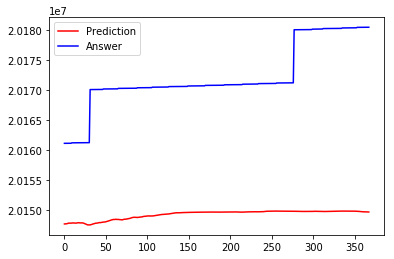

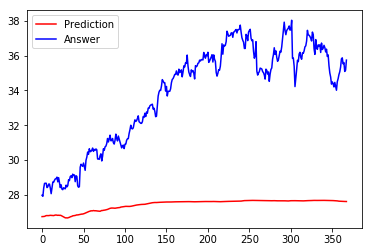

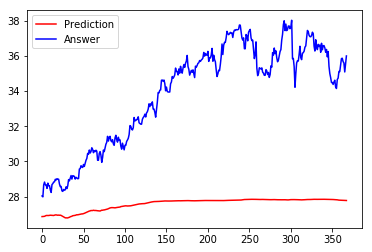

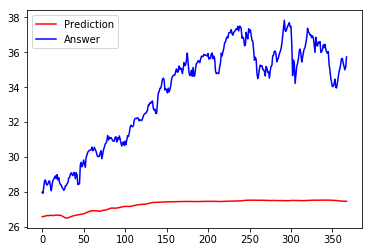

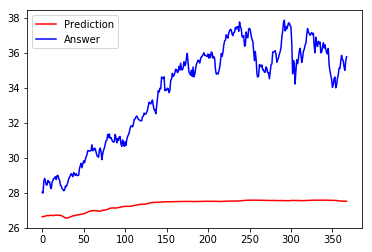

368/368 [==============================] - 1s 4ms/step
[array([[ 20147640.],
       [ 20147648.],
       [ 20147662.],
       [ 20147676.],
       [ 20147728.],
       [ 20147780.],
       [ 20147774.],
       [ 20147780.],
       [ 20147776.],
       [ 20147792.],
       [ 20147814.],
       [ 20147802.],
       [ 20147788.],
       [ 20147774.],
       [ 20147780.],
       [ 20147810.],
       [ 20147848.],
       [ 20147852.],
       [ 20147836.],
       [ 20147810.],
       [ 20147826.],
       [ 20147808.],
       [ 20147818.],
       [ 20147782.],
       [ 20147726.],
       [ 20147670.],
       [ 20147608.],
       [ 20147548.],
       [ 20147486.],
       [ 20147490.],
       [ 20147482.],
       [ 20147480.],
       [ 20147528.],
       [ 20147554.],
       [ 20147626.],
       [ 20147660.],
       [ 20147688.],
       [ 20147750.],
       [ 20147762.],
       [ 20147790.],
       [ 20147796.],
       [ 20147834.],
       [ 20147870.],
       [ 20147858.],
       [ 20147876.],

Train on 693 samples, validate on 297 samples
Epoch 1/50
693/693 [==============================] - 88s 127ms/step - loss: 0.0761 - acc: 0.1876 - val_loss: 0.2714 - val_acc: 0.0000e+00
Epoch 2/50
693/693 [==============================] - 2s 3ms/step - loss: 0.0705 - acc: 0.1818 - val_loss: 0.2473 - val_acc: 0.0000e+00
Epoch 3/50
693/693 [==============================] - 2s 3ms/step - loss: 0.0572 - acc: 0.1039 - val_loss: 0.2057 - val_acc: 0.0000e+00
Epoch 4/50
693/693 [==============================] - 2s 3ms/step - loss: 0.0402 - acc: 0.1068 - val_loss: 0.1544 - val_acc: 0.0000e+00
Epoch 5/50
693/693 [==============================] - 2s 3ms/step - loss: 0.0258 - acc: 0.1429 - val_loss: 0.0989 - val_acc: 0.0000e+00
Epoch 6/50
693/693 [==============================] - 2s 3ms/step - loss: 0.0231 - acc: 0.2121 - val_loss: 0.0713 - val_acc: 0.0000e+00
Epoch 7/50
693/693 [==============================] - 2s 3ms/step - loss: 0.0221 - acc: 0.2251 - val_loss: 0.0797 - val_acc: 1.0000
Epo

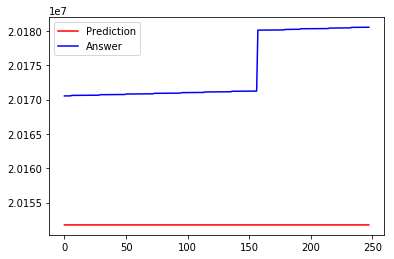

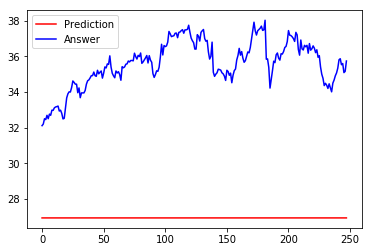

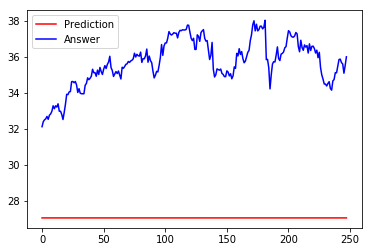

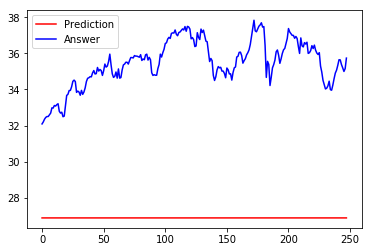

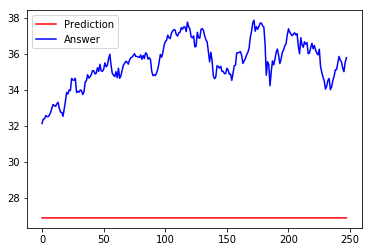

248/248 [==============================] - 0s 629us/step
[array([[ 20151746.],
       [ 20151746.],
       [ 20151746.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.],
       [ 20151748.

Train on 693 samples, validate on 174 samples
Epoch 1/51
693/693 [==============================] - 87s 126ms/step - loss: 0.0701 - acc: 0.2193 - val_loss: 0.1755 - val_acc: 0.0000e+00
Epoch 2/51
693/693 [==============================] - 1s 902us/step - loss: 0.0456 - acc: 0.2208 - val_loss: 0.1074 - val_acc: 0.0000e+00
Epoch 3/51
693/693 [==============================] - 1s 906us/step - loss: 0.0253 - acc: 0.2208 - val_loss: 0.0536 - val_acc: 0.0000e+00
Epoch 4/51
693/693 [==============================] - 1s 952us/step - loss: 0.0210 - acc: 0.1876 - val_loss: 0.0531 - val_acc: 0.0000e+00
Epoch 5/51
693/693 [==============================] - 1s 1ms/step - loss: 0.0182 - acc: 0.1833 - val_loss: 0.0569 - val_acc: 1.0000
Epoch 6/51
693/693 [==============================] - 1s 867us/step - loss: 0.0171 - acc: 0.3766 - val_loss: 0.0441 - val_acc: 1.0000
Epoch 7/51
693/693 [==============================] - 1s 898us/step - loss: 0.0139 - acc: 0.3737 - val_loss: 0.0320 - val_acc: 1.0000
E

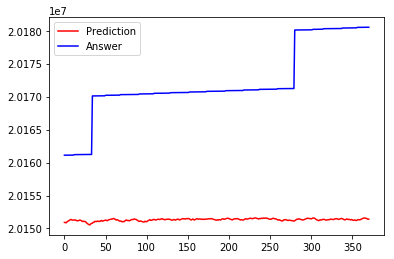

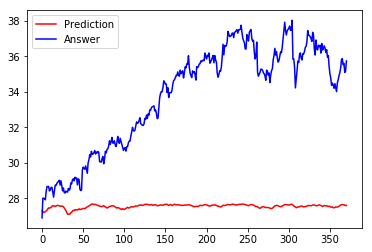

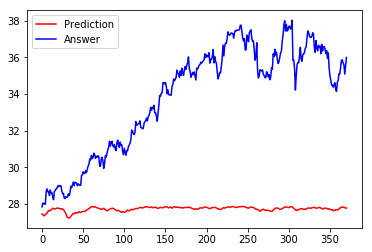

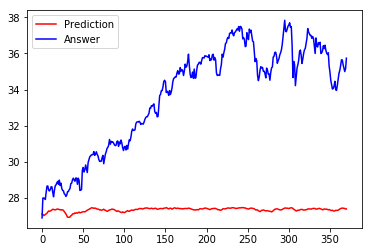

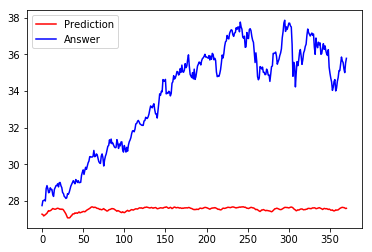

371/371 [==============================] - 0s 305us/step
[array([[ 20150922.],
       [ 20150912.],
       [ 20150862.],
       [ 20150986.],
       [ 20151090.],
       [ 20151168.],
       [ 20151222.],
       [ 20151318.],
       [ 20151370.],
       [ 20151298.],
       [ 20151288.],
       [ 20151272.],
       [ 20151288.],
       [ 20151306.],
       [ 20151234.],
       [ 20151186.],
       [ 20151166.],
       [ 20151190.],
       [ 20151244.],
       [ 20151274.],
       [ 20151226.],
       [ 20151146.],
       [ 20151054.],
       [ 20151116.],
       [ 20151042.],
       [ 20151084.],
       [ 20150980.],
       [ 20150842.],
       [ 20150746.],
       [ 20150648.],
       [ 20150582.],
       [ 20150542.],
       [ 20150690.],
       [ 20150768.],
       [ 20150804.],
       [ 20150940.],
       [ 20150954.],
       [ 20151082.],
       [ 20151064.],
       [ 20151042.],
       [ 20151130.],
       [ 20151072.],
       [ 20151108.],
       [ 20151070.],
       [ 20151150.

Train on 884 samples, validate on 221 samples
Epoch 1/51
884/884 [==============================] - 108s 122ms/step - loss: 0.0853 - acc: 0.0713 - val_loss: 0.3203 - val_acc: 0.0588
Epoch 2/51
884/884 [==============================] - 22s 25ms/step - loss: 0.0305 - acc: 0.2511 - val_loss: 0.2234 - val_acc: 0.0860
Epoch 3/51
884/884 [==============================] - 22s 25ms/step - loss: 0.0273 - acc: 0.2489 - val_loss: 0.2396 - val_acc: 0.5701
Epoch 4/51
884/884 [==============================] - 22s 25ms/step - loss: 0.0257 - acc: 0.5226 - val_loss: 0.2197 - val_acc: 0.5701
Epoch 5/51
884/884 [==============================] - 22s 25ms/step - loss: 0.0252 - acc: 0.5158 - val_loss: 0.2347 - val_acc: 0.5701
Epoch 6/51
884/884 [==============================] - 23s 25ms/step - loss: 0.0250 - acc: 0.5226 - val_loss: 0.2236 - val_acc: 0.5701
Epoch 7/51
884/884 [==============================] - 22s 25ms/step - loss: 0.0251 - acc: 0.5215 - val_loss: 0.2334 - val_acc: 0.5701
Epoch 8/51
884

RuntimeError: Can't decrement id ref count (Unable to extend file properly)

In [12]:
filename="featured/0053_close.csv"
#GA + regression ->main
import datetime
#init parameter
iteration=10
iteration_now=0
population=10
rank_number=5

cross_rate=0.1
mutation_rate=0.1

y_target=0#fitnessvalue的目標，到達就停止迭代->望小
y_best=100000#目前為止(所有迭代中)最好的fitnessvalue
y_now=100000#當前此迭代中最好的fitnessvalue
x_best=[]

population_list=create_population(population)#產生初始母體染色體

Totalstarttime=datetime.datetime.now()
print("Start GA: "+str(Totalstarttime))
while(not(iteration_now>=iteration or y_best<y_target)):
    iteration_now=iteration_now+1
    print("\niteration_now= "+str(iteration_now))
    Y=calculateY_rank(rank_number,population_list,filename) #return X_final(前15名的染色體) & best_result(此代最好的fitness跟染色體)
    y_now=Y[1][0]
    print("y_now= "+str(y_now))
    if y_now<y_best:
        y_best=y_now
        print("y_best= "+str(y_best))
        x_best=Y[1][1]
        #print("x_best= "+str(x_best))
    population_list=create_new_x(rank_number,population,cross_rate,mutation_rate,Y[0])

print("iteration_now= "+str(iteration_now))
print("y_best= "+str(y_best))
print("x_best= "+str(x_best))

print("GA's end time is "+str(datetime.datetime.now()))
print("All time spends:  "+str(datetime.datetime.now()-Totalstarttime))

In [13]:
x_best

[30, 0.2, 128, 1, 300, 50, 0.2, 'relu', 'relu', 0.2]

In [14]:
y_best

0.21334636586952985